In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pylab
import seaborn as sns
from glob import glob
from operator import itemgetter
import random
import sys
import os

In [3]:
import scipy.stats as stats
from sklearn.linear_model import BayesianRidge, QuantileRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PowerTransformer, SplineTransformer, OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.base import clone
from statannotations.Annotator import Annotator

In [4]:
from neuroCombat import neuroCombat, neuroCombatFromTraining
# from neurocombat_sklearn import CombatModel

In [5]:
sys.path.insert(0, '/home/ROBARTS/myousif/software/PCNtoolkit/')
from pcntoolkit.util.utils import create_design_matrix

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
idp_paths = ['../data/training_data/thickness_den-2mm_IDP.txt',
             '../data/training_data/gyrification_den-2mm_IDP.txt',
             '../data/training_data/myelin_den-2mm_desc-thresholded_zscore-1p75_IDP.txt',
             '../data/training_data/fa_den-2mm_desc-thresholded_zscore-1p4_IDP.txt',
             '../data/training_data/md_den-2mm_desc-thresholded_zscore-1p6_IDP.txt']

df_paths = ['../data/training_data/thickness_participants_data.csv',
            '../data/training_data/gyrification_participants_data.csv',
            '../data/training_data/myelin_participants_thresholded_zscore-1p75_data.csv',
            '../data/training_data/fa_participants_thresholded_zscore-1p4_data.csv',
            '../data/training_data/md_participants_thresholded_zscore-1p6_data.csv']

In [7]:
split_data_wholehipp = lambda data: [hemi for hemi in np.split(data,2)]

In [8]:
dfs_covs = [pd.read_csv(p,index_col=0) for p in df_paths]
cov_data = dfs_covs

In [9]:
data_idp = [np.loadtxt(p) for p in idp_paths]
resp_data_all = data_idp

In [10]:
resp_data = [p.mean(axis=1) for p in data_idp]

In [11]:
snsx_df = pd.read_csv('../data/snsx_data/snsx_data_collection.csv')

In [12]:
dataset_path = '/home/ROBARTS/myousif/graham/projects/ctb-akhanf/myousif9/norm_models/datasets/'

In [15]:
train_vol_df = pd.read_csv('../data/training_data/volume_master_training_dataset.csv',index_col=0)

In [17]:
train_vol_df.head()

,participant_id,age,sex,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,hippo_total,site,dataset
0,sub-0036,23.75,F,L,572.665685,1090.624489,178.932618,418.839016,151.602189,176.876891,721.959016,10.723531,3322.223434,aomic_piop1,aomic_piop1
1,sub-0036,23.75,F,R,670.495406,1236.715774,125.183834,344.184465,214.774303,170.167332,822.819950,5.701701,3590.042765,aomic_piop1,aomic_piop1
2,sub-0162,18.75,M,L,683.416990,1123.781491,173.323434,446.851640,163.869428,176.397907,804.505122,13.020395,3585.166407,aomic_piop1,aomic_piop1
3,sub-0162,18.75,M,R,555.700526,1270.123183,171.929104,367.841519,208.980934,177.121130,795.410557,21.683435,3568.790388,aomic_piop1,aomic_piop1
4,sub-0033,23.25,F,L,489.951459,944.891617,143.246151,300.276279,209.876364,137.135255,602.589524,5.352778,2833.319425,aomic_piop1,aomic_piop1


In [20]:
snsx_vol_df =  pd.read_csv('../data/snsx_data/snsx_volume_ipsi_data.csv',index_col=0)
eplink_vol_df = pd.read_csv('../data/eplink_data/eplink_volume_data.csv',index_col=0)

In [ ]:
sns.histplot(data=vol_df[vol_df.hemi == 'L']

age_range_dict = dict(zip([23.5,28,33],[22,26,31]))
for cov_dset_selection in cov_data:
    for age in cov_dset_selection[cov_dset_selection.dataset =='hcp1200'].age.unique():
        idxs = (cov_dset_selection[cov_dset_selection.dataset =='hcp1200'].age == age).index
        np.random.seed(0)
        new_ints = np.random.randint(age_range_dict[age],age_range_dict[age]+5,len(idxs))
        for idx_arr, idx_df in enumerate(idxs):
            cov_dset_selection.iloc[idx_df,3] = new_ints[idx_arr]

'/home/ROBARTS/myousif/projects_inprogress/nm_fullhippo'

for idx, metric in enumerate(['thickness','curvature','gyrification','myelin']):
    cov_data[idx].to_csv(f'{metric}_cov_randomhcp1200_df.csv')

design_mat_linear = []
design_mat_bspline = []
for idx, metric in enumerate(['thickness','curvature','gyrification','myelin']):
    X_linear = pd.concat([cov_data[idx][['age','sex_code']],pd.get_dummies(cov_data[idx]['site_code'])],axis=1)
    X_bspline = create_design_matrix(cov_data[idx][['age','sex_code']],
                                     site_ids=cov_data[idx]['site_code'],
                                     all_sites=np.unique(cov_data[idx]['site_code']))
    design_mat_linear.append(X_linear)
    design_mat_bspline.append(X_bspline)

for idx, metric in enumerate(['thickness','curvature','gyrification','myelin']):
    np.savetxt(f'{metric}_cov_bspline.txt',design_mat_bspline[idx])
    np.savetxt(f'{metric}_cov_linear.txt',design_mat_linear[idx])

<AxesSubplot: xlabel='age', ylabel='Count'>

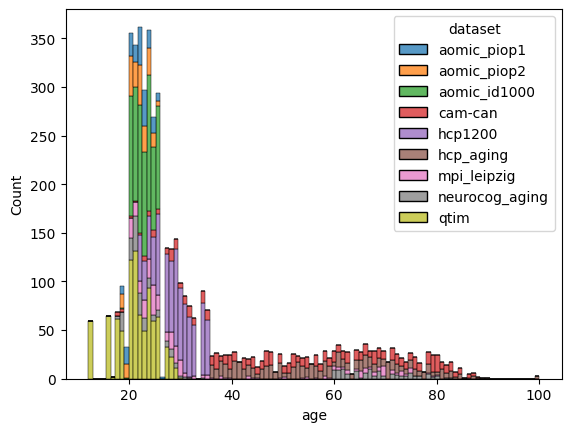

In [12]:
sns.histplot(cov_data[0],x='age',hue='dataset',bins=100,multiple='stack')

<AxesSubplot: xlabel='age', ylabel='Count'>

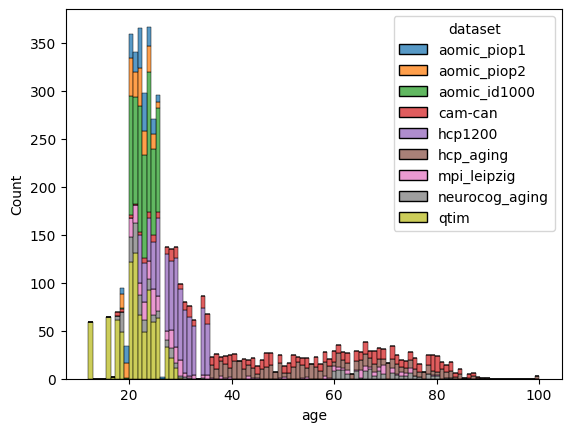

In [13]:
sns.histplot(cov_data[1],x='age',hue='dataset',bins=100,multiple='stack')

<AxesSubplot: xlabel='age', ylabel='Count'>

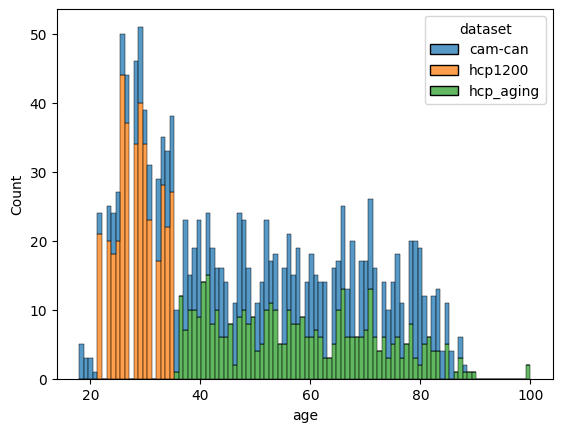

In [14]:
sns.histplot(cov_data[2],x='age',hue='dataset',bins=100,multiple='stack')

<AxesSubplot: xlabel='age', ylabel='Count'>

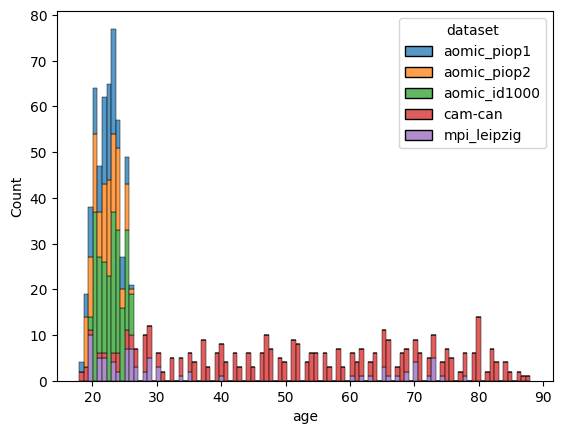

In [15]:
sns.histplot(cov_data[3],x='age',hue='dataset',bins=100,multiple='stack')

[Text(0, 0, '416'), Text(0, 0, '386')]

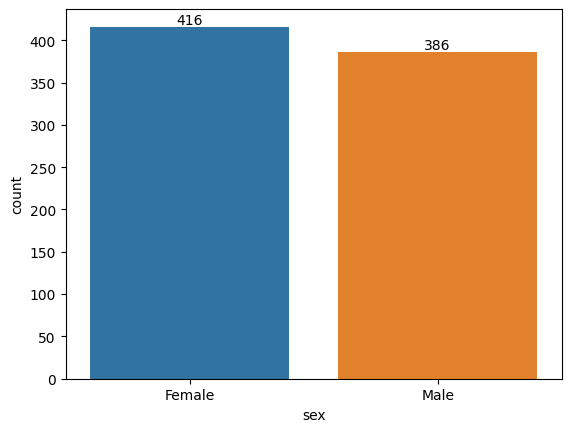

In [119]:
ax = sns.countplot(x=cov_data[4].sex.str.replace('F','Female').str.replace('M','Male'),)
ax.bar_label(ax.containers[0])


<AxesSubplot: xlabel='age', ylabel='Count'>

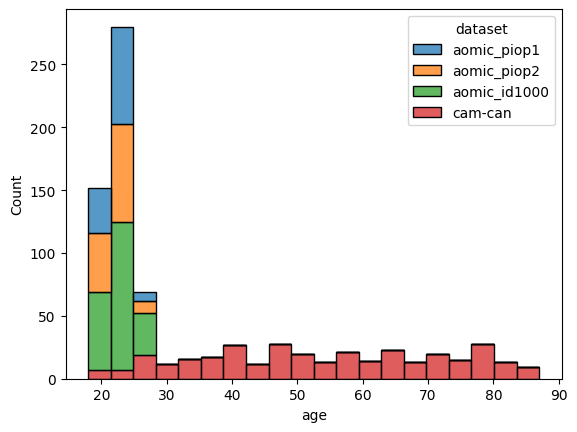

In [114]:
sns.histplot(cov_data[4],x='age',hue='dataset',multiple='stack',bins=20)

<AxesSubplot: xlabel='age', ylabel='Count'>

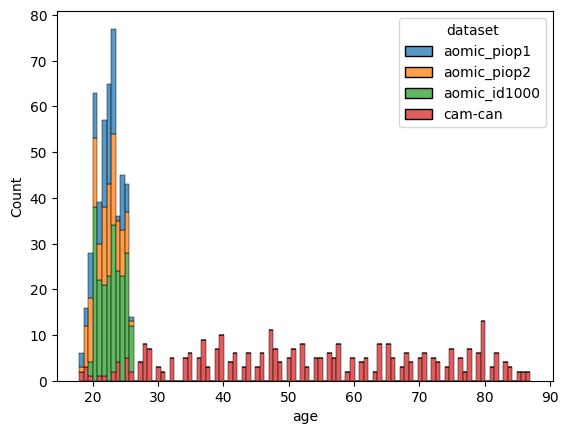

In [16]:
sns.histplot(cov_data[4],x='age',hue='dataset',bins=100,multiple='stack')

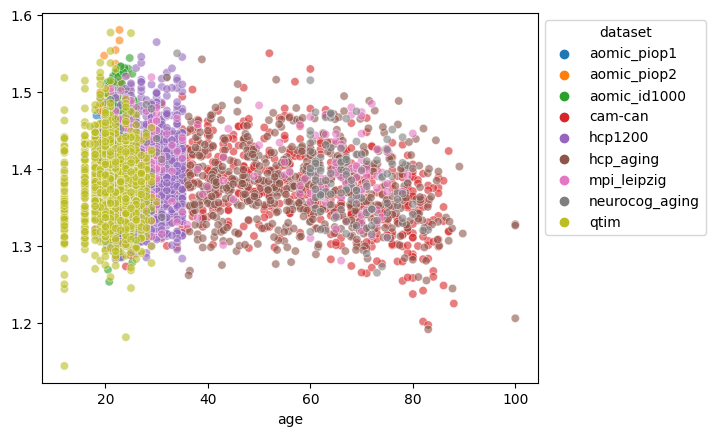

In [17]:
ax = sns.scatterplot(x=cov_data[0].age,y=resp_data[0],hue=cov_data[0].dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

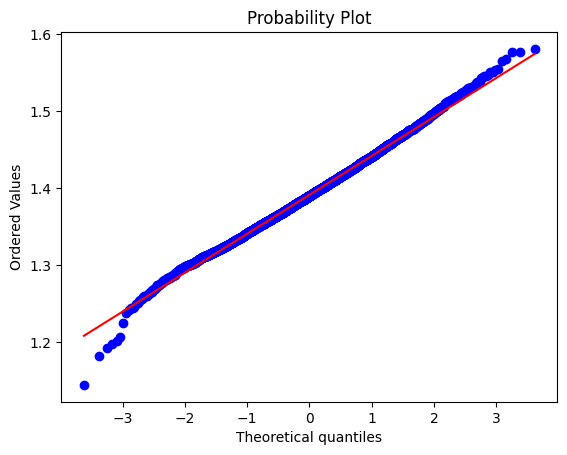

In [18]:
stats.probplot(resp_data[0], dist="norm", plot=pylab)
pylab.show()

In [19]:
resp_data[1].shape

(4754,)

In [20]:
metric =  resp_data[1]
metric_mean = np.mean(metric)
metric_std = np.std(metric,ddof=1)
z_scores = (metric - metric_mean)/metric_std 

In [21]:
curv_abs = np.abs(resp_data[1])


In [22]:
extreme_bool = curv_abs>=1
not_extreme_bool = ~extreme_bool

In [23]:
curv_cov = cov_data[1][not_extreme_bool]

In [24]:
curv_data = resp_data[1][not_extreme_bool]

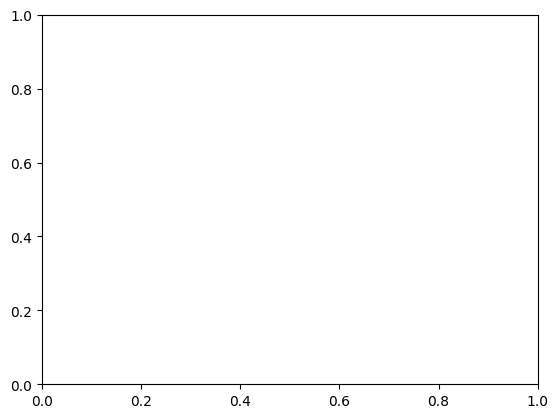

In [26]:
ax = sns.scatterplot(x=cov_data[1].age[not_extreme_bool],y=resp_data[1][not_extreme_bool],hue=cov_data[1].dataset[not_extreme_bool],alpha=0.6)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [39]:
curv_cov.shape

(4294, 9)

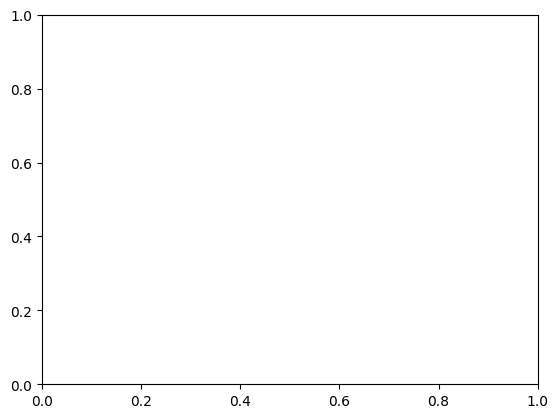

In [28]:
ax = sns.scatterplot(x=curv_cov.age,y=curv_data,hue=curv_cov.dataset,alpha=0.6)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [30]:
stats.probplot(resp_data[1][not_extreme_bool], dist="norm", plot=pylab)
pylab.show()

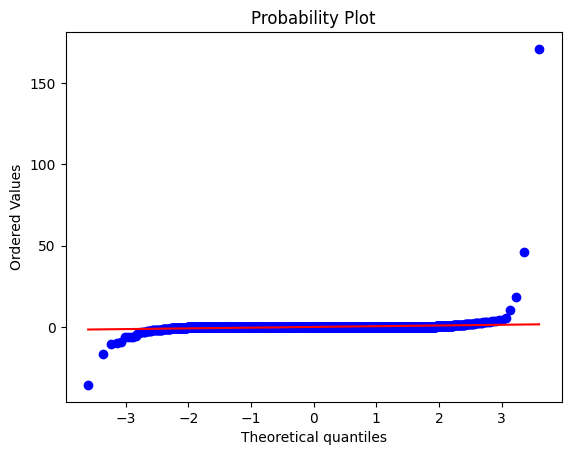

In [130]:
stats.probplot(resp_data[1], dist="norm", plot=pylab)
pylab.show()

/tmp/ipykernel_703093/403963439.py:1: RuntimeWarning: invalid value encountered in log
  ax = sns.scatterplot(x=cov_data[1].age[not_extreme_bool],y=np.log(resp_data[1][not_extreme_bool]),hue=cov_data[1].dataset[not_extreme_bool],alpha=0.6)


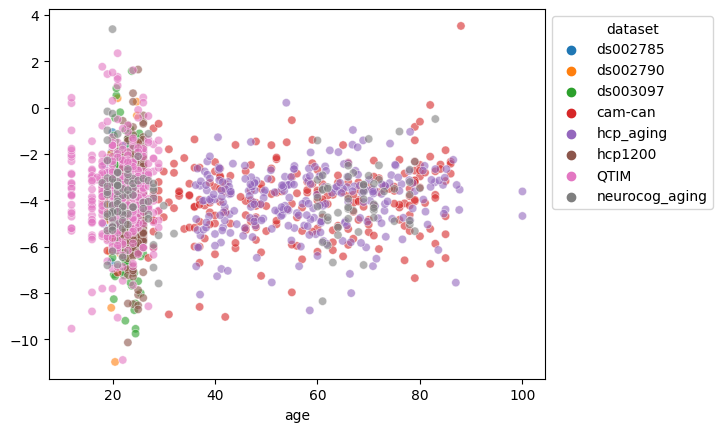

In [69]:
ax = sns.scatterplot(x=cov_data[1].age[not_extreme_bool],y=np.log(resp_data[1][not_extreme_bool]),hue=cov_data[1].dataset[not_extreme_bool],alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

/tmp/ipykernel_150177/1174036846.py:1: RuntimeWarning: invalid value encountered in log
  stats.probplot(np.log(resp_data[1]), dist="norm", plot=pylab)


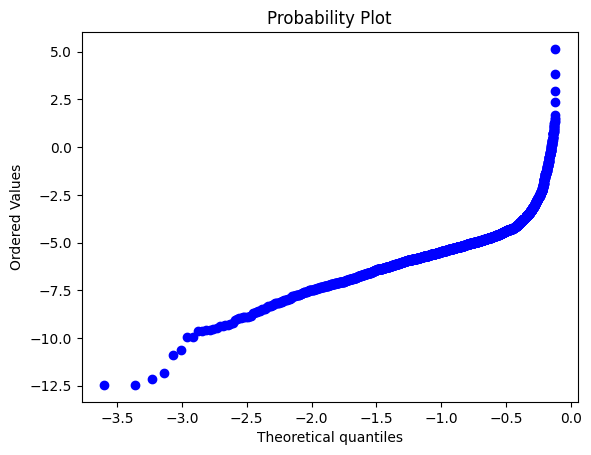

In [131]:
stats.probplot(np.log(resp_data[1]), dist="norm", plot=pylab)
pylab.show()

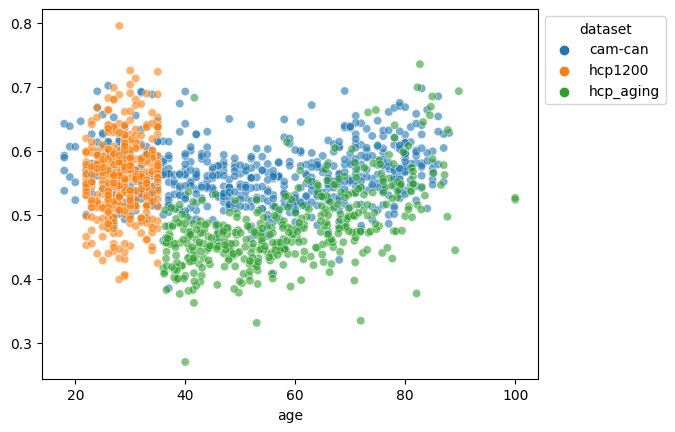

In [32]:
ax = sns.scatterplot(x=cov_data[2].age,y=resp_data[2],hue=cov_data[2].dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

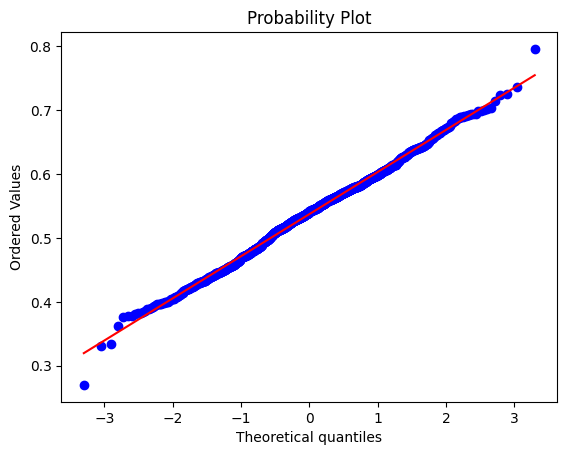

In [34]:
stats.probplot(resp_data[2], dist="norm", plot=pylab)
pylab.show()

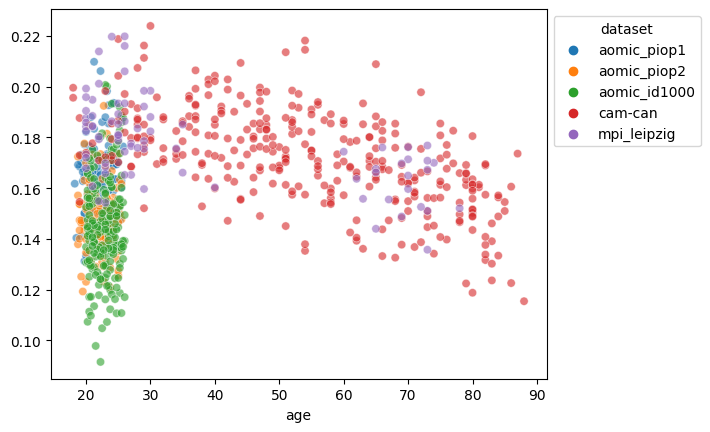

In [35]:
ax = sns.scatterplot(x=cov_data[3].age,y=resp_data[3],hue=cov_data[3].dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

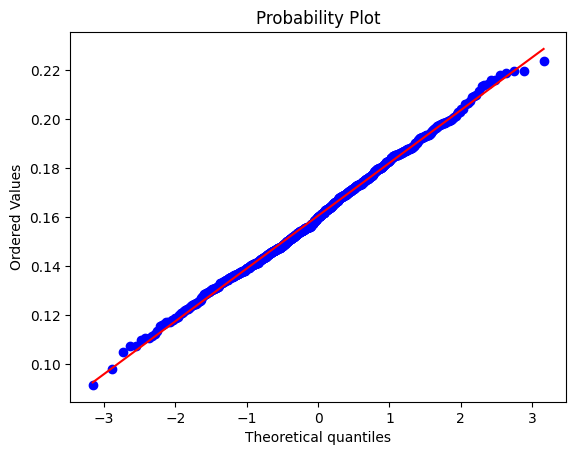

In [36]:
stats.probplot(resp_data[3], dist="norm", plot=pylab)
pylab.show()

In [28]:
covars = []
for cov in cov_data:
    cov['site_code'] = pd.factorize(cov.site)[0]
    cov['sex_code'] = pd.factorize(cov.sex)[0]
    cov['dataset_code'] = pd.factorize(cov.dataset)[0]
    covars.append(cov[['participant_id','dataset','age','sex_code','site_code','dataset_code']])

In [29]:
covars[0]

,participant_id,dataset,age,sex_code,site_code,dataset_code
0,sub-0001,aomic_piop1,26.25,0,0,0
1,sub-0002,aomic_piop1,21.00,0,0,0
2,sub-0003,aomic_piop1,23.00,1,0,0
3,sub-0005,aomic_piop1,21.75,1,0,0
4,sub-0006,aomic_piop1,24.50,1,0,0
...,...,...,...,...,...,...
4738,sub-1286,qtim,12.00,0,24,8
4739,sub-1289,qtim,16.00,0,24,8
4740,sub-1293,qtim,16.00,0,24,8
4741,sub-1294,qtim,12.00,1,24,8


In [30]:
snsx_metric_names = ['thickness','gyrification','myelin','fa','md']
snsx_ctrl_dfs = []
snsx_ctrl_resps = []

snsx_disease_ctrl_dfs = []
snsx_disease_ctrl_resps = []

snsx_epi_dfs = []
snsx_epi_resps = []

for idx, metric in enumerate(snsx_metric_names):
    snsx_ctrl_dfs.append(pd.read_csv(f'../data/snsx_data/snsx_{metric}_control_df.csv',index_col=0))
    snsx_disease_ctrl_dfs.append(pd.read_csv(f'../data/snsx_data/snsx_{metric}_diseased_control_df.csv',index_col=0))
    snsx_epi_dfs.append(pd.read_csv(f'../data/snsx_data/snsx_{metric}_epilepsy_df.csv',index_col=0))
    
    snsx_ctrl_resps.append(np.loadtxt(f'../data/snsx_data/snsx_{metric}_control_IDP.txt'))
    snsx_disease_ctrl_resps.append(np.loadtxt(f'../data/snsx_data/snsx_{metric}_diseased_control_IDP.txt'))
    snsx_epi_resps.append(np.loadtxt(f'../data/snsx_data/snsx_{metric}_epilepsy_IDP.txt'))

    

In [31]:
eplink_metric_names = ['thickness','gyrification','fa','md']
eplink_nonTLE_dfs = []
eplink_nonTLE_resps = []

eplink_possibleTLE_dfs = []
eplink_possibleTLE_resps = []

for idx, metric in enumerate(eplink_metric_names):
    eplink_nonTLE_dfs.append(pd.read_csv(f'../data/eplink_data/eplink_{metric}_nonTLE_df.csv',index_col=0))
    eplink_possibleTLE_dfs.append(pd.read_csv(f'../data/eplink_data/eplink_{metric}_possibleTLE_df.csv',index_col=0))

    eplink_nonTLE_resps.append(np.loadtxt(f'../data/eplink_data/eplink_{metric}_nonTLE_IDP.txt'))
    eplink_possibleTLE_resps.append(np.loadtxt(f'../data/eplink_data/eplink_{metric}_possibleTLE_IDP.txt'))


In [32]:
for idx, eplink_df in enumerate(eplink_possibleTLE_dfs):
    eplink_possibleTLE_dfs[idx]['mri_mts'] = ((eplink_possibleTLE_dfs[idx]['mri_1.5T_mts'].fillna('No').astype('category') == 'Yes') | (eplink_possibleTLE_dfs[idx]['mri_3T_mts'].fillna('No').astype('category') == 'Yes')).astype(bool)

In [33]:
snsx_disease_ctrl_dfs[0].head()

,participant_id,age,sex,diagnosis,handedness,site,dataset,paths,site_code,sex_code
40,sub-P001,65.0,m,Parkinsons,left,snsx_7T,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,25,1
41,sub-P002,68.0,m,Parkinsons,right,snsx_7T,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,25,1
42,sub-P003,62.0,f,Parkinsons,right,snsx_7T,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,25,0
43,sub-P004,63.0,f,Parkinsons,right,snsx_7T,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,25,0
44,sub-P005,54.0,f,Parkinsons,right,snsx_7T,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,25,0


In [34]:

for idx, metric in enumerate(snsx_metric_names):
    snsx_ctrl_dfs[idx]['sex_code'] = snsx_ctrl_dfs[idx].sex.astype('category').cat.codes
    snsx_epi_dfs[idx]['sex_code'] = snsx_epi_dfs[idx].sex.astype('category').cat.codes
    
    snsx_ctrl_dfs[idx]['site'] = 'snsx'
    snsx_epi_dfs[idx]['site'] = 'snsx'
    
    snsx_ctrl_dfs[idx]['dataset'] = 'snsx'
    snsx_epi_dfs[idx]['dataset'] = 'snsx'
    
    snsx_ctrl_dfs[idx]['site_code'] = np.ones(len(snsx_ctrl_dfs[idx])) * (cov_data[idx].site_code.max()+1)
    snsx_disease_ctrl_dfs[idx]['site_code'] = np.ones(len(snsx_disease_ctrl_dfs[idx])) * (cov_data[idx].site_code.max()+1)
    snsx_epi_dfs[idx]['site_code'] = np.ones(len(snsx_epi_dfs[idx])) * (cov_data[idx].site_code.max()+1)
    
    snsx_ctrl_dfs[idx]['dataset_code'] = np.ones(len(snsx_ctrl_dfs[idx])) * (cov_data[idx].dataset_code.max() + 1)
    snsx_disease_ctrl_dfs[idx]['dataset_code'] = np.ones(len(snsx_disease_ctrl_dfs[idx])) * (cov_data[idx].site_code.max()+1)
    snsx_epi_dfs[idx]['dataset_code'] = np.ones(len(snsx_epi_dfs[idx])) * (cov_data[idx].dataset_code.max() + 1)
    
    

In [35]:
np.concatenate([resp_data_all[0],snsx_ctrl_resps[0]]).T

array([[1.08549762, 1.71250653, 0.87086308, ..., 0.90229011, 0.28567696,
        0.95287615],
       [0.3037982 , 0.32353052, 0.29502922, ..., 0.26514599, 0.35205236,
        0.28177544],
       [0.02848411, 0.38704777, 0.72624481, ..., 0.04367118, 0.44276735,
        0.24580972],
       ...,
       [3.19217624, 3.39730304, 2.96391871, ..., 3.01290342, 2.62838614,
        2.88019154],
       [1.35371136, 1.30505421, 1.436633  , ..., 1.42810845, 1.25842875,
        1.21309128],
       [1.35311212, 1.38963897, 1.50716074, ..., 1.42804477, 1.30429423,
        1.31534756]])

In [36]:
thick_combat_snsx_df

NameError: name 'thick_combat_snsx_df' is not defined

In [52]:
pd.concat([cov_data[0],snsx_ctrl_dfs[0]])

,participant_id,age,sex,site,dataset,paths,site_code,sex_code,dataset_code,diagnosis,handedness
0,sub-0001,26.25,F,aomic_piop1,aomic_piop1,/home/ROBARTS/myousif/graham/projects/ctb-akha...,0.0,0,0.0,NaN,NaN
1,sub-0002,21.00,F,aomic_piop1,aomic_piop1,/home/ROBARTS/myousif/graham/projects/ctb-akha...,0.0,0,0.0,NaN,NaN
2,sub-0003,23.00,M,aomic_piop1,aomic_piop1,/home/ROBARTS/myousif/graham/projects/ctb-akha...,0.0,1,0.0,NaN,NaN
3,sub-0005,21.75,M,aomic_piop1,aomic_piop1,/home/ROBARTS/myousif/graham/projects/ctb-akha...,0.0,1,0.0,NaN,NaN
4,sub-0006,24.50,M,aomic_piop1,aomic_piop1,/home/ROBARTS/myousif/graham/projects/ctb-akha...,0.0,1,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
35,sub-C036,22.00,m,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,1,9.0,control,right
36,sub-C037,30.00,f,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,0,9.0,control,right
37,sub-C038,28.00,f,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,0,9.0,control,right
38,sub-C039,23.00,m,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,1,9.0,control,right


In [37]:
thick_combat_snsx_df = pd.concat([cov_data[0],snsx_ctrl_dfs[0]])
# curv_combat_snsx_df = pd.concat([curv_cov,snsx_ctrl_dfs[1]])
gyr_combat_snsx_df = pd.concat([cov_data[1],snsx_ctrl_dfs[1]])
myelin_combat_snsx_df = pd.concat([cov_data[2],snsx_ctrl_dfs[2]])
fa_combat_snsx_df = pd.concat([cov_data[3],snsx_ctrl_dfs[3]])
md_combat_snsx_df = pd.concat([cov_data[4],snsx_ctrl_dfs[4]])

In [38]:
training_snsx_eplink_df = [thick_combat_snsx_df, gyr_combat_snsx_df, fa_combat_snsx_df, md_combat_snsx_df]

In [39]:
for idx, ep_df in enumerate(eplink_nonTLE_dfs):
    eplink_nonTLE_dfs[idx]['sex_codes'] = eplink_nonTLE_dfs[idx].sex.astype('category').cat.codes
    eplink_nonTLE_dfs[idx]['site_code'] = training_snsx_eplink_df[idx].site_code.max() + 1
    eplink_nonTLE_dfs[idx]['site'] = 'eplink'
    eplink_nonTLE_dfs[idx]['dataset'] = 'eplink'
    
    eplink_possibleTLE_dfs[idx]['sex_codes'] = eplink_possibleTLE_dfs[idx].sex.astype('category').cat.codes
    eplink_possibleTLE_dfs[idx]['site_code'] = training_snsx_eplink_df[idx].site_code.max() + 1
    eplink_possibleTLE_dfs[idx]['site'] = 'eplink'
    eplink_possibleTLE_dfs[idx]['dataset'] = 'eplink'
    

In [40]:
thick_combat_df = pd.concat([thick_combat_snsx_df,eplink_nonTLE_dfs[0] ])
# curv_combat_snsx_df = pd.concat([curv_cov,snsx_ctrl_dfs[1]])
gyr_combat_df = pd.concat([gyr_combat_snsx_df,eplink_nonTLE_dfs[1]])
myelin_combat_df = myelin_combat_snsx_df
fa_combat_df = pd.concat([fa_combat_snsx_df, eplink_nonTLE_dfs[2]])
md_combat_df = pd.concat([md_combat_snsx_df, eplink_nonTLE_dfs[3]])

thick_combat = neuroCombat(np.concatenate([resp_data_all[0],snsx_ctrl_resps[0],eplink_nonTLE_resps[0]]).T,
                          covars=thick_combat_df,
                          batch_col='site_code',
                          categorical_cols=['sex_code'])

# curv_combat_snsx = neuroCombat(np.concatenate([resp_data_all[1][not_extreme_bool],snsx_ctrl_resps[1]]).T,
#                           covars=curv_combat_snsx_df,
#                           batch_col='site_code',
#                           categorical_cols=['sex_code'])

gyr_combat = neuroCombat(np.concatenate([resp_data_all[1],snsx_ctrl_resps[1],eplink_nonTLE_resps[1]]).T,
                          covars=gyr_combat_df,
                          batch_col='site_code',
                          categorical_cols=['sex_code'])

myelin_combat = neuroCombat(np.concatenate([resp_data_all[2],snsx_ctrl_resps[2]]).T,
                          covars=myelin_combat_df,
                          batch_col='site_code',
                          categorical_cols=['sex_code'])

fa_combat = neuroCombat(np.concatenate([resp_data_all[3],snsx_ctrl_resps[3],eplink_nonTLE_resps[2]]).T,
                          covars=fa_combat_df,
                          batch_col='site_code',
                          categorical_cols=['sex_code'])

md_combat = neuroCombat(np.concatenate([resp_data_all[4],snsx_ctrl_resps[4],eplink_nonTLE_resps[3]]).T,
                          covars=md_combat_df,
                          batch_col='site_code',
                          categorical_cols=['sex_code'])

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S mode

In [76]:
thick_std = [ arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(thick_combat['data'])]
gyr_std = [ arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(gyr_combat['data'])]
myelin_std = [ arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(myelin_combat['data'])]
fa_std =  [ arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(fa_combat['data'])]
md_std = [ arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(md_combat['data'])]

In [77]:
snsx_thick_disease_ctrl_combat = neuroCombatFromTraining(snsx_disease_ctrl_resps[0].T,
                                                         snsx_disease_ctrl_dfs[0].site_code,
                                                         thick_combat['estimates'])
snsx_gyr_disease_ctrl_combat = neuroCombatFromTraining(snsx_disease_ctrl_resps[1].T,
                                                       snsx_disease_ctrl_dfs[1].site_code,
                                                       gyr_combat['estimates'])
snsx_myelin_disease_ctrl_combat = neuroCombatFromTraining(snsx_disease_ctrl_resps[2].T,
                                                          snsx_disease_ctrl_dfs[2].site_code,
                                                          myelin_combat['estimates'])
snsx_fa_disease_ctrl_combat = neuroCombatFromTraining(snsx_disease_ctrl_resps[3].T,
                                                      snsx_disease_ctrl_dfs[3].site_code,
                                                      fa_combat['estimates'])
snsx_md_disease_ctrl_combat = neuroCombatFromTraining(snsx_disease_ctrl_resps[4].T,
                                                      snsx_disease_ctrl_dfs[4].site_code,
                                                      md_combat['estimates'])

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...



In [78]:
snsx_thick_epi_combat = neuroCombatFromTraining(snsx_epi_resps[0].T,
                                               snsx_epi_dfs[0].site_code,
                                               thick_combat['estimates'])
snsx_gyr_epi_combat = neuroCombatFromTraining(snsx_epi_resps[1].T,
                                               snsx_epi_dfs[1].site_code,
                                               gyr_combat['estimates'])
snsx_myelin_epi_combat = neuroCombatFromTraining(snsx_epi_resps[2].T,
                                             snsx_epi_dfs[2].site_code,
                                             myelin_combat['estimates'])
snsx_fa_epi_combat = neuroCombatFromTraining(snsx_epi_resps[3].T,
                                             snsx_epi_dfs[3].site_code,
                                             fa_combat['estimates'])
snsx_md_epi_combat = neuroCombatFromTraining(snsx_epi_resps[4].T,
                                             snsx_epi_dfs[4].site_code,
                                             md_combat['estimates'])

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...



In [79]:
eplink_thick_possibleTLE_combat = neuroCombatFromTraining(eplink_possibleTLE_resps[0].T,
                                                         eplink_possibleTLE_dfs[0].site_code,
                                                         thick_combat['estimates'])
eplink_gyr_possibleTLE_combat = neuroCombatFromTraining(eplink_possibleTLE_resps[1].T,
                                                       eplink_possibleTLE_dfs[1].site_code,
                                                       gyr_combat['estimates'])
eplink_fa_possibleTLE_combat = neuroCombatFromTraining(eplink_possibleTLE_resps[2].T,
                                                      eplink_possibleTLE_dfs[2].site_code,
                                                      fa_combat['estimates'])
eplink_md_possibleTLE_combat = neuroCombatFromTraining(eplink_possibleTLE_resps[3].T,
                                                      eplink_possibleTLE_dfs[3].site_code,
                                                      md_combat['estimates'])

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...

[neuroCombatFromTraining] In development ...



In [67]:
snsx_vol_df['dataset'] = 'snsx'

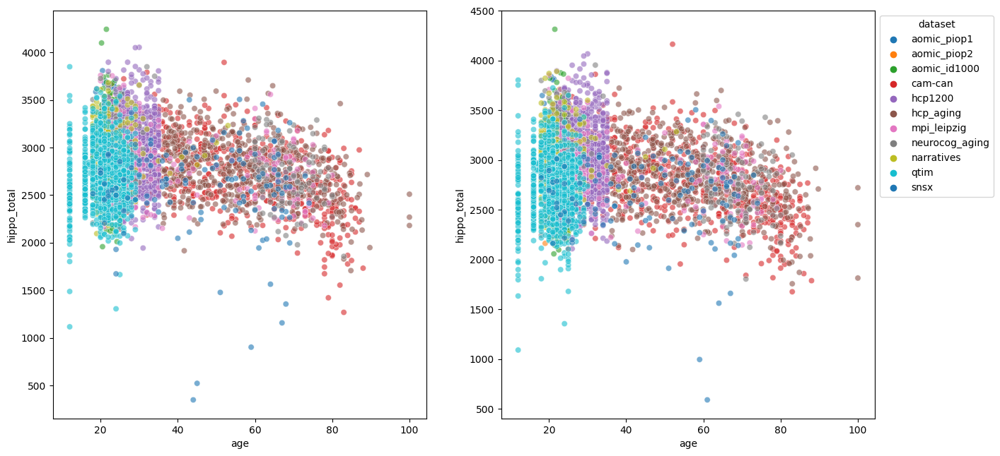

In [69]:
fig, ax = plt.subplots(1,2, figsize=(15,7.5))
sns.scatterplot(data=vol_df[vol_df.hemi == 'L'],x='age',y='hippo_total',hue='dataset',alpha=0.6,ax=ax[0])
sns.scatterplot(data=vol_df[vol_df.hemi == 'R'],x='age',y='hippo_total',hue='dataset',alpha=0.6,ax=ax[1])
sns.scatterplot(data=snsx_vol_df[snsx_vol_df.hemi == 'L'], x='age',y='hippo_total',hue='dataset',alpha=0.6,ax=ax[0])
sns.scatterplot(data=snsx_vol_df[snsx_vol_df.hemi == 'R'], x='age',y='hippo_total',hue='dataset',alpha=0.6,ax=ax[1])
ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

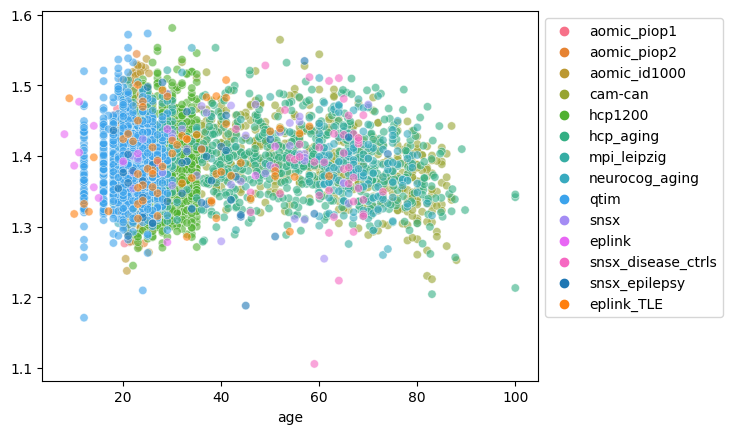

In [31]:
age_training_concat = pd.concat([thick_combat_df.age,
                          snsx_disease_ctrl_dfs[0].age])

age_epi_concat = pd.concat([snsx_epi_dfs[0].age,
                          eplink_possibleTLE_dfs[0].age])

thick_training_concat = np.concatenate([thick_combat['data'].mean(axis=0),
                               snsx_thick_disease_ctrl_combat['data'].mean(axis=0)])

thick_epi_concat = np.concatenate([snsx_thick_epi_combat['data'].mean(axis=0),
                                   eplink_thick_possibleTLE_combat['data'].mean(axis=0)
                                  ])

hue_training_concat = pd.concat([thick_combat_df.dataset,
                        pd.Series(['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[0]))
                       ])

hue_epi_concat = pd.concat([pd.Series(['snsx_epilepsy']*len(snsx_epi_dfs[0])),
                            pd.Series(['eplink_TLE']*len(eplink_possibleTLE_dfs[0]))
                           ])
                          
                          
fig, ax = plt.subplots()
sns.scatterplot(x=age_training_concat.reset_index(drop=True),y=thick_training_concat,hue=hue_training_concat.reset_index(drop=True),alpha=0.6,ax=ax)
sns.scatterplot(x=age_epi_concat.reset_index(drop=True),y=thick_epi_concat,hue=hue_epi_concat.reset_index(drop=True),alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

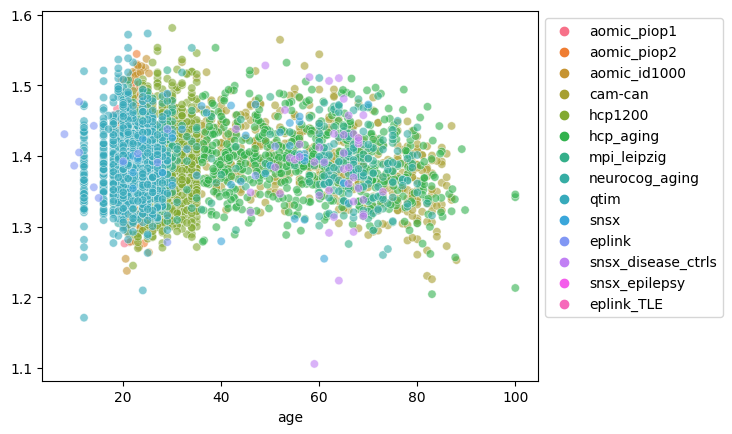

In [66]:
age_training = pd.concat([thick_combat_df.age,
                          snsx_disease_ctrl_dfs[0].age])

age_epilepsy = pd.concat([snsx_epi_dfs[0].age,
                          eplink_possibleTLE_dfs[0].age])

thick_training_concat = np.concatenate([thick_combat['data'].mean(axis=0),
                               snsx_thick_disease_ctrl_combat['data'].mean(axis=0)])

thick_epi_concat = np.concatenate([snsx_thick_epi_combat['data'].mean(axis=0),
                                   eplink_thick_possibleTLE_combat['data'].mean(axis=0)
                                  ])

hue_concat = pd.concat([thick_combat_df.dataset,
                        pd.Series(['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[0])),
                        pd.Series(['snsx_epilepsy']*len(snsx_epi_dfs[0])),
                        pd.Series(['eplink_TLE']*len(eplink_possibleTLE_dfs[0]))
                       ])
                          
                          
fig, ax = plt.subplots()
sns.scatterplot(x=age_training.reset_index(drop=True),y=np.concatenate([thick_training_concat,thick_epi_concat]),hue=hue_concat.reset_index(drop=True),alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

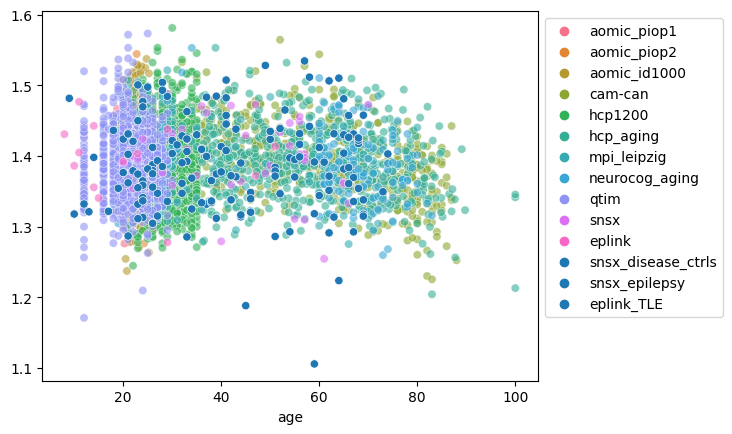

In [701]:
fig, ax = plt.subplots()
sns.scatterplot(x=thick_combat_df.age,y=thick_combat['data'].mean(axis=0),hue=thick_combat_df.dataset,alpha=0.6,ax=ax)
sns.scatterplot(x=snsx_disease_ctrl_dfs[0].age,y=thick_disease_ctrl_combat['data'].mean(axis=0),hue=['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[0]),color='o',ax=ax)
sns.scatterplot(x=snsx_epi_dfs[0].age,y=thick_epi_combat['data'].mean(axis=0),hue=['snsx_epilepsy']*len(snsx_epi_dfs[0]),color='r',ax=ax)
sns.scatterplot(x=eplink_possibleTLE_dfs[0].age,y=eplink_thick_possibleTLE_combat['data'].mean(axis=0),hue=['eplink_TLE']*len(eplink_possibleTLE_dfs[0]),color='p',ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

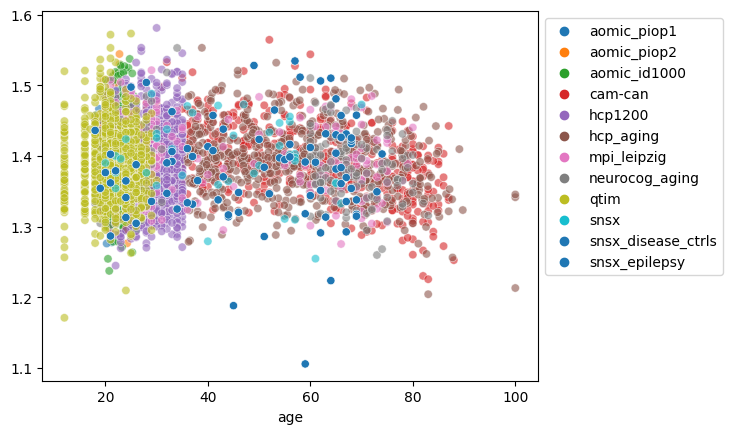

In [185]:
fig, ax = plt.subplots()
sns.scatterplot(x=thick_combat_snsx_df.age,y=thick_combat_snsx['data'].mean(axis=0),hue=thick_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.scatterplot(x=snsx_disease_ctrl_dfs[0].age,y=thick_disease_ctrl_combat['data'].mean(axis=0),hue=['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[0]),ax=ax)
sns.scatterplot(x=snsx_epi_dfs[0].age,y=thick_epi_combat['data'].mean(axis=0),hue=['snsx_epilepsy']*len(snsx_epi_dfs[0]),ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

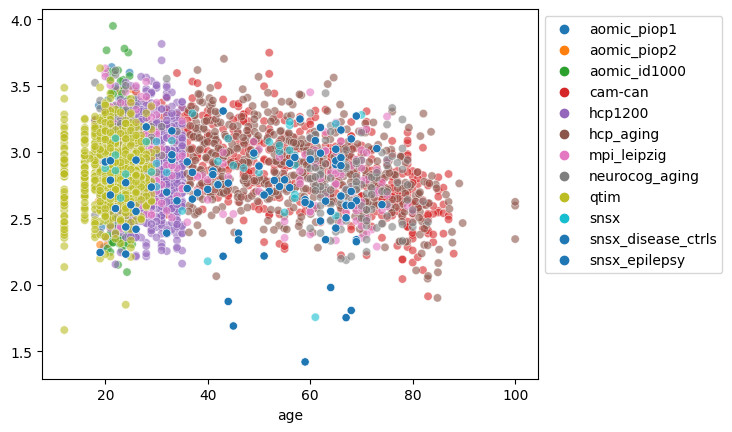

In [186]:
fig, ax = plt.subplots()
sns.scatterplot(x=gyr_combat_snsx_df.age,y=gyr_combat_snsx['data'].mean(axis=0),hue=gyr_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.scatterplot(x=snsx_disease_ctrl_dfs[1].age,y=gyr_disease_ctrl_combat['data'].mean(axis=0),hue=['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[1]),ax=ax)
sns.scatterplot(x=snsx_epi_dfs[1].age,y=gyr_epi_combat['data'].mean(axis=0),hue=['snsx_epilepsy']*len(snsx_epi_dfs[1]),ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

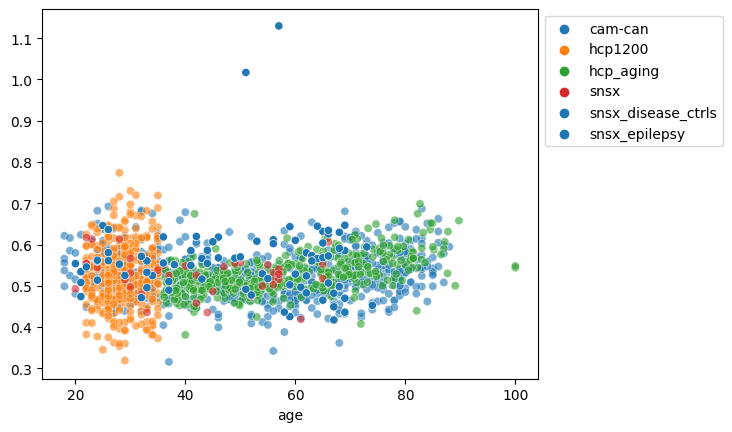

In [187]:
fig, ax = plt.subplots()
sns.scatterplot(x=myelin_combat_snsx_df.age,y=myelin_combat_snsx['data'].mean(axis=0),hue=myelin_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.scatterplot(x=snsx_disease_ctrl_dfs[2].age,y=myelin_disease_ctrl_combat['data'].mean(axis=0),hue=['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[2]),ax=ax)
sns.scatterplot(x=snsx_epi_dfs[2].age,y=myelin_epi_combat['data'].mean(axis=0),hue=['snsx_epilepsy']*len(snsx_epi_dfs[2]),ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

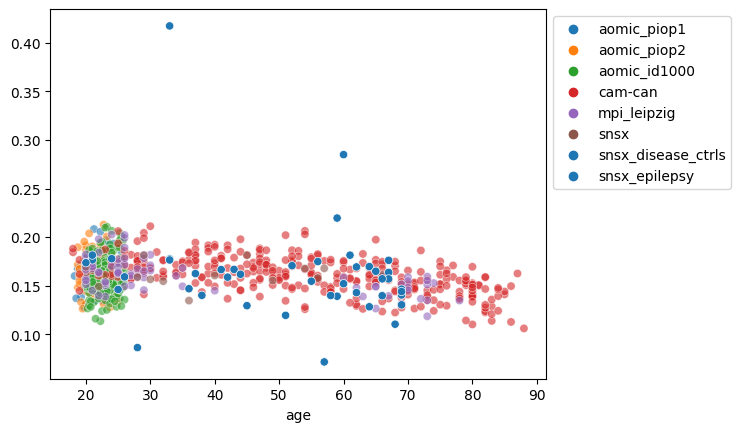

In [188]:
fig, ax = plt.subplots()
sns.scatterplot(x=fa_combat_snsx_df.age,y=fa_combat_snsx['data'].mean(axis=0),hue=fa_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.scatterplot(x=snsx_disease_ctrl_dfs[3].age,y=fa_disease_ctrl_combat['data'].mean(axis=0),hue=['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[3]),ax=ax)
sns.scatterplot(x=snsx_epi_dfs[3].age,y=fa_epi_combat['data'].mean(axis=0),hue=['snsx_epilepsy']*len(snsx_epi_dfs[3]),ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

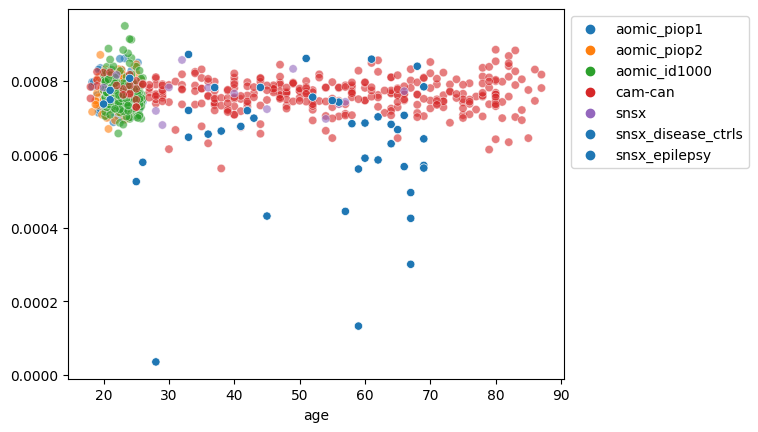

In [189]:
fig, ax = plt.subplots()
sns.scatterplot(x=md_combat_snsx_df.age,y=md_combat_snsx['data'].mean(axis=0),hue=md_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.scatterplot(x=snsx_disease_ctrl_dfs[4].age,y=md_disease_ctrl_combat['data'].mean(axis=0),hue=['snsx_disease_ctrls']*len(snsx_disease_ctrl_dfs[4]),ax=ax)
sns.scatterplot(x=snsx_epi_dfs[4].age,y=md_epi_combat['data'].mean(axis=0),hue=['snsx_epilepsy']*len(snsx_epi_dfs[4]),ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

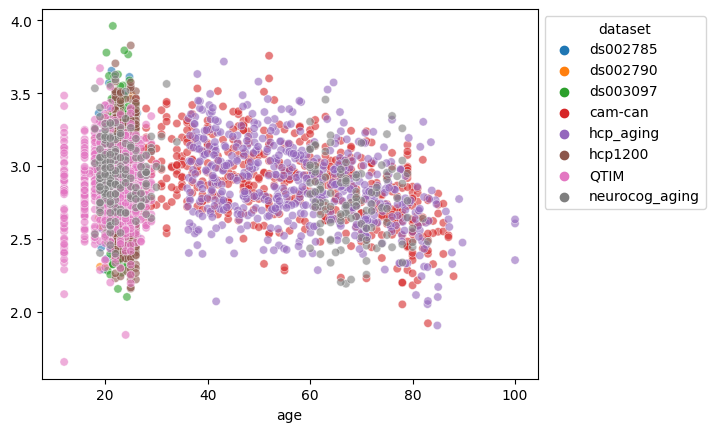

In [75]:
ax = sns.scatterplot(x=cov_data[2].age,y=gyr_combat['data'].mean(axis=0),hue=cov_data[2].dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

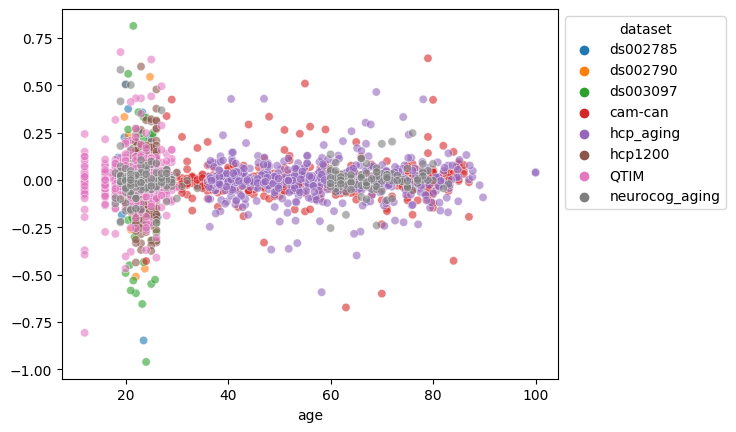

In [74]:
ax = sns.scatterplot(x=curv_cov.age,y=curv_combat['data'].mean(axis=0),hue=curv_cov.dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

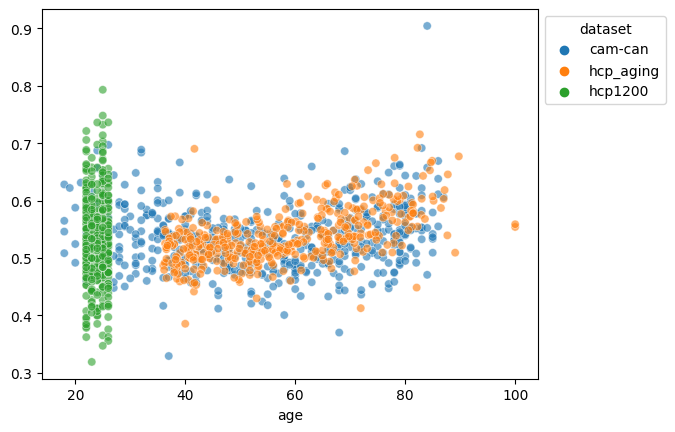

In [75]:
ax = sns.scatterplot(x=cov_data[3].age,y=myelin_combat['data'].mean(axis=0),hue=cov_data[3].dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [47]:
def get_design_mat_linear(df_input):
    return pd.concat([df_input['age'],pd.get_dummies(df_input.sex).m,pd.get_dummies(df_input['site'])],axis=1).to_numpy()

In [48]:
get_design_mat_linear(cov_data[0])

AttributeError: 'DataFrame' object has no attribute 'm'

In [83]:
X_test = np.stack([np.concatenate([np.arange(18,100),np.arange(18,100)]),
                   np.concatenate([np.ones(100-18),np.ones(100-18)+1])]).T
X_test2 = np.stack([np.arange(10,101),
                   np.ones(101-10)/2]).T

In [50]:
bspline_bayesianridge_model = make_pipeline(SplineTransformer(n_knots=5,degree=3),BayesianRidge())
model = make_pipeline(SplineTransformer(n_knots=5,degree=3),BayesianRidge())

In [73]:
model.fit(thick_combat_df[['age','sex_code']],thick_combat['data'].mean(axis=0))

Pipeline(steps=[('splinetransformer', SplineTransformer()),
                ('bayesianridge', BayesianRidge())])

In [74]:
yhat = model.predict(X_test2)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [75]:
sns.histplot(np.array(betas)[:,0])
plt.axvline(model[1].coef_[0],color='red')
plt.axvline(model[1].coef_[0],color='red')
CI = (np.percentile(np.array(betas)[:,0],2.5), np.percentile(np.array(betas)[:,0],97.25))
plt.axvline(CI[0],color='green')
plt.axvline(CI[1],color='green')

NameError: name 'betas' is not defined

In [70]:
def bootstrap_model(X_train, y_train, X_test, model, n_iter=1000):
    betas = []
    preds = []
    
    for i in range(n_iter):
        df_boot = X_train.sample(len(X_train),replace=True)
        
        model.fit(df_boot,y_train[df_boot.index])
        yhat = model.predict(X_test)
        
        preds.append(yhat)
        betas.append(model[1].coef_)
    
    return preds, betas

In [71]:
def plot_bs_models(x_train,y_train,x_test,preds,labels):
    fig, ax = plt.subplots()
    for i in range(len(preds)):
        ax.plot(x_test,preds[i],color='red',alpha=0.1)

    sns.scatterplot(x=x_train,y=y_train,hue=labels,ax=ax)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    return fig, ax

In [72]:
def compute_ci(preds):
    preds_arr = np.array(preds)
    mean = np.mean(preds_arr,axis=0)
    std = np.std(preds_arr,ddof=1,axis=0)
    ci = [mean-(2*std),mean+(2*std)]
    return ci, mean, std

def plot_bs_ci(x_train,y_train,x_test,preds,labels):
    preds_arr = np.array(preds)
    ci, mean, std = compute_ci(preds)
    

    #95% confidence interval
    fig, ax = plt.subplots()

    plt.plot(x_test,mean,color='blue',label='Mean at each bootstrap')
    plt.fill_between(x_test,ci[0],ci[1],alpha=0.3,label='95% confidence interval')



    sns.scatterplot(x=x_train,y=y_train,hue=labels,ax=ax)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    
    return fig, ax

In [73]:
def compute_centiles(model, centiles,  std, X = np.stack([np.arange(10,101),np.ones(91)/2]).T):
    predictions = []
    cent_out = []
    for cent in centiles:
        pred = model.predict(X)
        predictions.append(pred)
        z_score = stats.norm.ppf(cent)
        cent_out.append([pred-(z_score*std),pred+(z_score*std)])
        
    return predictions, cent_out
    

In [74]:
def plot_bs_ci(x_train,y_train,x_test,preds,labels):
    preds_arr = np.array(preds)
    ci, mean, std = compute_ci(preds)
    

    #95% confidence interval
    fig, ax = plt.subplots()

    plt.plot(x_test,mean,color='blue',label='Mean at each bootstrap')
    plt.fill_between(x_test,ci[0],ci[1],alpha=0.3,label='95% confidence interval')



    sns.scatterplot(x=x_train,y=y_train,hue=labels,ax=ax)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    
    return fig, ax

In [216]:
thickbs = bootstrap_model(thick_combat_snsx_df[['age','sex_code']],thick_combat_snsx['data'].mean(axis=0),X_test2,model)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/ba

(<Figure size 640x480 with 1 Axes>, <AxesSubplot: xlabel='age'>)

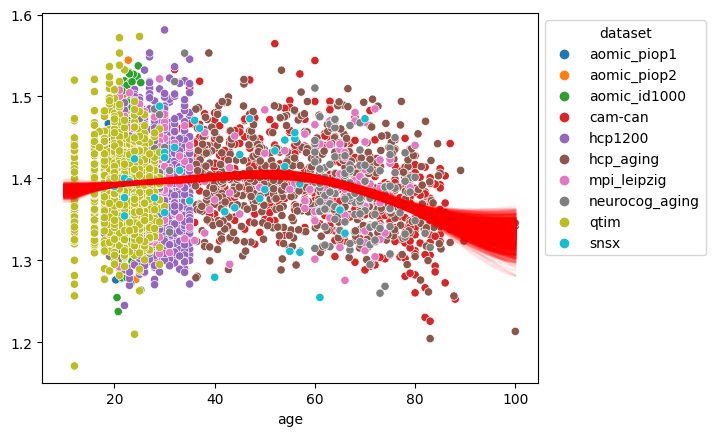

In [222]:
plot_bs_models(thick_combat_snsx_df.age,thick_combat_snsx['data'].mean(axis=0), X_test2[:,0],np.array(thickbs[0]), labels=thick_combat_snsx_df.dataset)

(<Figure size 640x480 with 1 Axes>, <AxesSubplot: xlabel='age'>)

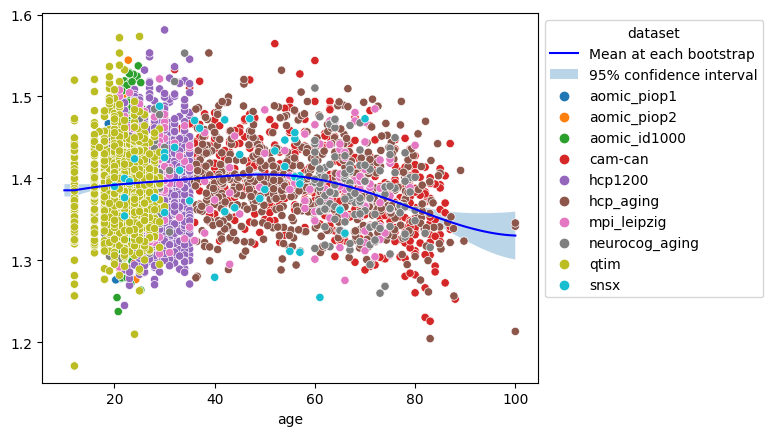

In [223]:
plot_bs_ci(thick_combat_snsx_df.age,thick_combat_snsx['data'].mean(axis=0), X_test2[:,0],np.array(thickbs[0]), labels=thick_combat_snsx_df.dataset)

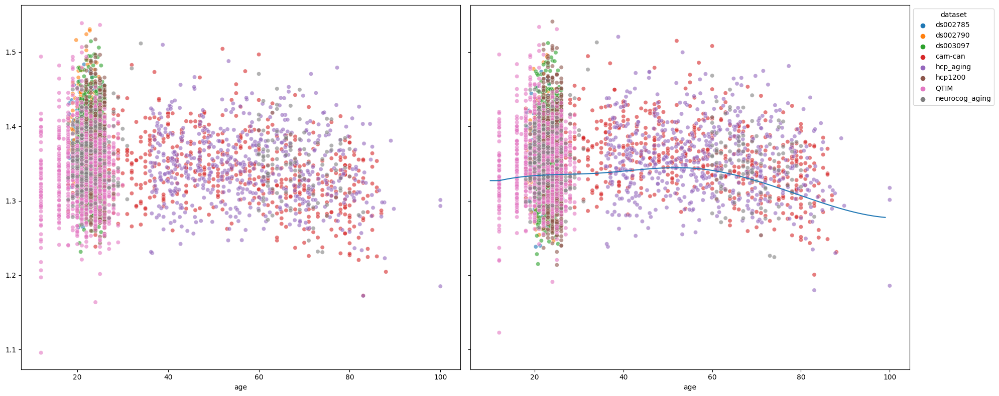

In [394]:
fig, ax = plt.subplots(1,2,figsize=(20,8),sharey=True)
sns.scatterplot(x=cov_data[0].age,y=resp_data[0],hue=cov_data[0].dataset,alpha=0.6,ax=ax[0])
ax[0].legend([],[], frameon=False)
sns.scatterplot(x=cov_data[0].age,y=thick_combat['data'].mean(axis=0),hue=cov_data[0].dataset,alpha=0.6,ax=ax[1])
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].plot(X_test2[:,0], yhat)
plt.tight_layout()

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


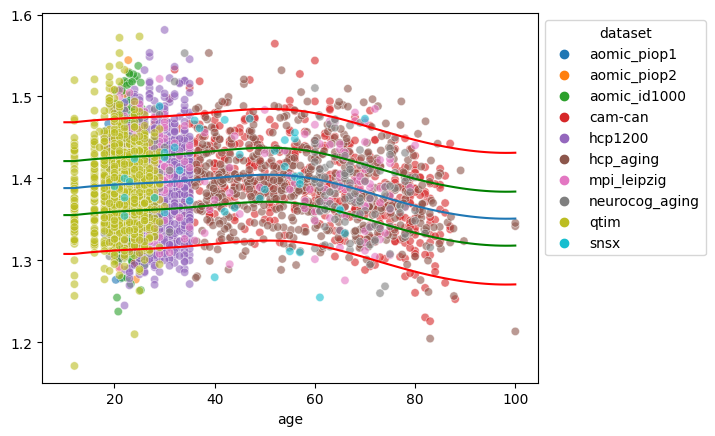

In [227]:
fig, ax = plt.subplots()
sns.scatterplot(x=thick_combat_snsx_df.age,y=thick_combat_snsx['data'].mean(axis=0),hue=thick_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


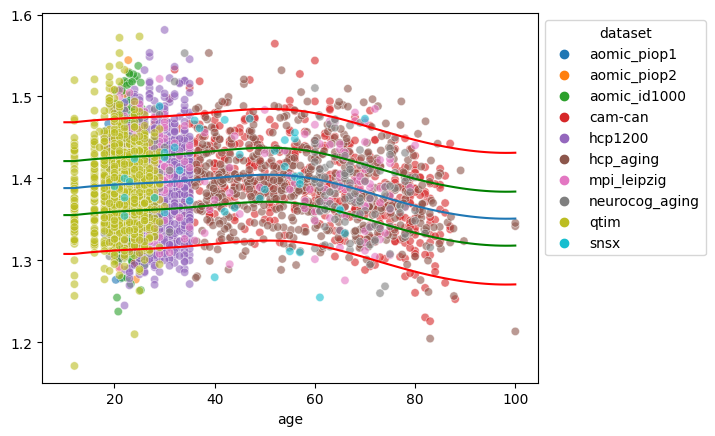

In [230]:
fig, ax = plt.subplots()
sns.scatterplot(x=thick_combat_snsx_df.age,y=thick_combat_snsx['data'].mean(axis=0),hue=thick_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

In [201]:
snsx_qc = pd.read_csv('/home/ROBARTS/myousif/graham/projects/ctb-akhanf/myousif9/norm_models/datasets/snsx/derivatives_7T/hippunfold_qc.csv')

In [200]:
snsx_epi_dfs_clinical =  [pd.merge(df, snsx_df, on='participant_id',how='left',suffixes=('','_duplicate')).drop_duplicates(subset=['participant_id'],keep='first',ignore_index=True) for df in snsx_epi_dfs]
snsx_epi_dfs_clinical = [pd.merge(df,snsx_qc[['participant_id','pass']],on='participant_id',how='left') for df in snsx_epi_dfs_clinical]

In [231]:
snsx_epi_dfs_clinical[0][snsx_epi_dfs_clinical[0]['pass'].fillna(True)]

,participant_id,age,sex,diagnosis,handedness,site,dataset,paths,site_code,sex_code,...,Pathology of the surgery (0=no/1=yes) Non-specific,Pathology of the surgery (0=no/1=yes) normal,Pathology of the surgery (0=no/1=yes) FCD,Pathology of the surgery (0=no/1=yes) other,Pathology of surgery: performed,Pathology notes,Revaluate,note,Unnamed: 78,pass
18,sub-P060,45.0,m,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,1,...,NaN,0.0,NaN,NaN,NaN,"Dont have path report information, completed a...",0.0,NaN,NaN,False
23,sub-P072,25.0,m,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,False
29,sub-P080,51.0,m,Epilepsy,left,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,1,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,patient is candidate for DBS but refused,NaN,False
37,sub-P097,44.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,26.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,False


In [206]:
snsx_qc['pass'].value_counts()

True     68
False    10
Name: pass, dtype: int64

In [244]:
eplink_qc = pd.read_csv('/home/ROBARTS/myousif/graham/projects/ctb-akhanf/myousif9/norm_models/datasets/eplink_phase3/baseline/derivatives/hippunfold_qc.csv')
eplink_qc = eplink_qc[list(eplink_qc.columns[0:3])+ list(eplink_qc.columns[4:6]) + [eplink_qc.columns[-2]]]

In [254]:
eplink_qc['pass'] = (eplink_qc.iloc[:,1:].sum(axis=1) == 5)


In [275]:
eplink_nonTLE_dfs = [pd.merge(df,eplink_qc[['participant_id','pass']],on='participant_id',how='left') for df in eplink_nonTLE_dfs]
eplink_possibleTLE_dfs = [pd.merge(df,eplink_qc[['participant_id','pass']],on='participant_id',how='left') for df in eplink_possibleTLE_dfs]


In [ ]:
snsx_thick_epi_combat

NameError: name 'model' is not defined

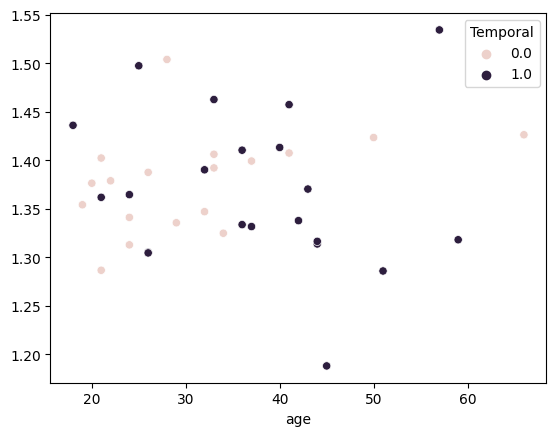

In [277]:

fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[0].age,y=snsx_thick_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[0].Temporal,ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


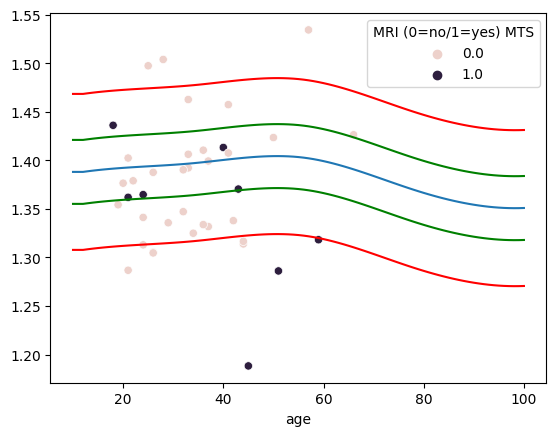

In [313]:

fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[0].age,y=thick_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[0]['MRI (0=no/1=yes) MTS'],ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


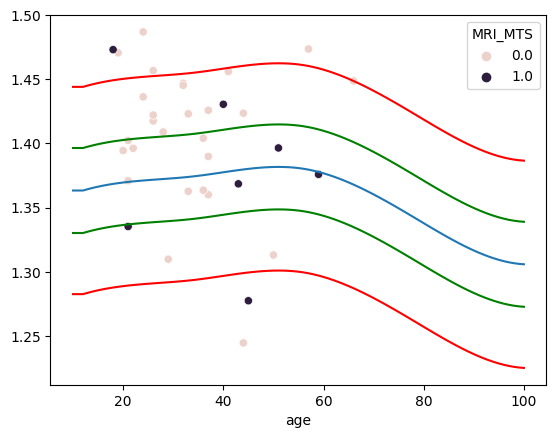

In [95]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs[0].age,y=thick_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs[0].MRI_MTS,ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], yhat,label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


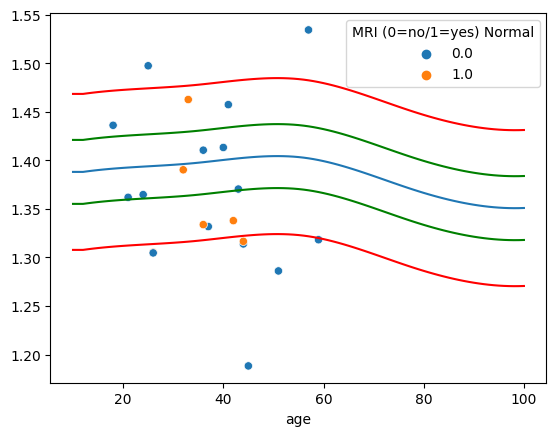

In [316]:

fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[0].age[snsx_epi_dfs_clinical[0].Temporal == 1 ],y=thick_epi_combat['data'].mean(axis=0)[snsx_epi_dfs_clinical[0].Temporal == 1 ],hue=snsx_epi_dfs_clinical[0]['MRI (0=no/1=yes) Normal'][snsx_epi_dfs_clinical[0].Temporal == 1 ],ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


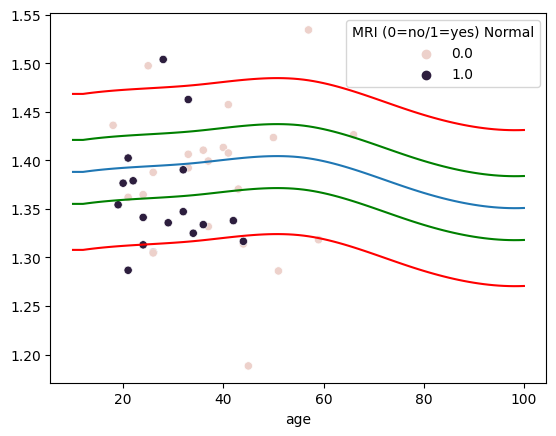

In [317]:

fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[0].age,y=thick_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[0]['MRI (0=no/1=yes) Normal'],ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],thick_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

In [75]:
thick_hemiL, thick_hemiR = np.split(thick_combat_snsx['data'],2)

NameError: name 'thick_combat_snsx' is not defined

In [388]:
thick_modelL = bspline_bayesianridge_model.fit(thick_combat_snsx_df[['age','sex_code']],thick_hemiL.mean(axis=0))
thick_yhatL = thick_modelL.predict(X_test2)

thick_modelR = bspline_bayesianridge_model.fit(thick_combat_snsx_df[['age','sex_code']],thick_hemiR.mean(axis=0))
thick_yhatR = thick_modelR.predict(X_test2)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [43]:
thick_std = [arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(thick_combat['data'])]
gyr_std = [arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(gyr_combat['data'])]
myelin_std = [arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(myelin_combat['data'])]
fa_std =  [arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(fa_combat['data'])]
md_std = [arr.mean(axis=0).std(ddof=1) for arr in split_data_wholehipp(md_combat['data'])]

In [81]:
train_vol_df['hippo_total']

0        3322.223434
1        3590.042765
2        3585.166407
3        3568.790388
4        2833.319425
            ...     
10237    2559.207343
10238    2745.001170
10239    2747.012026
10240    2708.463764
10241    2573.249731
Name: hippo_total, Length: 10242, dtype: float64

In [ ]:
tra

In [109]:
def modelLR_vol(df, structure='hippo_total',covars_list = ['age','sex_code'], predict_cov=X_test2):
    bspline_bayesianridge_model = make_pipeline(SplineTransformer(n_knots=5,degree=3),BayesianRidge())
    
    data_hemiL = df[df.hemi == 'L']
    data_hemiR = df[df.hemi == 'R']
     
    data_structure_hemiL = data_hemiL[structure]
    data_structure_hemiR = data_hemiR[structure]
    
    modelL = clone(bspline_bayesianridge_model).fit(data_hemiL[covars_list],data_structure_hemiL)
    yhatL = modelL.predict(predict_cov)

    modelR = clone(bspline_bayesianridge_model).fit(data_hemiR[covars_list],data_structure_hemiR)
    yhatR = modelR.predict(X_test2)
    
    return (data_hemiL,data_hemiL), (modelL, modelR), (yhatL, yhatR)


In [68]:
def modelLR(df,data,predict_cov=X_test2):
    bspline_bayesianridge_model = make_pipeline(SplineTransformer(n_knots=5,degree=3),BayesianRidge())
    
    data_hemiL, data_hemiR = np.split(data['data'],2)
    
    modelL = clone(bspline_bayesianridge_model).fit(df[['age','sex_code']],data_hemiL.mean(axis=0))
    yhatL = modelL.predict(predict_cov)

    modelR = clone(bspline_bayesianridge_model).fit(df[['age','sex_code']],data_hemiR.mean(axis=0))
    yhatR = modelR.predict(X_test2)
    
    return (data_hemiL,data_hemiL), (modelL, modelR), (yhatL, yhatR)
    

In [116]:
def nm_vol_plot(df, model, std, hue_arg, ax, structure='hippo_total',filter_dict=None):
    if filter_dict != None:
        df_idx = (df[list(filter_dict.keys())[0]] == list(filter_dict.values())[0])
        df = df[df_idx]
        data = data[:,df_idx]
        
    sns.scatterplot(data=df, x='age',y=structure,hue=hue_arg,alpha=0.6,ax=ax)
    # sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
    pred_test, cent_test = compute_centiles(model, [.75,.95], std,X=X_test2)
    ax.plot(X_test2[:,0], pred_test[0], label='mean predicted')
    centiles = [.75,.95]
    color_list= ['green','red']
    for idx, c in enumerate(cent_test):
        ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
        ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

def nm_vol_plot_hemi(df, models, hue_arg,structure='hippo_total',figsize=(20,10), filter_dict = None):
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=figsize,sharey=True)
    data = df[structure]
    std = data.std(ddof=1)
    
    nm_vol_plot(df[df.hemi=='L'], models[0], std, hue_arg, ax[0], structure=structure, filter_dict=filter_dict)
    nm_vol_plot(df[df.hemi=='R'], models[1], std, hue_arg, ax[1], structure=structure, filter_dict=filter_dict)
    
    return fig, ax

In [69]:
def nm_plot(df, data, model, std, hue_arg, ax, filter_dict=None):
    if filter_dict != None:
        df_idx = (df[list(filter_dict.keys())[0]] == list(filter_dict.values())[0])
        df = df[df_idx]
        data = data[:,df_idx]
        
    sns.scatterplot(x=df.age,y=data.mean(axis=0),hue=df[hue_arg],alpha=0.6,ax=ax)
    # sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
    pred_test, cent_test = compute_centiles(model, [.75,.95], std,X=X_test2)
    ax.plot(X_test2[:,0], pred_test[0], label='mean predicted')
    centiles = [.75,.95]
    color_list= ['green','red']
    for idx, c in enumerate(cent_test):
        ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
        ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

def nm_plot_hemi(df, data, models, hue_arg,figsize=(20,10), filter_dict = None):
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=figsize,sharey=True)
    
    std = np.concatenate(data).mean(axis=0).std(ddof=1)
    
    nm_plot(df, data[0], models[0], std, hue_arg, ax[0], filter_dict=filter_dict)
    nm_plot(df, data[1], models[1], std, hue_arg, ax[1], filter_dict=filter_dict)
    
    return fig, ax
    
    
#     sns.scatterplot(x=df.age,y=data[0].mean(axis=0),hue=df[hue_arg],alpha=0.6,ax=ax[0])
#     # sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
#     pred_test, cent_test = compute_centiles(models[0], [.75,.95], models[0].mean(axis=0).std(ddof=1),X=X_test2)
#     ax[0].plot(X_test2[:,0], pred_test[0],label='mean predicted')
#     centiles = [.75,.95]
#     color_list= ['green','red']
#     for idx, c in enumerate(cent_test):
#         ax[0].plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
#         ax[0].plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

#     sns.scatterplot(x=thick_combat_snsx_df.age,y=thick_hemiR.mean(axis=0),hue=thick_combat_snsx_df.dataset,alpha=0.6,ax=ax[1])
#     # sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
#     pred_test, cent_test = compute_centiles(thick_modelL,[.75,.95],thick_hemiR.mean(axis=0).std(ddof=1),X=X_test2)
#     ax[1].plot(X_test2[:,0], thick_yhatR,label='mean predicted')
#     centiles = [.75,.95]
#     color_list= ['green','red']
#     for idx, c in enumerate(cent_test):
#         ax[1].plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
#         ax[1].plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

In [105]:
vol_stds = [train_vol_df[train_vol_df.hemi == 'L'].hippo_total.std(ddof=1),
            train_vol_df[train_vol_df.hemi == 'R'].hippo_total.std(ddof=1)]

In [94]:
train_vol_df['sex_code'] = train_vol_df.sex.astype('category').cat.codes
snsx_vol_df['sex_code'] = snsx_vol_df.sex.astype('category').cat.codes
eplink_vol_df['sex_code'] = eplink_vol_df.sex.astype('category').cat.codes

In [100]:
vol_data, vol_models, vol_yhat = modelLR_vol(train_vol_df)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [499]:
thick_data, thick_models, thick_yhat = modelLR(thick_combat_df,thick_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [500]:
gyr_data, gyr_models, gyr_yhat = modelLR(gyr_combat_df,gyr_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [501]:
myelin_data, myelin_models, myelin_yhat = modelLR(myelin_combat_df,myelin_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [502]:
fa_data, fa_models, fa_yhat = modelLR(fa_combat_df,fa_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [503]:
md_data, md_models, md_yhat = modelLR(md_combat_df,md_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [186]:
def compute_vol_zscores(treatment_df, treatment_data, training_data, models, std): 
    Z = []
    for idx, arr in enumerate(treatment_data):
        y = arr
        y_hat = models[idx].predict(treatment_df[idx][['age','sex_code']])
        
        z = (y - y_hat)/std[idx]
        Z.append(z)
    
    return Z


In [106]:
def compute_zscores(treatment_df, treatment_data, training_data, models, std): 
    Z = []
    for idx, arr in enumerate(split_data_wholehipp(treatment_data)):
        y = arr.mean(axis=0)
        y_hat = models[idx].predict(treatment_df[['age','sex_code']])
        
        z = (y - y_hat)/std[idx]
        Z.append(z)
    
    return Z


In [107]:
def compute_deviations(treatment_df, treatment_data, training_data, models): 
    Z = []
    for idx, arr in enumerate(split_data_wholehipp(treatment_data)):
        y = arr.mean(axis=0)
        y_hat = models[idx].predict(treatment_df[['age','sex_code']])
        
        z = (y - y_hat)
        Z.append(z)
    
    return Z

In [109]:
thick_std

0.048853123976152796

In [130]:
get_hemis = lambda df: [df[df.hemi == 'L'], df[df.hemi == 'R']]

In [134]:
vol_stds

[328.5689162995899, 331.97229743742736]

In [357]:
snsx_vol_df2 = snsx_vol_df.dropna(subset=['age','sex'])
snsx_vol_df2 = pd.merge(snsx_vol_df2,snsx_qc[['participant_id','pass']],on='participant_id',how='left')
snsx_vol_df2['pass'] = snsx_vol_df2['pass'].fillna(True)
snsx_vol_df2 = snsx_vol_df2[snsx_vol_df2['pass']]

In [358]:
snsx_vol_epi_zscore = compute_vol_zscores(get_hemis(snsx_vol_df2),[hdf.hippo_total for hdf in get_hemis(snsx_vol_df2)],[vdf.hippo_total for vdf in vol_data], vol_models,vol_stds)

In [359]:
snsx_vol_dfL, snsx_vol_dfR = get_hemis(snsx_vol_df2)

In [360]:
snsx_vol_dfL['z-score'] = snsx_vol_epi_zscore[0].to_numpy()
snsx_vol_dfR['z-score'] = snsx_vol_epi_zscore[1].to_numpy()

/tmp/ipykernel_78093/4167866372.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snsx_vol_dfL['z-score'] = snsx_vol_epi_zscore[0].to_numpy()
/tmp/ipykernel_78093/4167866372.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snsx_vol_dfR['z-score'] = snsx_vol_epi_zscore[1].to_numpy()


In [486]:
snsx_vol_df3 = pd.concat([snsx_vol_dfL,
                          snsx_vol_dfR])

In [361]:
eplink_vol_df2 = eplink_vol_df[eplink_vol_df['age'].notna()]
eplink_vol_df2 = pd.merge(eplink_vol_df2, eplink_qc[['participant_id','pass']],on='participant_id',how='left')
eplink_vol_df2['pass'] = eplink_vol_df2['pass'].fillna(True)
eplink_vol_df2 = eplink_vol_df2[eplink_vol_df2['pass']]

In [363]:
eplink_vol_epi_zscore = compute_vol_zscores(get_hemis(eplink_vol_df2),[hdf.hippo_total for hdf in get_hemis(eplink_vol_df2)],[vdf.hippo_total for vdf in vol_data], vol_models,vol_stds)

In [364]:
eplink_vol_dfL, eplink_vol_dfR = get_hemis(eplink_vol_df2)

In [365]:
eplink_vol_dfL['z-score'] = eplink_vol_epi_zscore[0].to_numpy()
eplink_vol_dfR['z-score'] = eplink_vol_epi_zscore[1].to_numpy()

/tmp/ipykernel_78093/2797184208.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eplink_vol_dfL['z-score'] = eplink_vol_epi_zscore[0].to_numpy()
/tmp/ipykernel_78093/2797184208.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eplink_vol_dfR['z-score'] = eplink_vol_epi_zscore[1].to_numpy()


In [368]:
snsx_vol_dfL.columns

Index(['participant_id', 'hemi', 'Sub', 'CA1', 'CA2', 'CA3', 'CA4', 'DG',
       'SRLM', 'Cyst', 'hippo_total', 'age', 'sex', 'diagnosis', 'handedness',
       'scanner', 'Focal', 'Generalized', 'Unknown', 'Temporal', 'Frontal',
       'Parietal', 'Insular', 'Occipital ', 'Bilobal', 'Right ', 'Left',
       'Other', 'Engel_IA', 'Engel_IB', 'Engel_IC', 'Engel_ID', 'Engel_IIA',
       'Engel_IIB', 'Engel_IIC', 'Engel_IID', 'Engel_IIIA', 'Engel_IIIB',
       'Engel_IVA', 'Engel_IVB', 'Engel_IVC', 'Engel_I=1', 'ilae_1', 'ilae_2',
       'ilae_3', 'ilae_4', 'ilae_5', 'ilae_6', 'mri_normal', 'mri_mts',
       'lateralization', 'mri_mts_location', 'ipsilateral_mts',
       'ipsilateral_lateralization', 'ipsilateral_TLE',
       'ipsilateral_TLE_control (TLE=1/cntrl=0)',
       'ipsilateral_TLE_non_epi (TLE=1/non-epi=0)',
       'ipsilateral_mts_non_epi (TLE=1/non-epi=0)',
       'ipsilateral_mts_control (TLE=1/cntrl=0)',
       'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)',
       'ipsilate

In [455]:

ipsimts_nontle_cols = ['participant_id','age','hemi','hippo_total','z-score','Temporal','mri_mts', 'mri_mts_location','ipsilateral_mts','ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)','sex_code','pass']

ipsimts_nontle_dfL = pd.concat([snsx_vol_dfL[ipsimts_nontle_cols],
                                eplink_vol_dfL[ipsimts_nontle_cols]])

ipsimts_nontle_dfR = pd.concat([snsx_vol_dfR[ipsimts_nontle_cols],
                                eplink_vol_dfR[ipsimts_nontle_cols]])

ipsimts_nontle_df = pd.concat([ipsimts_nontle_dfL,ipsimts_nontle_dfR])

In [313]:
snsx_vol_dfR['ipsilateral_TLE_control (TLE=1/cntrl=0)'].value_counts()

0.0    39
1.0    14
Name: ipsilateral_TLE_control (TLE=1/cntrl=0), dtype: int64

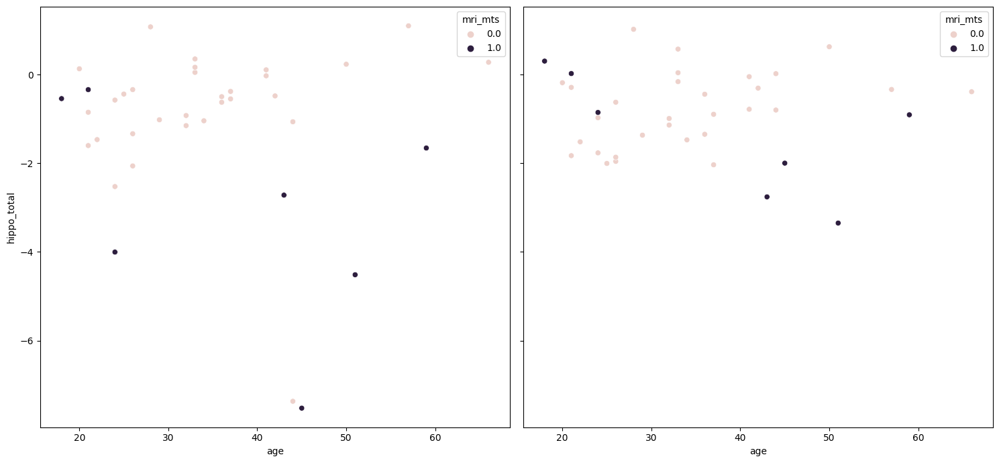

In [196]:
fig, ax = plt.subplots(1,2,figsize=(15,7),sharey=True)
sns.scatterplot(x=snsx_vol_dfL.age,y=snsx_vol_epi_zscore[0],hue=snsx_vol_dfL.mri_mts,ax=ax[0])
sns.scatterplot(x=snsx_vol_dfR.age,y=snsx_vol_epi_zscore[1],hue=snsx_vol_dfR.mri_mts,ax=ax[1])
plt.tight_layout()

In [513]:
snsx_thick_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[0], snsx_thick_epi_combat['data'], thick_combat['data'], thick_models,thick_std)
snsx_thick_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[0], snsx_thick_disease_ctrl_combat['data'], thick_combat['data'], thick_models,thick_std)

In [506]:
snsx_gyr_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[1], snsx_gyr_epi_combat['data'], gyr_combat['data'], gyr_models,gyr_std)
snsx_gyr_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[1], snsx_gyr_disease_ctrl_combat['data'], gyr_combat['data'], gyr_models,gyr_std)

In [507]:
snsx_myelin_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[2], snsx_myelin_epi_combat['data'], myelin_combat['data'], myelin_models,myelin_std)
snsx_myelin_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[2], snsx_myelin_disease_ctrl_combat['data'], myelin_combat['data'], myelin_models,myelin_std)

In [508]:
snsx_fa_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[3], snsx_fa_epi_combat['data'], fa_combat['data'], fa_models,fa_std)
snsx_fa_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[3], snsx_fa_disease_ctrl_combat['data'], fa_combat['data'], fa_models,fa_std)

In [509]:
snsx_md_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[4], snsx_md_epi_combat['data'], md_combat['data'], md_models,md_std)
snsx_md_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[4], snsx_md_disease_ctrl_combat['data'], md_combat['data'], md_models,md_std)

In [56]:
snsx_thick_epi_deviations = compute_deviations(snsx_epi_dfs_clinical[0], snsx_thick_epi_combat['data'], thick_combat['data'], thick_models)
snsx_thick_disease_ctrl_deviations = compute_deviations(snsx_disease_ctrl_dfs[0], snsx_thick_disease_ctrl_combat['data'], thick_combat['data'], thick_models)

In [515]:
eplink_thick_possibleTLE_zscore = compute_zscores(eplink_possibleTLE_dfs[0], eplink_thick_possibleTLE_combat['data'], thick_combat['data'], thick_models,thick_std)
eplink_thick_TLE_deviations = compute_deviations(eplink_possibleTLE_dfs[0], eplink_thick_possibleTLE_combat['data'], thick_combat['data'], thick_models)

In [517]:
eplink_gyr_possibleTLE_zscore = compute_zscores(eplink_possibleTLE_dfs[1], eplink_gyr_possibleTLE_combat['data'], gyr_combat['data'], gyr_models,gyr_std)
eplink_gyr_TLE_deviations = compute_deviations(eplink_possibleTLE_dfs[1], eplink_gyr_possibleTLE_combat['data'], gyr_combat['data'], gyr_models)

In [518]:
eplink_fa_possibleTLE_zscore = compute_zscores(eplink_possibleTLE_dfs[2], eplink_fa_possibleTLE_combat['data'], fa_combat['data'], fa_models,fa_std)
eplink_fa_TLE_deviations = compute_deviations(eplink_possibleTLE_dfs[2], eplink_fa_possibleTLE_combat['data'], fa_combat['data'], fa_models)

In [519]:
eplink_md_possibleTLE_zscore = compute_zscores(eplink_possibleTLE_dfs[3], eplink_md_possibleTLE_combat['data'], md_combat['data'], md_models,md_std)
eplink_md_TLE_deviations = compute_deviations(eplink_possibleTLE_dfs[3], eplink_md_possibleTLE_combat['data'], md_combat['data'], md_models)

In [96]:
for df in snsx_epi_dfs_clinical:
    df['mri_mts'] = df['MRI (0=no/1=yes) MTS'].astype(bool)
    df['mri_mts_localization'] = ((df[['Left','Right ','Bilobal']]*[1,2,3]).sum(axis=1,min_count=1))*df['mri_mts']
    df['temporal_lateralization'] = ((df[['Left','Right ','Bilobal']]*[1,2,3]).sum(axis=1,min_count=1))*df['Temporal']
    df['temporal_lateralization'] = ((df[['Left','Right ','Bilobal']]*[1,2,3]).sum(axis=1,min_count=1))*df['Temporal']

<AxesSubplot: xlabel='age'>

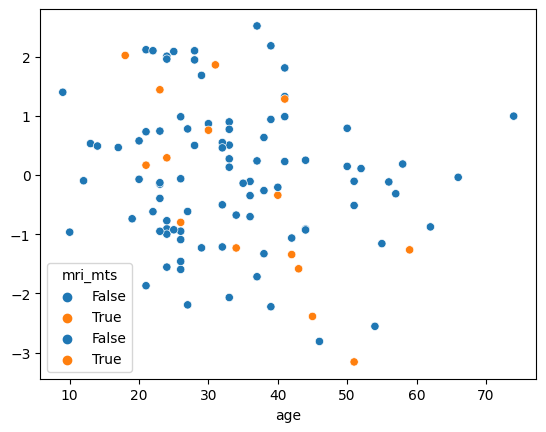

In [116]:
fig, ax = plt.subplots()
sns.scatterplot(x = snsx_epi_dfs_clinical[0].age, y = snsx_thick_epi_zscore[1], hue=snsx_epi_dfs_clinical[0]['mri_mts'], ax=ax)
sns.scatterplot(x = eplink_possibleTLE_dfs[0].age, y = eplink_thick_TLE_zscore[1], hue=eplink_possibleTLE_dfs[0]['mri_mts'], ax=ax)

NameError: name 'snsx_thick_epi_zscore' is not defined

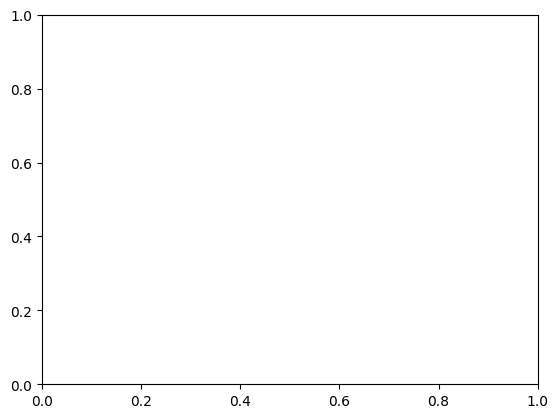

In [497]:
fig, ax = plt.subplots()
sns.scatterplot(x = snsx_epi_dfs_clinical[0].age, y = snsx_thick_epi_zscore[0], hue=snsx_epi_dfs_clinical[0]['mri_mts'], ax=ax)
sns.scatterplot(x = eplink_possibleTLE_dfs[0].age, y = eplink_thick_TLE_zscore[0], hue=eplink_possibleTLE_dfs[0]['mri_mts'], ax=ax)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
        <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object))

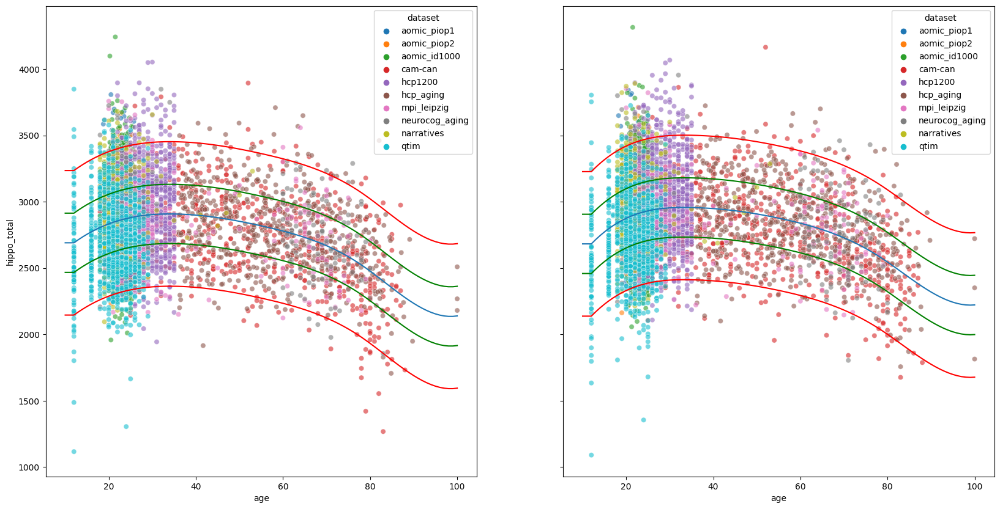

In [117]:
nm_vol_plot_hemi(vol_df,vol_models,'dataset')

In [472]:
snsx_vol_df2

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True
1,sub-P065,R,512.075543,1032.240396,130.890706,344.289316,202.737864,150.826991,630.262128,64.347135,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True
5,sub-P100,R,480.875267,966.287958,118.087834,315.132989,178.926061,133.153922,607.349303,10.566921,...,1.0,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True
244,sub-P012,L,561.618909,1104.227992,141.243396,412.478530,183.034167,176.887785,740.504075,46.410197,...,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True
246,sub-P101,L,470.690232,753.001199,90.715176,325.400297,104.954378,131.703141,516.950571,23.426030,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
        <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object))

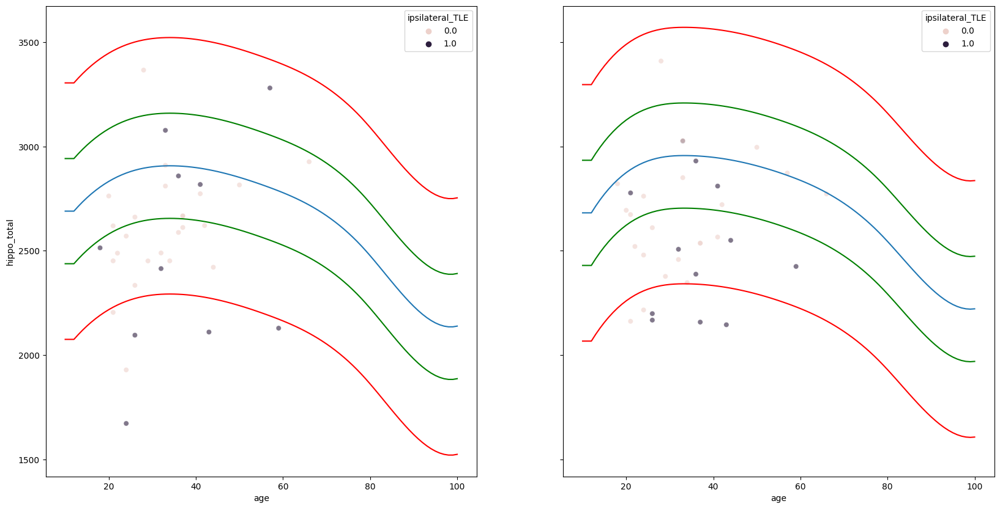

In [473]:
nm_vol_plot_hemi(snsx_vol_df2,vol_models,'ipsilateral_TLE')

In [477]:
snsx_vol_df2['ipsilateral_TLE_control (TLE=1/cntrl=0)'].value_counts()

0.0    76
1.0    22
Name: ipsilateral_TLE_control (TLE=1/cntrl=0), dtype: int64

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
        <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object))

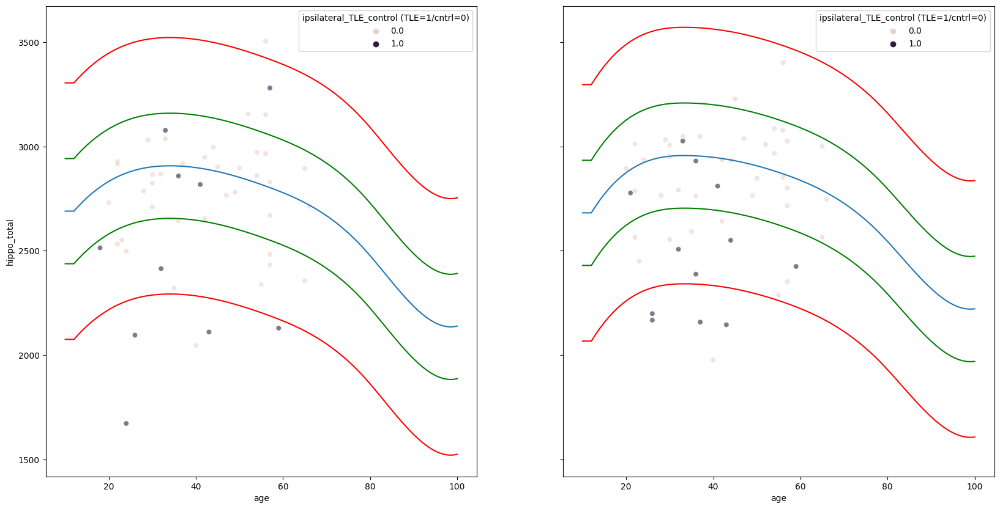

In [478]:
nm_vol_plot_hemi(snsx_vol_df2,vol_models,'ipsilateral_TLE_control (TLE=1/cntrl=0)')

In [479]:
snsx_vol_df2

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True
1,sub-P065,R,512.075543,1032.240396,130.890706,344.289316,202.737864,150.826991,630.262128,64.347135,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True
5,sub-P100,R,480.875267,966.287958,118.087834,315.132989,178.926061,133.153922,607.349303,10.566921,...,1.0,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True
244,sub-P012,L,561.618909,1104.227992,141.243396,412.478530,183.034167,176.887785,740.504075,46.410197,...,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True
246,sub-P101,L,470.690232,753.001199,90.715176,325.400297,104.954378,131.703141,516.950571,23.426030,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True


In [ ]:
snsx_vol_df2

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
        <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object))

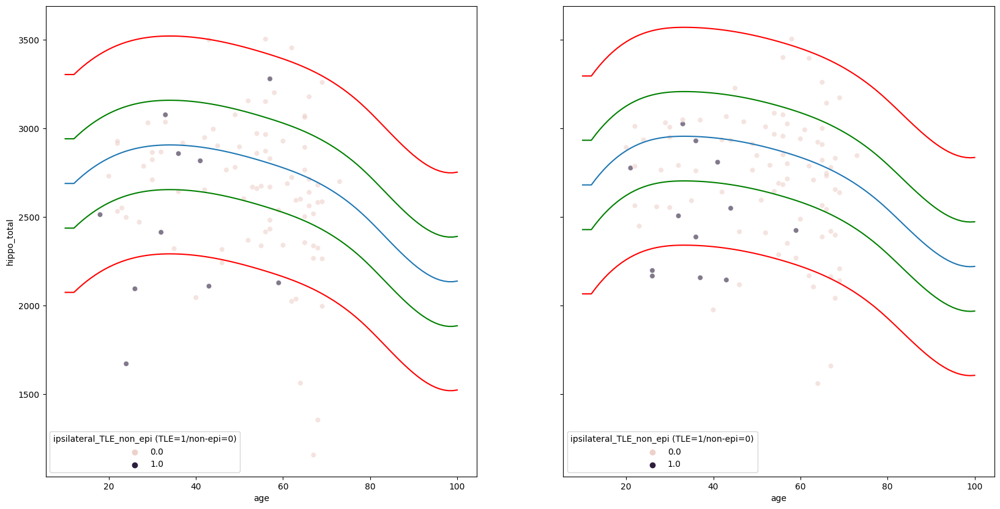

In [480]:
nm_vol_plot_hemi(snsx_vol_df2,vol_models,'ipsilateral_TLE_non_epi (TLE=1/non-epi=0)')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
        <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object))

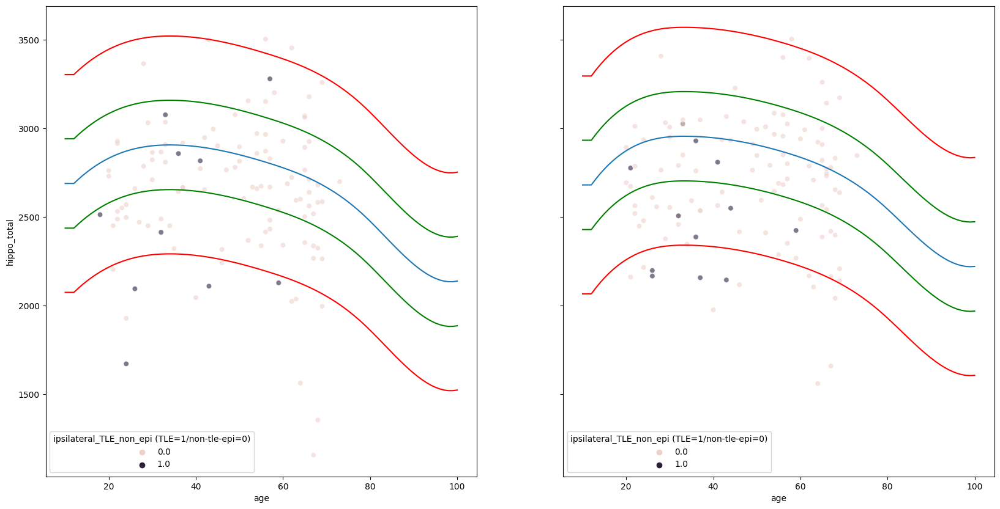

In [481]:
nm_vol_plot_hemi(snsx_vol_df2,vol_models,'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)')

In [487]:
snsx_vol_df3

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass,z-score
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,1.514590
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,0.111950
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-3.236250
8,sub-P064,L,545.908159,701.359659,96.785010,397.074824,147.762971,149.089619,551.471036,12.271495,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,-0.773686
12,sub-P006,L,494.229323,791.080777,85.603747,255.595802,79.780415,100.550555,509.014585,1.953932,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-1.346867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,474.244190,1006.755109,122.479514,293.829140,168.553747,140.356193,615.940556,25.609633,...,0.0,0.0,0.0,0.0,0.0,NaN,snsx,0,True,0.185100
241,sub-P008,R,381.843012,731.370737,89.022764,243.610463,142.334630,108.150618,478.834449,23.731301,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,-1.860643
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True,0.580365
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True,1.026525


In [446]:
ipsimts_nontle_dfL.ipsilateral_mts.value_counts()

0.0    62
1.0    10
Name: ipsilateral_mts, dtype: int64

In [454]:
ipsimts_nontle_df.age

,participant_id,hemi,hippo_total,z-score,Temporal,mri_mts,mri_mts_location,ipsilateral_mts,ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),sex_code,pass
0,sub-P065,L,3500.888751,1.514590,NaN,NaN,NaN,NaN,NaN,1,True
4,sub-P100,L,2818.095435,0.111950,1.0,0.0,0.0,0.0,NaN,0,True
6,sub-P010,L,1563.395390,-3.236250,NaN,NaN,NaN,NaN,NaN,0,True
8,sub-P064,L,2601.722772,-0.773686,NaN,NaN,NaN,NaN,NaN,1,True
12,sub-P006,L,2317.809135,-1.346867,NaN,NaN,NaN,NaN,NaN,0,True
...,...,...,...,...,...,...,...,...,...,...,...
149,sub-LHS0019,R,2667.450146,-0.990146,NaN,0.0,0.0,0.0,NaN,1,True
151,sub-HSC0006,R,2579.814817,-0.673021,0.0,0.0,0.0,0.0,0.0,1,True
153,sub-TWH0019,R,2492.308342,-1.763969,NaN,NaN,NaN,NaN,NaN,1,True
155,sub-LHS0004,R,2627.376823,-0.586618,1.0,0.0,0.0,0.0,NaN,0,True


In [456]:
ipsimts_nontle_df['age']

0      43.0
4      41.0
6      64.0
8      64.0
12     46.0
       ... 
149    20.0
151    10.0
153    33.0
155    27.0
159    32.0
Name: age, Length: 390, dtype: float64

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
        <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object))

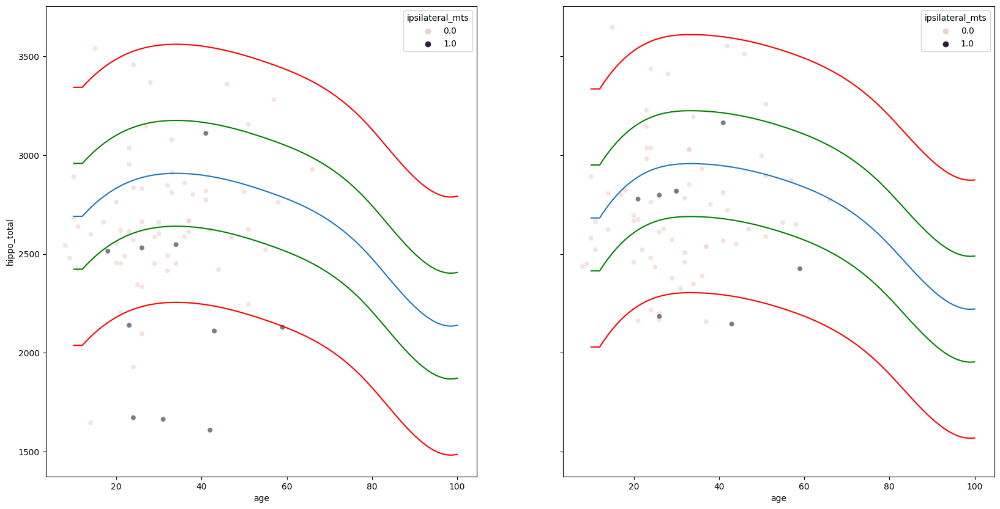

In [457]:
nm_vol_plot_hemi(ipsimts_nontle_df,vol_models,'ipsilateral_mts')

In [462]:
test[1]

array([<AxesSubplot: xlabel='age', ylabel='hippo_total'>,
       <AxesSubplot: xlabel='age', ylabel='hippo_total'>], dtype=object)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


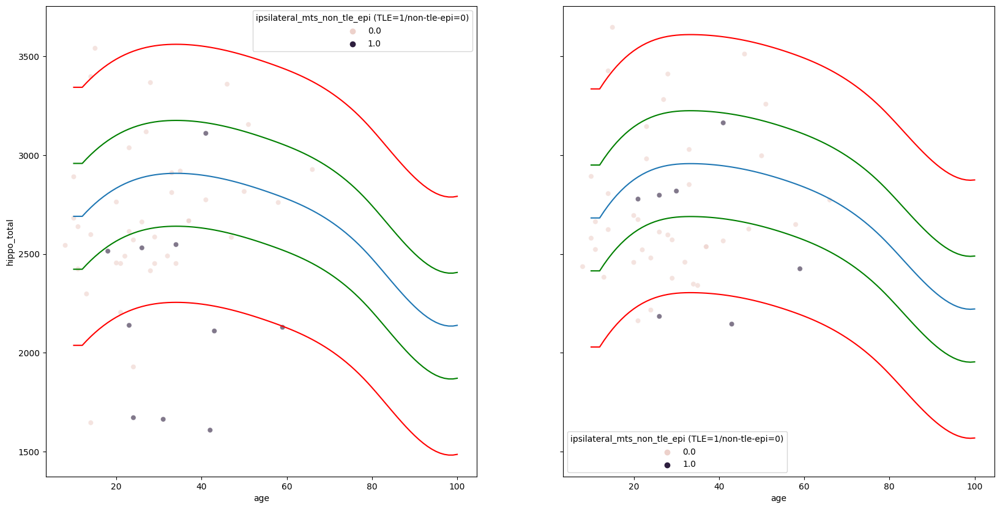

In [459]:
test =nm_vol_plot_hemi(ipsimts_nontle_df,vol_models,'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)')

In [483]:
snsx_vol_df2.columns

Index(['participant_id', 'hemi', 'Sub', 'CA1', 'CA2', 'CA3', 'CA4', 'DG',
       'SRLM', 'Cyst', 'hippo_total', 'age', 'sex', 'diagnosis', 'handedness',
       'scanner', 'Focal', 'Generalized', 'Unknown', 'Temporal', 'Frontal',
       'Parietal', 'Insular', 'Occipital ', 'Bilobal', 'Right ', 'Left',
       'Other', 'Engel_IA', 'Engel_IB', 'Engel_IC', 'Engel_ID', 'Engel_IIA',
       'Engel_IIB', 'Engel_IIC', 'Engel_IID', 'Engel_IIIA', 'Engel_IIIB',
       'Engel_IVA', 'Engel_IVB', 'Engel_IVC', 'Engel_I=1', 'ilae_1', 'ilae_2',
       'ilae_3', 'ilae_4', 'ilae_5', 'ilae_6', 'mri_normal', 'mri_mts',
       'lateralization', 'mri_mts_location', 'ipsilateral_mts',
       'ipsilateral_lateralization', 'ipsilateral_TLE',
       'ipsilateral_TLE_control (TLE=1/cntrl=0)',
       'ipsilateral_TLE_non_epi (TLE=1/non-epi=0)',
       'ipsilateral_mts_non_epi (TLE=1/non-epi=0)',
       'ipsilateral_mts_control (TLE=1/cntrl=0)',
       'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)',
       'ipsilate

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:9.787e-03 U_stat=3.420e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.408e-02 U_stat=3.190e+02


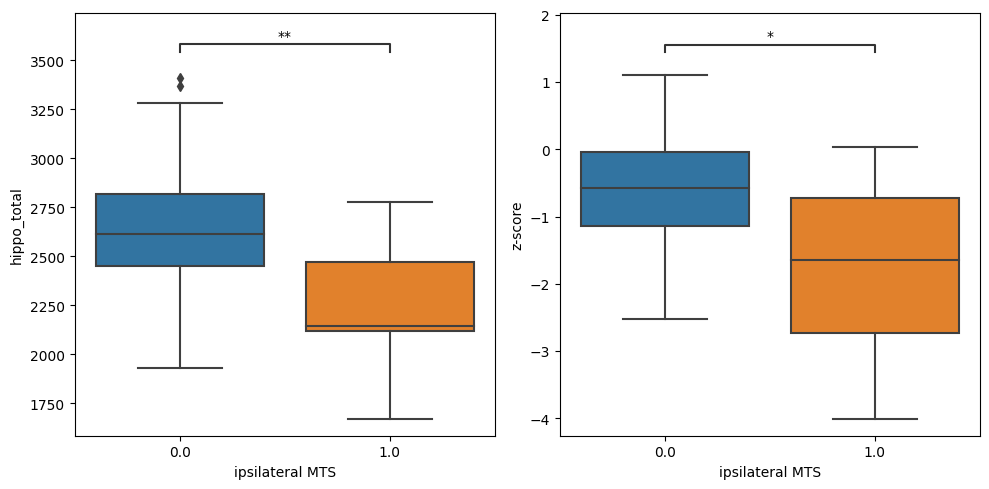

In [488]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

plot_info_vol = {'data':snsx_vol_df3,
              'x':'ipsilateral_mts',
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_vol_zscore = {'data':snsx_vol_df3,
              'x':'ipsilateral_mts',
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_vol_zscore)

annot = Annotator(ax[1], [(0,1)], **plot_info_vol_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_xlabel('ipsilateral MTS')
ax[1].set_xlabel('ipsilateral MTS')
plt.tight_layout()



In [489]:
snsx_vol_df3

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass,z-score
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,1.514590
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,0.111950
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-3.236250
8,sub-P064,L,545.908159,701.359659,96.785010,397.074824,147.762971,149.089619,551.471036,12.271495,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,-0.773686
12,sub-P006,L,494.229323,791.080777,85.603747,255.595802,79.780415,100.550555,509.014585,1.953932,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-1.346867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,474.244190,1006.755109,122.479514,293.829140,168.553747,140.356193,615.940556,25.609633,...,0.0,0.0,0.0,0.0,0.0,NaN,snsx,0,True,0.185100
241,sub-P008,R,381.843012,731.370737,89.022764,243.610463,142.334630,108.150618,478.834449,23.731301,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,-1.860643
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True,0.580365
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True,1.026525


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.516e-03 U_stat=1.209e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.912e-03 U_stat=1.201e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.588e-01 U_stat=6.140e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

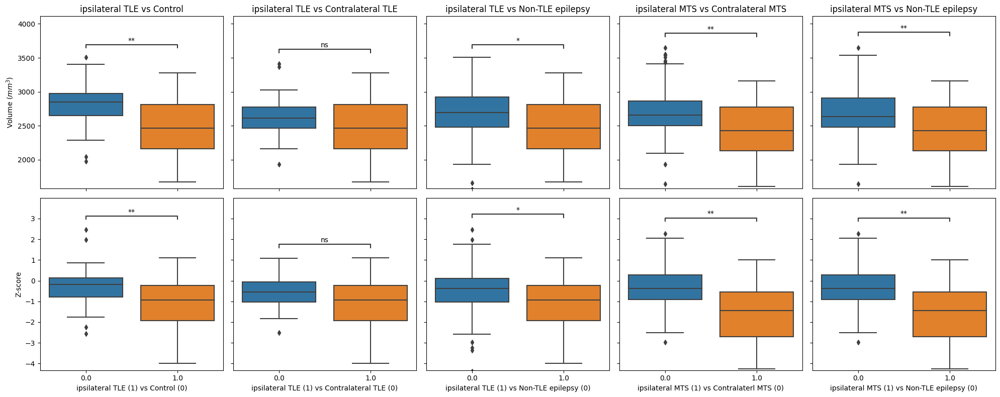

In [780]:
fig, ax = plt.subplots(2,5,figsize=(20,8),sharex='col',sharey='row')

hue_arg = 'ipsilateral_TLE_control (TLE=1/cntrl=0)'
idx = 0
plot_info_vol = {'data':snsx_vol_df3,
              'x':hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0][idx],**plot_info_vol)

annot = Annotator(ax[0][idx], [(0,1)], **plot_info_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_vol_zscore = {'data':snsx_vol_df3,
              'x':hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1][idx],**plot_info_vol_zscore)

annot = Annotator(ax[1][idx], [(0,1)], **plot_info_vol_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0][idx].set_ylabel('Volume ($mm^3$)')
ax[1][idx].set_ylabel('Z-score')

ax[0][idx].set_xlabel('')
ax[1][idx].set_xlabel('ipsilateral TLE (1) vs Control (0)')
ax[0][idx].set_title('ipsilateral TLE vs Control')

######################################################################################### 

hue_arg = 'ipsilateral_TLE'
idx = 1
plot_info_vol = {'data':snsx_vol_df3,
              'x':hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0][idx],**plot_info_vol)

annot = Annotator(ax[0][idx], [(0,1)], **plot_info_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_vol_zscore = {'data':snsx_vol_df3,
              'x':hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1][idx],**plot_info_vol_zscore)

annot = Annotator(ax[1][idx], [(0,1)], **plot_info_vol_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0][idx].set_ylabel('')
ax[1][idx].set_ylabel('')

ax[0][idx].set_xlabel('')
ax[1][idx].set_xlabel('ipsilateral TLE (1) vs Contralateral TLE (0)')
ax[0][idx].set_title('ipsilateral TLE vs Contralateral TLE')

######################################################################################### 

hue_arg = 'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)'
idx = 2
plot_info_vol = {'data':snsx_vol_df3,
              'x':hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0][idx],**plot_info_vol)

annot = Annotator(ax[0][idx], [(0,1)], **plot_info_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_vol_zscore = {'data':snsx_vol_df3,
              'x':hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1][idx],**plot_info_vol_zscore)

annot = Annotator(ax[1][idx], [(0,1)], **plot_info_vol_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0][idx].set_ylabel('')
ax[1][idx].set_ylabel('')

ax[0][idx].set_xlabel('')
ax[1][idx].set_xlabel('ipsilateral TLE (1) vs Non-TLE epilepsy (0)')
ax[0][idx].set_title('ipsilateral TLE vs Non-TLE epilepsy')

#########################################3333333


hue_arg = 'ipsilateral_mts'
idx = 3
plot_info_ipsimts_vol = {'data':ipsimts_nontle_df,
              'x':hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0][idx],**plot_info_ipsimts_vol)

annot = Annotator(ax[0][idx], [(0,1)], **plot_info_ipsimts_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_ipsimts_zscore = {'data':ipsimts_nontle_df,
              'x':hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1][idx],**plot_info_ipsimts)

annot = Annotator(ax[1][idx], [(0,1)], **plot_info_ipsimts)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0][idx].set_ylabel('')
ax[1][idx].set_ylabel('')

ax[0][idx].set_xlabel('')
ax[1][idx].set_xlabel('ipsilateral MTS (1) vs Contralaterl MTS (0)')
ax[0][idx].set_title('ipsilateral MTS vs Contralateral MTS')

###############################################################################3333

hue_arg='ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)'
idx = 4
plot_info_ipsimts_vol = {'data':ipsimts_nontle_df,
              'x':hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0][idx],**plot_info_ipsimts_vol)

annot = Annotator(ax[0][idx], [(0,1)], **plot_info_ipsimts_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_ipsimts_zscore = {'data':ipsimts_nontle_df,
              'x':hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1][idx],**plot_info_ipsimts)

annot = Annotator(ax[1][idx], [(0,1)], **plot_info_ipsimts)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0][idx].set_ylabel('')
ax[1][idx].set_ylabel('')

ax[0][idx].set_xlabel('')
ax[1][idx].set_xlabel('ipsilateral MTS (1) vs Non-TLE epilepsy (0)')
ax[0][idx].set_title('ipsilateral MTS vs Non-TLE epilepsy')

# ax[0].set_title('Volume ($mm^3$)')
# ax[1].set_title('Z-score')
# ax[0].set_ylabel('Volume ($mm^3$)')
# ax[1].set_ylabel('Z-score')

# ax[0].set_xlabel('Ipsilateral MTS (1) vs. Contralateral MTS (0)')
# ax[1].set_xlabel('Ipsilateral MTS (1) vs. Contralateral MTS (0)')




plt.tight_layout()

In [770]:
snsx_vol_df3['ips

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass,z-score
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,1.514590
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,0.111950
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-3.236250
8,sub-P064,L,545.908159,701.359659,96.785010,397.074824,147.762971,149.089619,551.471036,12.271495,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,-0.773686
12,sub-P006,L,494.229323,791.080777,85.603747,255.595802,79.780415,100.550555,509.014585,1.953932,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-1.346867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,474.244190,1006.755109,122.479514,293.829140,168.553747,140.356193,615.940556,25.609633,...,0.0,0.0,0.0,0.0,0.0,NaN,snsx,0,True,0.185100
241,sub-P008,R,381.843012,731.370737,89.022764,243.610463,142.334630,108.150618,478.834449,23.731301,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,-1.860643
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True,0.580365
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True,1.026525


In [491]:
snsx_vol_df3.columns

Index(['participant_id', 'hemi', 'Sub', 'CA1', 'CA2', 'CA3', 'CA4', 'DG',
       'SRLM', 'Cyst', 'hippo_total', 'age', 'sex', 'diagnosis', 'handedness',
       'scanner', 'Focal', 'Generalized', 'Unknown', 'Temporal', 'Frontal',
       'Parietal', 'Insular', 'Occipital ', 'Bilobal', 'Right ', 'Left',
       'Other', 'Engel_IA', 'Engel_IB', 'Engel_IC', 'Engel_ID', 'Engel_IIA',
       'Engel_IIB', 'Engel_IIC', 'Engel_IID', 'Engel_IIIA', 'Engel_IIIB',
       'Engel_IVA', 'Engel_IVB', 'Engel_IVC', 'Engel_I=1', 'ilae_1', 'ilae_2',
       'ilae_3', 'ilae_4', 'ilae_5', 'ilae_6', 'mri_normal', 'mri_mts',
       'lateralization', 'mri_mts_location', 'ipsilateral_mts',
       'ipsilateral_lateralization', 'ipsilateral_TLE',
       'ipsilateral_TLE_control (TLE=1/cntrl=0)',
       'ipsilateral_TLE_non_epi (TLE=1/non-epi=0)',
       'ipsilateral_mts_non_epi (TLE=1/non-epi=0)',
       'ipsilateral_mts_control (TLE=1/cntrl=0)',
       'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)',
       'ipsilate

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.034e-02 U_stat=2.318e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.354e-02 U_stat=2.390e+03


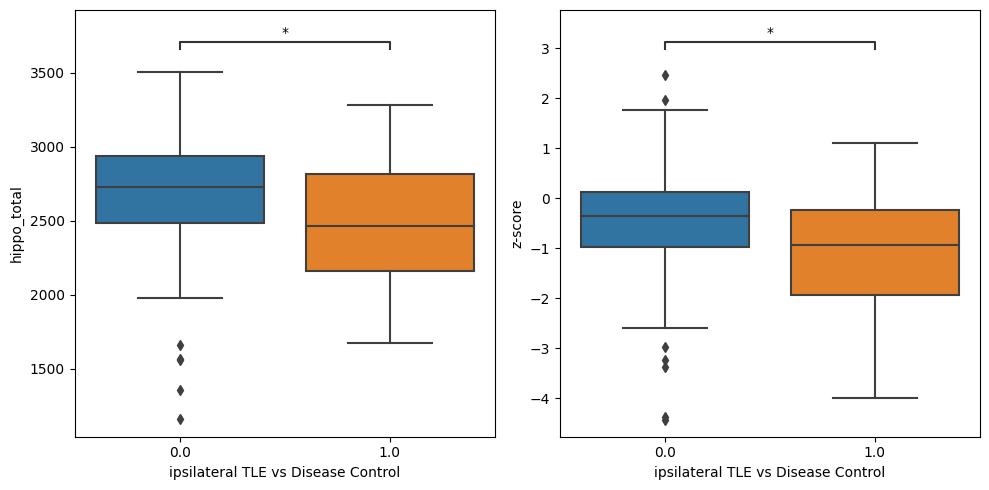

In [496]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

plot_info_vol = {'data':snsx_vol_df3,
              'x':'ipsilateral_TLE_non_epi (TLE=1/non-epi=0)',
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_vol_zscore = {'data':snsx_vol_df3,
              'x':'ipsilateral_TLE_non_epi (TLE=1/non-epi=0)',
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_vol_zscore)

annot = Annotator(ax[1], [(0,1)], **plot_info_vol_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_xlabel('ipsilateral TLE vs Disease Control')
ax[1].set_xlabel('ipsilateral TLE vs Disease Control')
plt.tight_layout()



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.761e-02 U_stat=2.795e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.545e-02 U_stat=2.893e+03


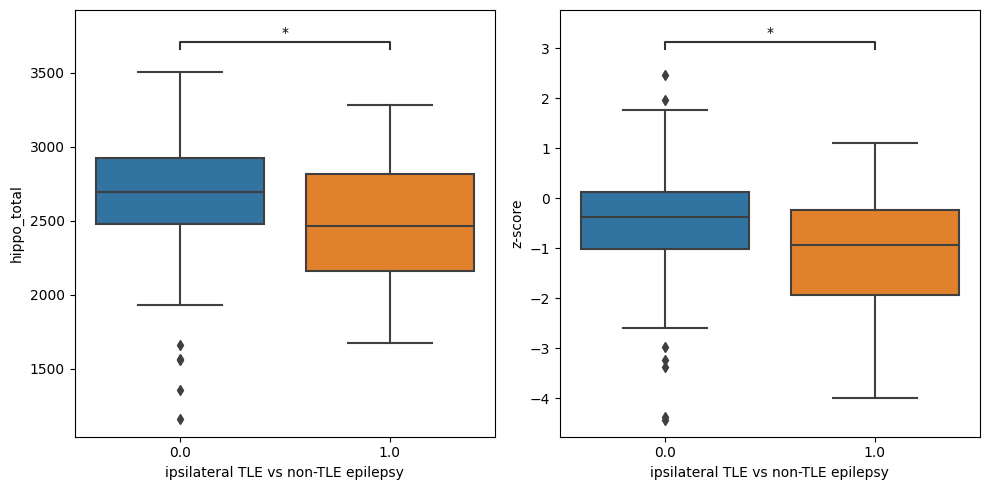

In [495]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

plot_info_vol = {'data':snsx_vol_df3,
              'x':'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)',
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_vol_zscore = {'data':snsx_vol_df3,
              'x':'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)',
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_vol_zscore)

annot = Annotator(ax[1], [(0,1)], **plot_info_vol_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_xlabel('ipsilateral TLE vs non-TLE epilepsy')
ax[1].set_xlabel('ipsilateral TLE vs non-TLE epilepsy')
plt.tight_layout()



In [749]:
snsx_vol_df3['ipsilateral_TLE'

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass,z-score
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,1.514590
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,0.111950
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-3.236250
8,sub-P064,L,545.908159,701.359659,96.785010,397.074824,147.762971,149.089619,551.471036,12.271495,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,-0.773686
12,sub-P006,L,494.229323,791.080777,85.603747,255.595802,79.780415,100.550555,509.014585,1.953932,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-1.346867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,474.244190,1006.755109,122.479514,293.829140,168.553747,140.356193,615.940556,25.609633,...,0.0,0.0,0.0,0.0,0.0,NaN,snsx,0,True,0.185100
241,sub-P008,R,381.843012,731.370737,89.022764,243.610463,142.334630,108.150618,478.834449,23.731301,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,-1.860643
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True,0.580365
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True,1.026525


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.588e-01 U_stat=6.140e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.799e-03 U_stat=9.850e+02


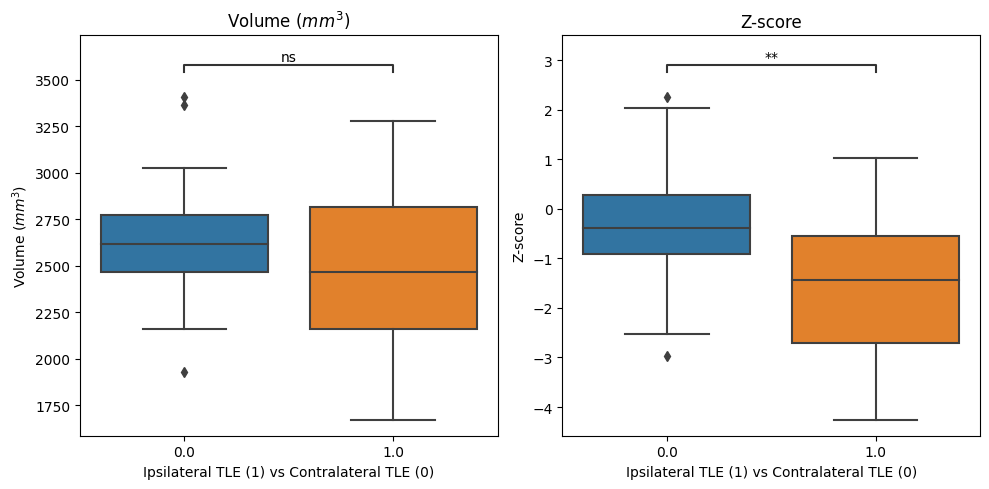

In [751]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

hue_arg = 'ipsilateral_TLE'
plot_info_ipsimts_vol = {'data':snsx_vol_df3,
              'x': hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_ipsimts_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_ipsimts_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_ipsimts_zscore = {'data':ipsimts_nontle_df,
              'x': hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_ipsimts)

annot = Annotator(ax[1], [(0,1)], **plot_info_ipsimts)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_xlabel('Ipsilateral TLE (1) vs Contralateral TLE (0)')
ax[1].set_xlabel('Ipsilateral TLE (1) vs Contralateral TLE (0)')
ax[0].set_title('Volume ($mm^3$)')
ax[1].set_title('Z-score')
ax[0].set_ylabel('Volume ($mm^3$)')
ax[1].set_ylabel('Z-score')
plt.tight_layout()



In [448]:
ipsimts_nontle_df

,participant_id,hemi,hippo_total,z-score,Temporal,mri_mts,mri_mts_location,ipsilateral_mts,ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),sex_code,pass
0,sub-P065,L,3500.888751,1.514590,NaN,NaN,NaN,NaN,NaN,1,True
4,sub-P100,L,2818.095435,0.111950,1.0,0.0,0.0,0.0,NaN,0,True
6,sub-P010,L,1563.395390,-3.236250,NaN,NaN,NaN,NaN,NaN,0,True
8,sub-P064,L,2601.722772,-0.773686,NaN,NaN,NaN,NaN,NaN,1,True
12,sub-P006,L,2317.809135,-1.346867,NaN,NaN,NaN,NaN,NaN,0,True
...,...,...,...,...,...,...,...,...,...,...,...
149,sub-LHS0019,R,2667.450146,-0.990146,NaN,0.0,0.0,0.0,NaN,1,True
151,sub-HSC0006,R,2579.814817,-0.673021,0.0,0.0,0.0,0.0,0.0,1,True
153,sub-TWH0019,R,2492.308342,-1.763969,NaN,NaN,NaN,NaN,NaN,1,True
155,sub-LHS0004,R,2627.376823,-0.586618,1.0,0.0,0.0,0.0,NaN,0,True


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:4.574e-03 U_stat=1.538e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.799e-03 U_stat=9.850e+02


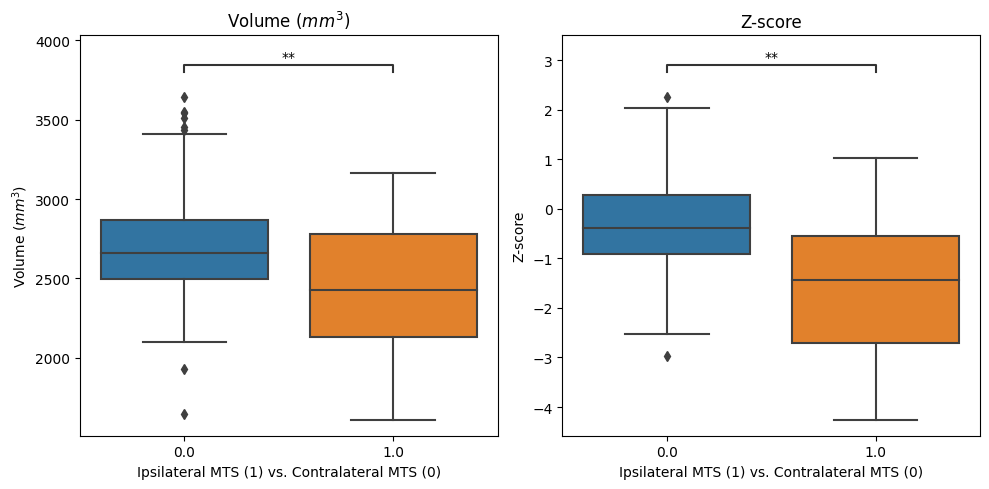

In [743]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

plot_info_ipsimts_vol = {'data':ipsimts_nontle_df,
              'x':'ipsilateral_mts',
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_ipsimts_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_ipsimts_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_ipsimts_zscore = {'data':ipsimts_nontle_df,
              'x':'ipsilateral_mts',
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_ipsimts)

annot = Annotator(ax[1], [(0,1)], **plot_info_ipsimts)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_title('Volume ($mm^3$)')
ax[1].set_title('Z-score')
ax[0].set_ylabel('Volume ($mm^3$)')
ax[1].set_ylabel('Z-score')

ax[0].set_xlabel('Ipsilateral MTS (1) vs. Contralateral MTS (0)')
ax[1].set_xlabel('Ipsilateral MTS (1) vs. Contralateral MTS (0)')

plt.tight_layout()



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:8.150e-03 U_stat=9.360e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.799e-03 U_stat=9.850e+02


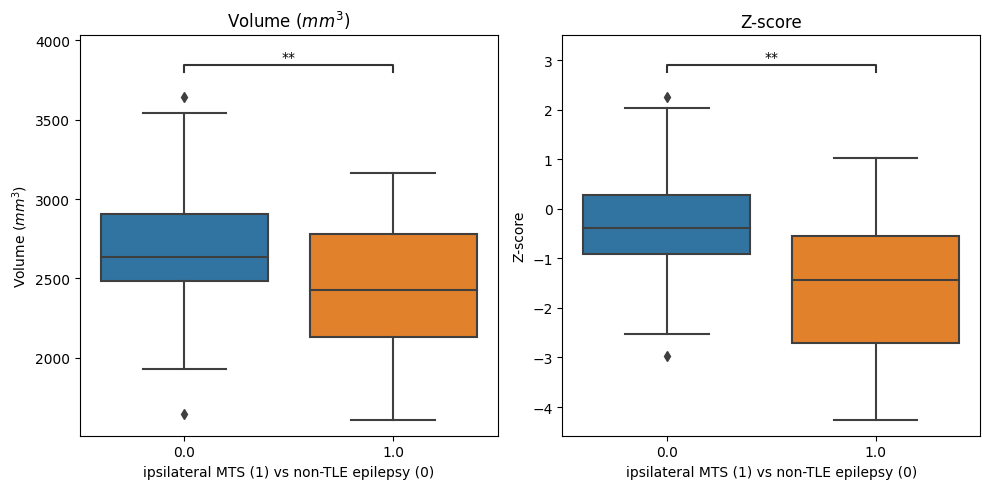

In [741]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

plot_info_ipsimts_vol = {'data':ipsimts_nontle_df,
              'x':'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)',
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_ipsimts_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_ipsimts_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_ipsimts_zscore = {'data':ipsimts_nontle_df,
              'x':'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)',
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_ipsimts)

annot = Annotator(ax[1], [(0,1)], **plot_info_ipsimts)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_xlabel('ipsilateral MTS (1) vs non-TLE epilepsy (0)')
ax[1].set_xlabel('ipsilateral MTS (1) vs non-TLE epilepsy (0)')
ax[0].set_title('Volume ($mm^3$)')
ax[1].set_title('Z-score')
ax[0].set_ylabel('Volume ($mm^3$)')
ax[1].set_ylabel('Z-score')
plt.tight_layout()



In [746]:
snsx_vol_df3

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass,z-score
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,1.514590
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,0.111950
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-3.236250
8,sub-P064,L,545.908159,701.359659,96.785010,397.074824,147.762971,149.089619,551.471036,12.271495,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,-0.773686
12,sub-P006,L,494.229323,791.080777,85.603747,255.595802,79.780415,100.550555,509.014585,1.953932,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-1.346867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,474.244190,1006.755109,122.479514,293.829140,168.553747,140.356193,615.940556,25.609633,...,0.0,0.0,0.0,0.0,0.0,NaN,snsx,0,True,0.185100
241,sub-P008,R,381.843012,731.370737,89.022764,243.610463,142.334630,108.150618,478.834449,23.731301,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,-1.860643
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True,0.580365
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True,1.026525


In [748]:
snsx_vol_df3['ip

,participant_id,hemi,Sub,CA1,CA2,CA3,CA4,DG,SRLM,Cyst,...,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset,sex_code,pass,z-score
0,sub-P065,L,630.742203,1095.912281,141.675039,421.587182,263.970543,166.337812,739.324256,41.339433,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,1.514590
4,sub-P100,L,578.509185,879.764071,142.064633,335.706970,116.727675,135.769017,629.422566,0.131320,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,0.111950
6,sub-P010,L,291.767196,461.317622,73.513674,202.225720,131.060750,69.734326,322.292699,11.483404,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-3.236250
8,sub-P064,L,545.908159,701.359659,96.785010,397.074824,147.762971,149.089619,551.471036,12.271495,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,1,True,-0.773686
12,sub-P006,L,494.229323,791.080777,85.603747,255.595802,79.780415,100.550555,509.014585,1.953932,...,NaN,0.0,0.0,0.0,0.0,NaN,snsx,0,True,-1.346867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,474.244190,1006.755109,122.479514,293.829140,168.553747,140.356193,615.940556,25.609633,...,0.0,0.0,0.0,0.0,0.0,NaN,snsx,0,True,0.185100
241,sub-P008,R,381.843012,731.370737,89.022764,243.610463,142.334630,108.150618,478.834449,23.731301,...,1.0,1.0,NaN,NaN,1.0,NaN,snsx,0,True,-1.860643
243,sub-P077,R,527.568036,1073.894321,98.750765,276.761302,189.757582,140.332064,710.892896,10.158147,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,0,True,0.580365
245,sub-P012,R,525.914053,1199.273287,141.973100,361.134184,216.536955,184.839020,710.652739,69.431368,...,NaN,NaN,NaN,NaN,0.0,0.0,snsx,1,True,1.026525


<AxesSubplot: title={'center': 'Volume ($mm^3$)'}, xlabel='Ipsilateral TLE (1) vs Contralateral TLE (0)', ylabel='Volume ($mm^3$)'>

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.184e-02 U_stat=2.030e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.799e-03 U_stat=9.850e+02


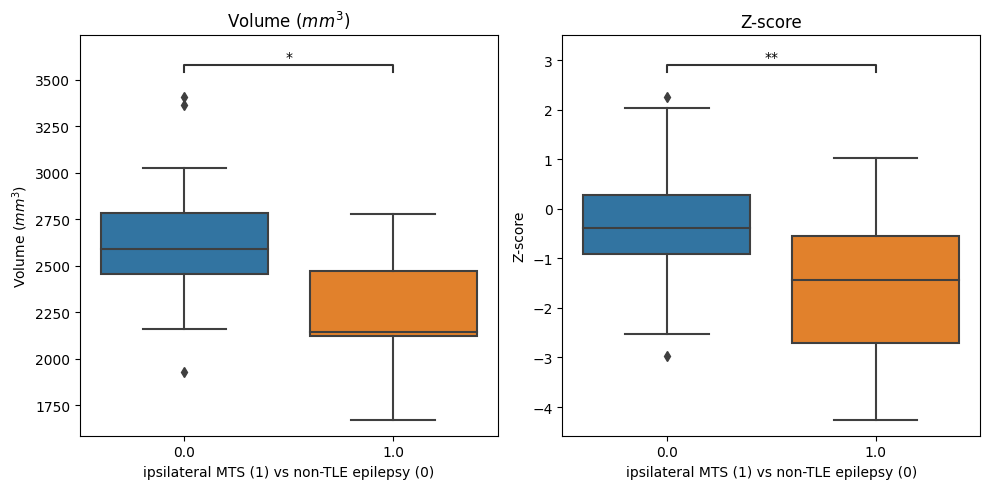

In [747]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

hue_arg = 'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)'
plot_info_ipsimts_vol = {'data':snsx_vol_df3,
              'x': hue_arg,
              'y':'hippo_total'}

sns.boxplot(ax=ax[0],**plot_info_ipsimts_vol)

annot = Annotator(ax[0], [(0,1)], **plot_info_ipsimts_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni",verbose=True).apply_and_annotate()


plot_info_ipsimts_zscore = {'data':ipsimts_nontle_df,
              'x': hue_arg,
              'y':'z-score'}

sns.boxplot(ax=ax[1],**plot_info_ipsimts)

annot = Annotator(ax[1], [(0,1)], **plot_info_ipsimts)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].set_xlabel('ipsilateral MTS (1) vs non-TLE epilepsy (0)')
ax[1].set_xlabel('ipsilateral MTS (1) vs non-TLE epilepsy (0)')
ax[0].set_title('Volume ($mm^3$)')
ax[1].set_title('Z-score')
ax[0].set_ylabel('Volume ($mm^3$)')
ax[1].set_ylabel('Z-score')
plt.tight_layout()



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.851e-03 U_stat=3.120e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:6.031e-01 U_stat=1.540e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:9.269e-04 U_stat=3.290e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

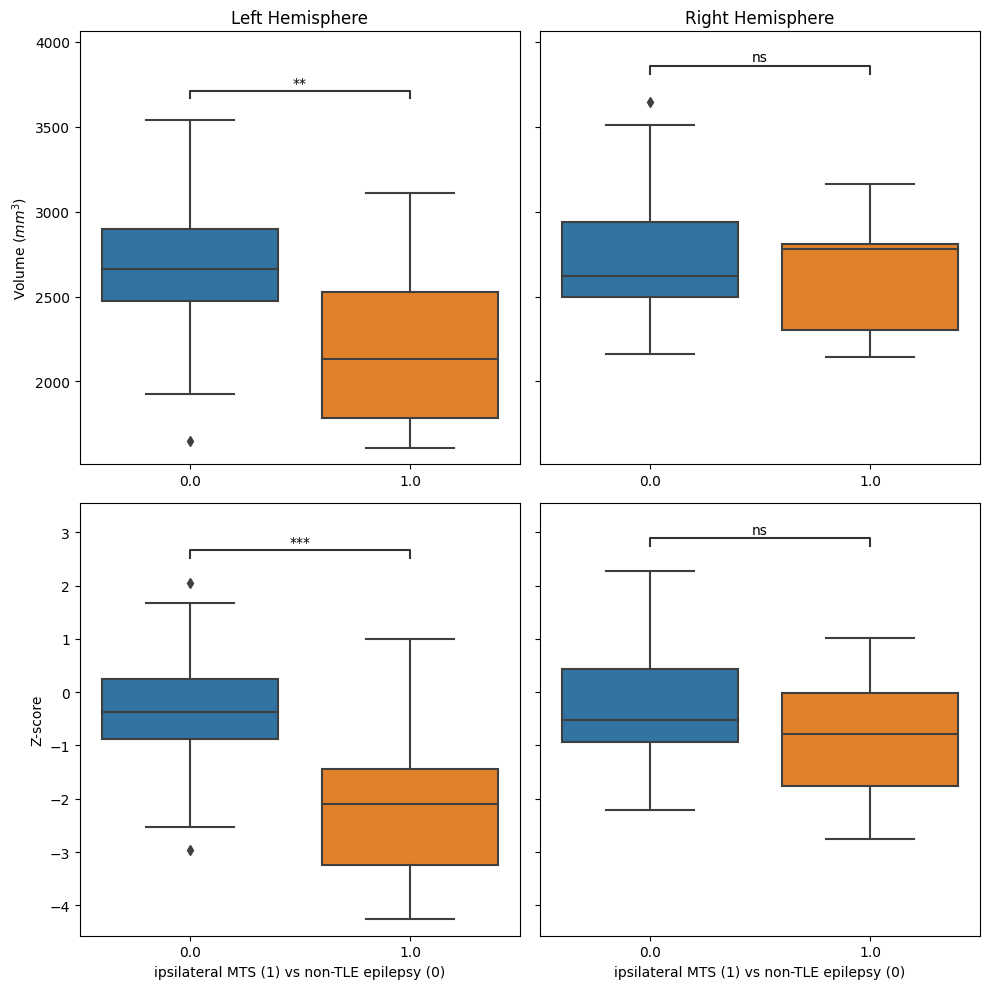

In [738]:
fig, ax = plt.subplots( 2, 2, figsize=(10,10),sharey='row')

# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
 
hemiL_vol = { 'data': ipsimts_nontle_dfL, 'x' : 'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)', 'y' : 'hippo_total' }
hemiR_vol = { 'data': ipsimts_nontle_dfR, 'x' : 'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)', 'y' : 'hippo_total' }

sns.boxplot(ax=ax[0][0],**hemiL_vol)

annot = Annotator(ax[0][0], [(0,1)], **hemiL_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[0][1],**hemiR_vol)

annot = Annotator(ax[0][1], [(0,1)], **hemiR_vol)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

# ax[0].get_legend().set_visible(False)
# sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0][0].title.set_text('Left Hemisphere')
ax[0][1].title.set_text('Right Hemisphere')

ax[0][0].set_xlabel('')
ax[0][1].set_xlabel('')

ax[1][0].set_ylabel('Volume ($mm^3$)')
ax[1][1].set_ylabel('Z-score Volume')
############################################################################################33

hemiL_zscore = { 'data': ipsimts_nontle_dfL, 'x' : 'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)', 'y' : 'z-score' }
hemiR_zscore = { 'data': ipsimts_nontle_dfR, 'x' : 'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)', 'y' : 'z-score' }

sns.boxplot(ax=ax[1][0],**hemiL_zscore)

annot = Annotator(ax[1][0], [(0,1)], **hemiL_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1][1],**hemiR_zscore)

annot = Annotator(ax[1][1], [(0,1)], **hemiR_zscore)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

# ax[0].get_legend().set_visible(False)
# sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

# ax[1][0].title.set_text('Left Hemisphere')
# ax[1][1].title.set_text('Right Hemisphere')

ax[1][0].set_xlabel('ipsilateral MTS (1) vs non-TLE epilepsy (0)')
ax[1][1].set_xlabel('ipsilateral MTS (1) vs non-TLE epilepsy (0)')

ax[0][0].set_ylabel('Volume ($mm^3$)')
ax[1][0].set_ylabel('Z-score')

ax[0][1].set_ylabel('')
ax[1][1].set_ylabel('')
fig.tight_layout()


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

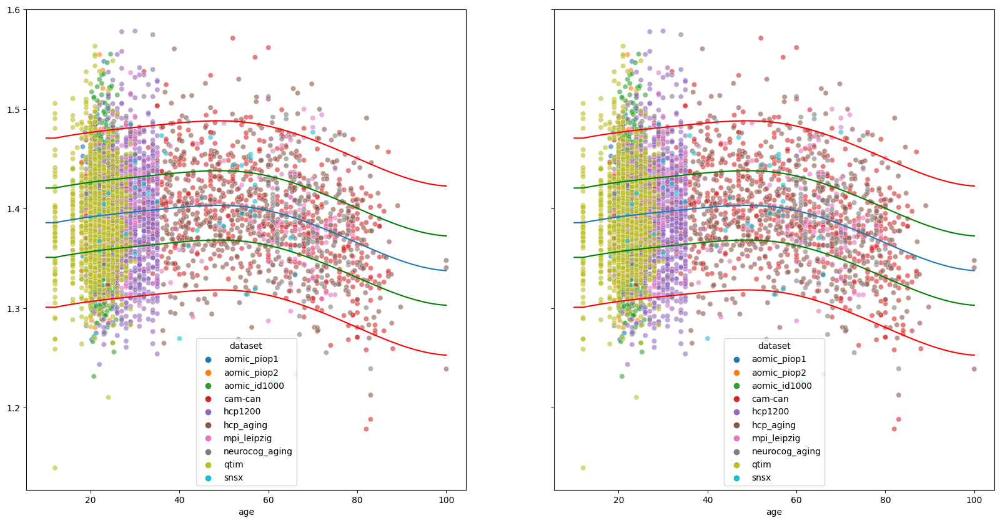

In [564]:
nm_plot_hemi(thick_combat_snsx_df, thick_data, thick_models,'dataset')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


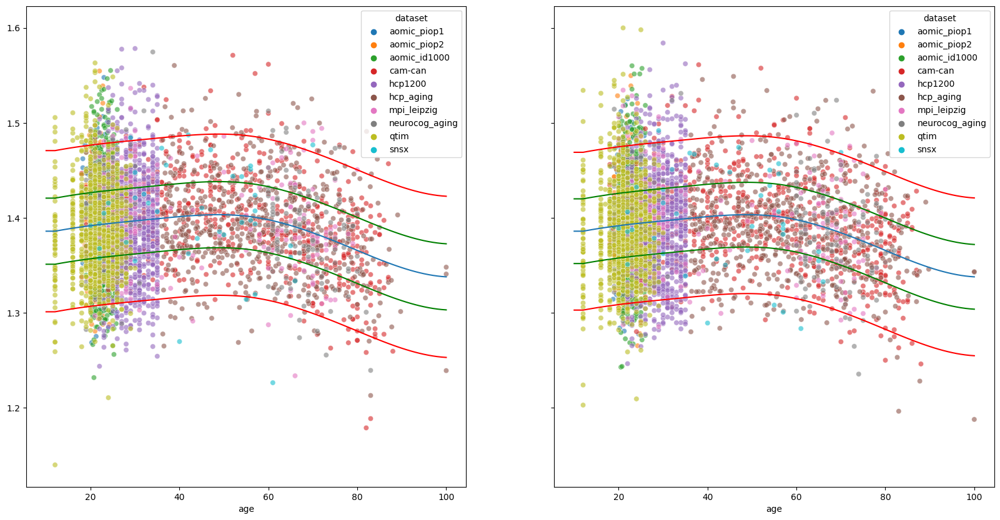

In [390]:
fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10),sharey=True)
sns.scatterplot(x=thick_combat_snsx_df.age,y=thick_hemiL.mean(axis=0),hue=thick_combat_snsx_df.dataset,alpha=0.6,ax=ax[0])
# sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(thick_modelL,[.75,.95],thick_hemiL.mean(axis=0).std(ddof=1),X=X_test2)
ax[0].plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax[0].plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax[0].plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

sns.scatterplot(x=thick_combat_snsx_df.age,y=thick_hemiR.mean(axis=0),hue=thick_combat_snsx_df.dataset,alpha=0.6,ax=ax[1])
# sns.move_legend(ax[0], "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(thick_modelL,[.75,.95],thick_hemiR.mean(axis=0).std(ddof=1),X=X_test2)
ax[1].plot(X_test2[:,0], thick_yhatR,label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax[1].plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax[1].plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

In [565]:
snsx_epiLR = np.split(thick_epi_combat['data'],2)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

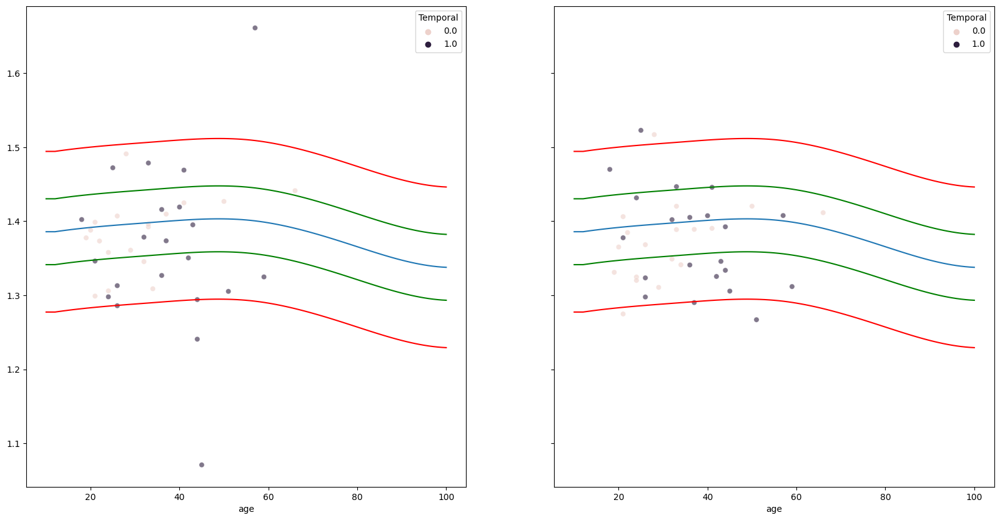

In [567]:
nm_plot_hemi(snsx_epi_dfs_clinical[0], snsx_epiLR, thick_models,'Temporal')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

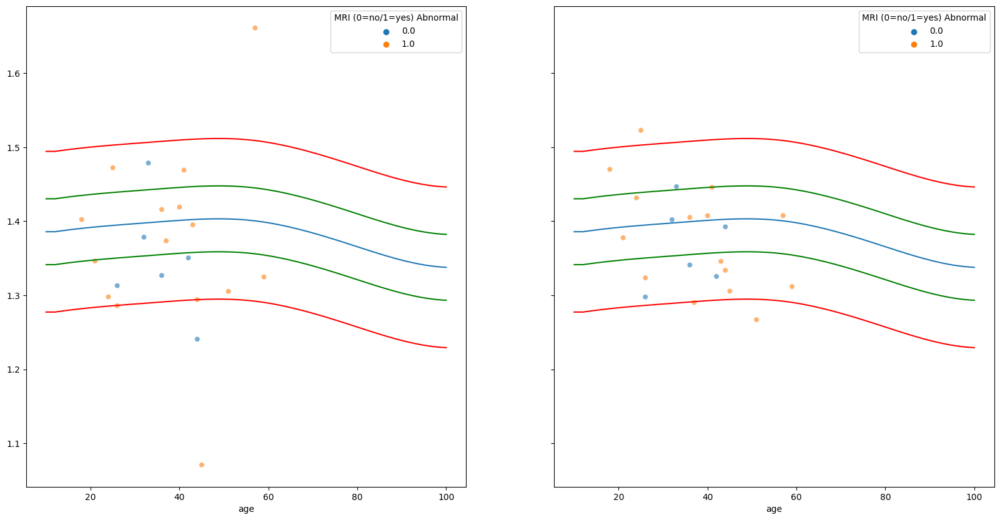

In [568]:
nm_plot_hemi(snsx_epi_dfs_clinical[0], snsx_epiLR, thick_models,'MRI (0=no/1=yes) Abnormal',filter_dict={'Temporal':1})

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

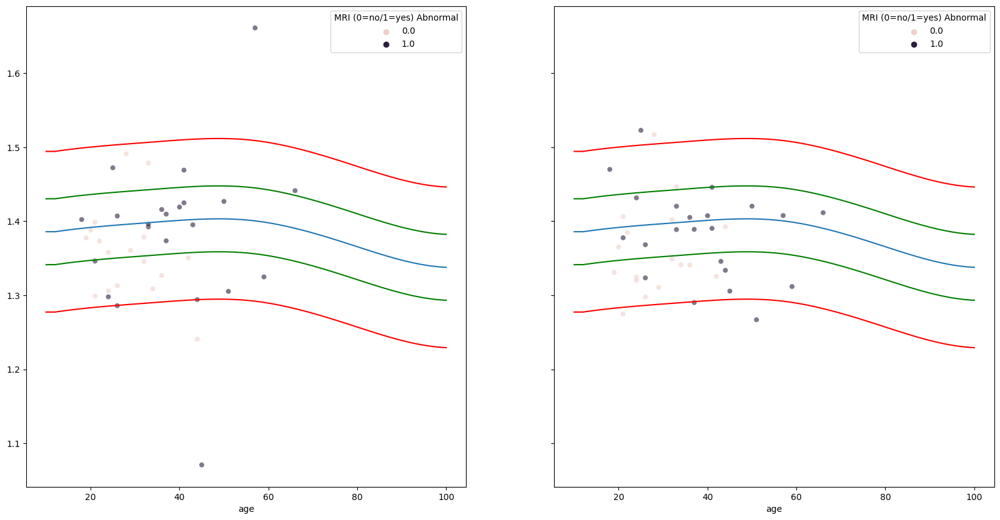

In [569]:
nm_plot_hemi(snsx_epi_dfs_clinical[0], snsx_epiLR, thick_models,'MRI (0=no/1=yes) Abnormal')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

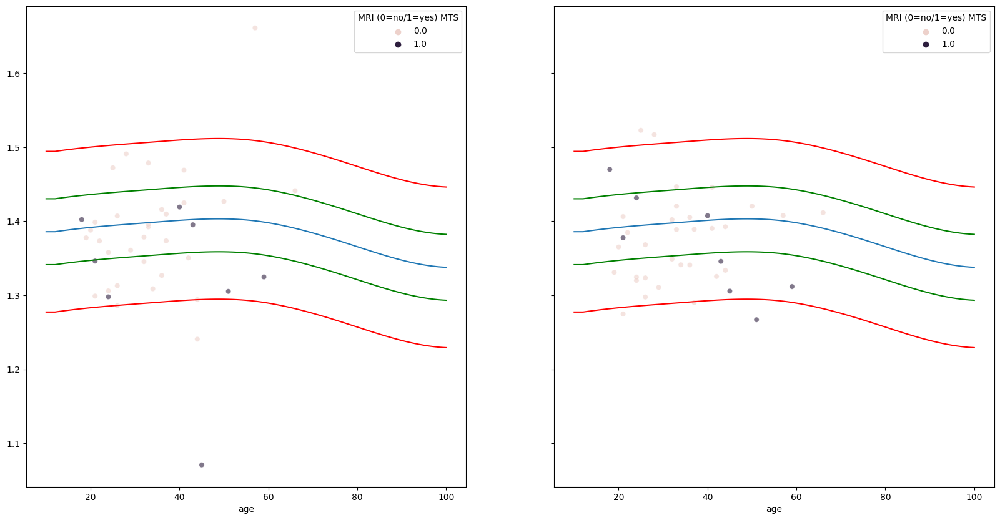

In [570]:
nm_plot_hemi(snsx_epi_dfs_clinical[0], snsx_epiLR, thick_models,'MRI (0=no/1=yes) MTS')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

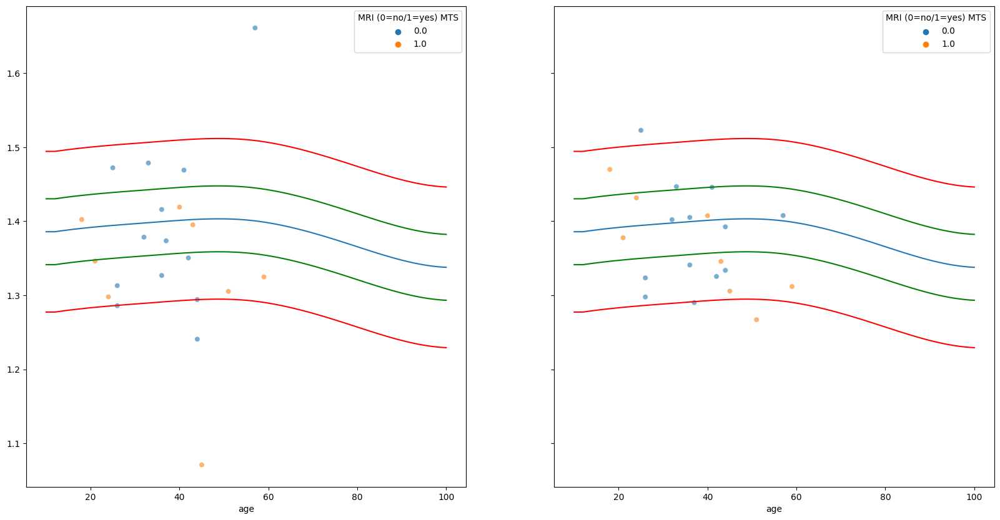

In [571]:
nm_plot_hemi(snsx_epi_dfs_clinical[0], snsx_epiLR, thick_models,'MRI (0=no/1=yes) MTS',filter_dict={'Temporal':1})

In [59]:
bspline_bayesianridge_model.fit(gyr_combat_snsx_df[['age','sex_code']],gyr_combat_snsx['data'].mean(axis=0))
gyr_yhat = bspline_bayesianridge_model.predict(X_test2)

NameError: name 'gyr_combat_snsx' is not defined

In [340]:
gyr_score = cross_val_score(bspline_bayesianridge_model,X=gyr_combat_snsx_df[['age','sex_code']],y=gyr_combat_snsx['data'].mean(axis=0),cv=5)
print("%0.2f accuracy with a standard deviation of %0.2f" % (gyr_score.mean(), gyr_score.std()))

0.12 accuracy with a standard deviation of 0.05


In [343]:
cross_validate(bspline_bayesianridge_model,X=gyr_combat_snsx_df[['age','sex_code']],y=gyr_combat_snsx['data'].mean(axis=0),cv=5,scoring='neg_root_mean_squared_error',)

{'fit_time': array([0.04671431, 0.02805591, 0.0477953 , 0.0508213 , 0.04504108]),
 'score_time': array([0.00791216, 0.0061667 , 0.01192617, 0.03556561, 0.00766802]),
 'test_score': array([-0.23642042, -0.23469659, -0.25600882, -0.2433624 , -0.21471218])}

In [344]:
gyr_preds, gyr_betas = bootstrap_model(gyr_combat_snsx_df[['age','sex_code']],gyr_combat_snsx['data'].mean(axis=0),X_test2,bspline_bayesianridge_model)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/ba

(<Figure size 640x480 with 1 Axes>, <AxesSubplot: xlabel='age'>)

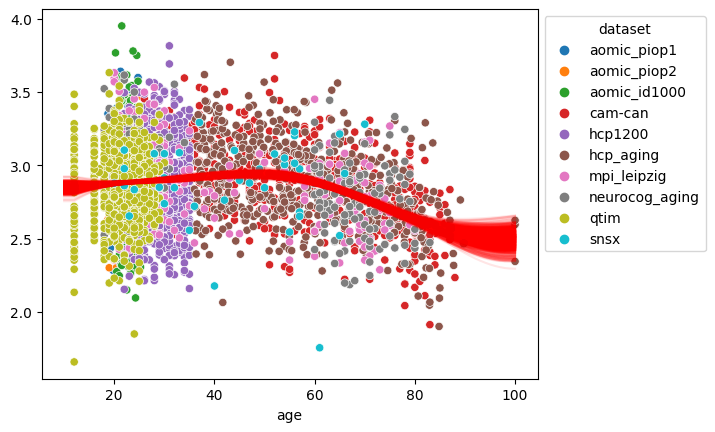

In [345]:
plot_bs_models(gyr_combat_snsx_df.age,gyr_combat_snsx['data'].mean(axis=0), X_test2[:,0],np.array(gyr_preds), labels=gyr_combat_snsx_df.dataset)

(<Figure size 640x480 with 1 Axes>, <AxesSubplot: xlabel='age'>)

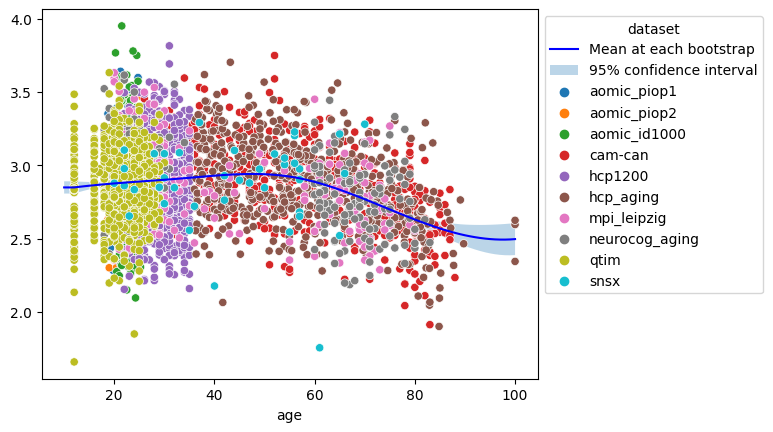

In [346]:
plot_bs_ci(gyr_combat_snsx_df.age,gyr_combat_snsx['data'].mean(axis=0), X_test2[:,0],np.array(gyr_preds), labels=gyr_combat_snsx_df.dataset)

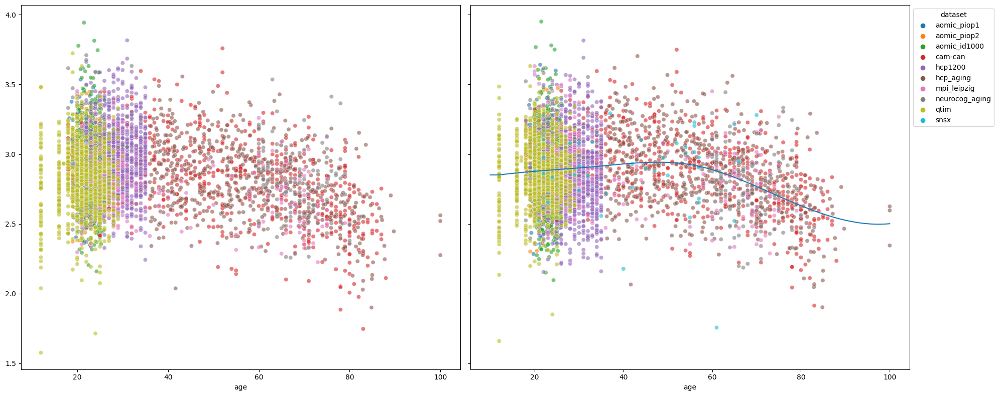

In [350]:
fig, ax = plt.subplots(1,2,figsize=(20,8),sharey=True)
sns.scatterplot(x=cov_data[1].age,y=resp_data[1],hue=cov_data[1].dataset,alpha=0.6,ax=ax[0])
ax[0].legend([],[], frameon=False)
sns.scatterplot(x=gyr_combat_snsx_df.age,y=gyr_combat_snsx['data'].mean(axis=0),hue=gyr_combat_snsx_df.dataset,alpha=0.6,ax=ax[1])
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].plot(X_test2[:,0], gyr_yhat)
plt.tight_layout()

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


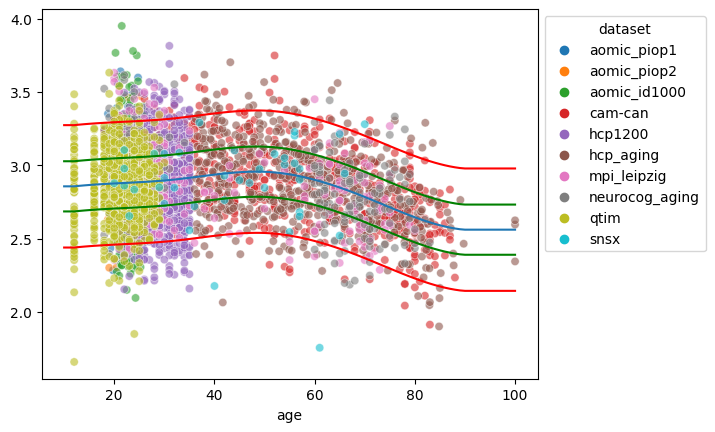

In [352]:
fig, ax = plt.subplots()
sns.scatterplot(x=gyr_combat_snsx_df.age,y=gyr_combat_snsx['data'].mean(axis=0),hue=gyr_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(bspline_bayesianridge_model,[.75,.95],gyr_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


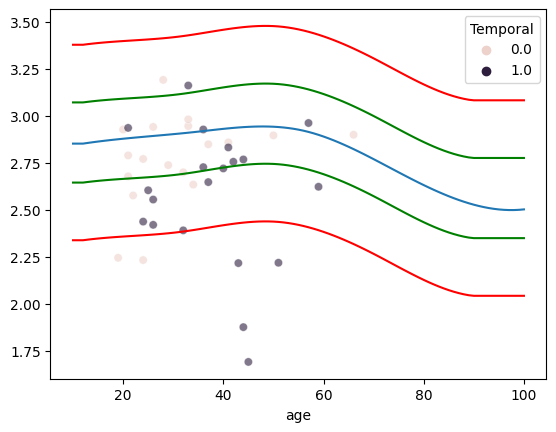

In [360]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[1].age,y=gyr_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[1].Temporal,alpha=0.6,ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(bspline_bayesianridge_model,[.75,.95],gyr_epi_combat['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], gyr_yhat,label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


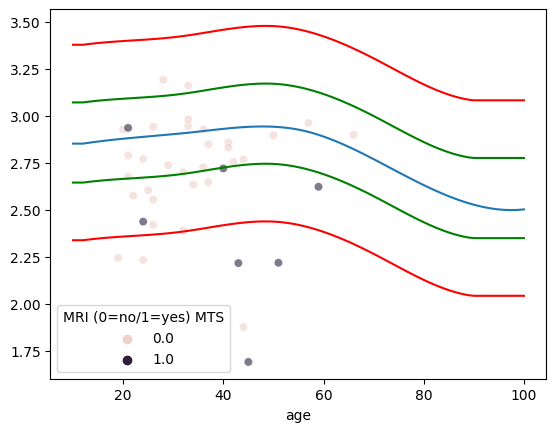

In [361]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[1].age,y=gyr_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[1]['MRI (0=no/1=yes) MTS'],alpha=0.6,ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(bspline_bayesianridge_model,[.75,.95],gyr_epi_combat['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], gyr_yhat,label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


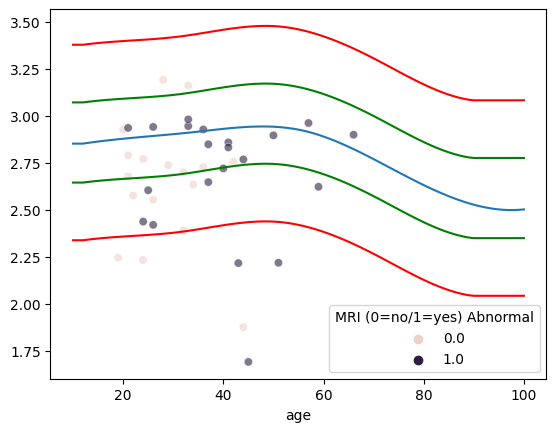

In [362]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[1].age,y=gyr_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[1]['MRI (0=no/1=yes) Abnormal'],alpha=0.6,ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(bspline_bayesianridge_model,[.75,.95],gyr_epi_combat['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], gyr_yhat,label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


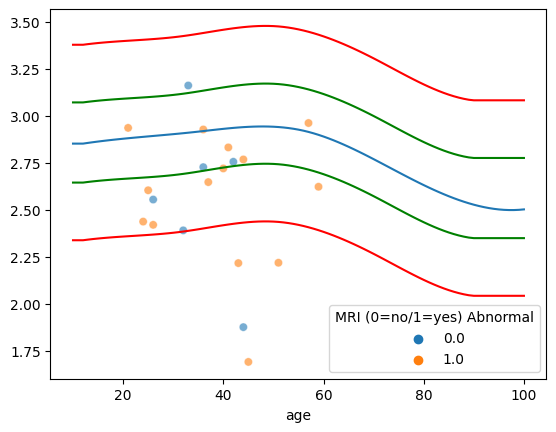

In [366]:
temp_bool = (snsx_epi_dfs_clinical[1].Temporal ==1)

fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[1].age[temp_bool],y=gyr_epi_combat['data'].mean(axis=0)[temp_bool],hue=snsx_epi_dfs_clinical[1][temp_bool]['MRI (0=no/1=yes) Abnormal'],alpha=0.6,ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(bspline_bayesianridge_model,[.75,.95],gyr_epi_combat['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], gyr_yhat,label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

In [60]:
gyr_data, gyr_models, gyr_yhat = modelLR(gyr_combat_df, gyr_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [73]:
snsx_gyr_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[1], snsx_gyr_epi_combat['data'], gyr_combat['data'], gyr_models, gyr_std)
snsx_gyr_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[1], snsx_gyr_disease_ctrl_combat['data'], gyr_combat['data'], gyr_models, gyr_std)

In [74]:
snsx_gyr_epi_deviations = compute_deviations(snsx_epi_dfs_clinical[1], snsx_gyr_epi_combat['data'], gyr_combat['data'], gyr_models)
snsx_gyr_disease_ctrl_deviations = compute_deviations(snsx_disease_ctrl_dfs[1], snsx_gyr_disease_ctrl_combat['data'], gyr_combat['data'], gyr_models)

In [75]:
eplink_gyr_possibleTLE_zscore = compute_zscores(eplink_possibleTLE_dfs[1], eplink_gyr_possibleTLE_combat['data'], gyr_combat['data'], gyr_models, gyr_std)
eplink_gyr_possibleTLE_deviations = compute_deviations(eplink_possibleTLE_dfs[1], eplink_gyr_possibleTLE_combat['data'], gyr_combat['data'], gyr_models)
# snsx_gyr_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[1], snsx_gyr_disease_ctrl_combat['data'], gyr_combat['data'], gyr_models, gyr_std)

<AxesSubplot: xlabel='age'>

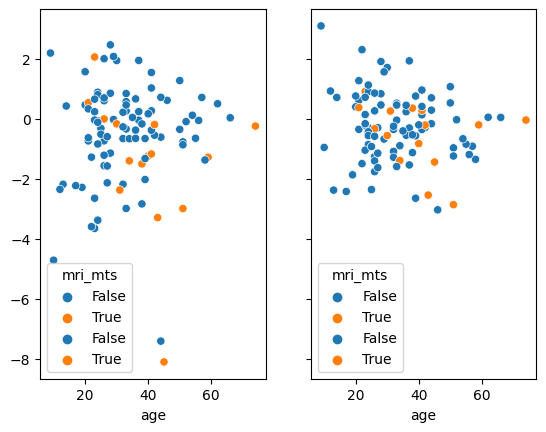

In [97]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_epi_dfs_clinical[1].age, y = snsx_gyr_epi_zscore[0], hue =  snsx_epi_dfs_clinical[1]['mri_mts'],ax=ax[0])
sns.scatterplot(x = eplink_possibleTLE_dfs[1].age, y = eplink_gyr_possibleTLE_zscore[0], hue =  eplink_possibleTLE_dfs[1]['mri_mts'],ax=ax[0])

sns.scatterplot(x = snsx_epi_dfs_clinical[1].age, y = snsx_gyr_epi_zscore[1], hue =  snsx_epi_dfs_clinical[1]['mri_mts'],ax=ax[1])
sns.scatterplot(x = eplink_possibleTLE_dfs[1].age, y = eplink_gyr_possibleTLE_zscore[1], hue =  eplink_possibleTLE_dfs[1]['mri_mts'],ax=ax[1])

In [ ]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_vol_df.age, y =[0], hue =  snsx_epi_dfs_clinical[1]['mri_mts'],ax=ax[0])
sns.scatterplot(x = eplink_possibleTLE_dfs[1].age, y = eplink_gyr_possibleTLE_zscore[0], hue =  eplink_possibleTLE_dfs[1]['mri_mts'],ax=ax[0])

sns.scatterplot(x = snsx_epi_dfs_clinical[1].age, y = snsx_gyr_epi_zscore[1], hue =  snsx_epi_dfs_clinical[1]['mri_mts'],ax=ax[1])
sns.scatterplot(x = eplink_possibleTLE_dfs[1].age, y = eplink_gyr_possibleTLE_zscore[1], hue =  eplink_possibleTLE_dfs[1]['mri_mts'],ax=ax[1])

<AxesSubplot: xlabel='age'>

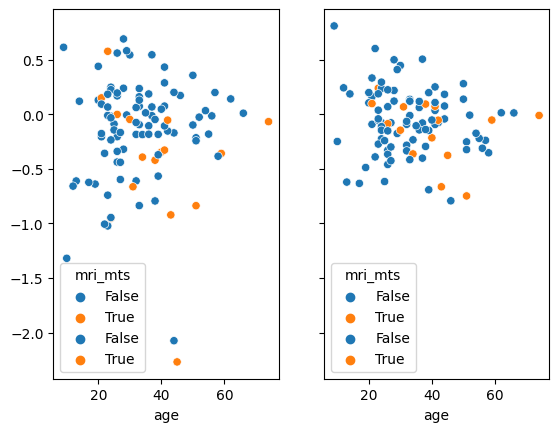

In [98]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_epi_dfs_clinical[1].age, y = snsx_gyr_epi_deviations[0], hue =  snsx_epi_dfs_clinical[1]['mri_mts'],ax=ax[0])
sns.scatterplot(x = eplink_possibleTLE_dfs[1].age, y = eplink_gyr_possibleTLE_deviations[0], hue =  eplink_possibleTLE_dfs[1]['mri_mts'],ax=ax[0])

sns.scatterplot(x = snsx_epi_dfs_clinical[1].age, y = snsx_gyr_epi_deviations[1], hue =  snsx_epi_dfs_clinical[1]['mri_mts'],ax=ax[1])
sns.scatterplot(x = eplink_possibleTLE_dfs[1].age, y = eplink_gyr_possibleTLE_deviations[1], hue =  eplink_possibleTLE_dfs[1]['mri_mts'],ax=ax[1])

In [541]:
snsx_epi_dfs_clinical[2]

,participant_id,age,sex,diagnosis,handedness,site,dataset,paths,site_code,sex_code,...,Pathology of the surgery (0=no/1=yes) MTS,Pathology of the surgery (0=no/1=yes) Non-specific,Pathology of the surgery (0=no/1=yes) normal,Pathology of the surgery (0=no/1=yes) FCD,Pathology of the surgery (0=no/1=yes) other,Pathology of surgery: performed,Pathology notes,Revaluate,note,Unnamed: 78
0,sub-P008,26.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,0.0,0.0,1.0,0.0,0.0,NaN,"Reactive glliosis in right temporal neocortex,...",0.0,NaN,NaN
1,sub-P012,28.0,m,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,1,...,0.0,0.0,0.0,0.0,0.0,Right temporal lobe craniotomy and temporal lo...,reactive gliosis focally increased at corpora ...,1.0,"Previously had right frontal lobectomy, left V...",1.0
2,sub-P013,37.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,1.0,0.0,0.0,0.0,0.0,NaN,Depletion of CA1 neurons and less prominent a...,0.0,NaN,NaN
3,sub-P014,33.0,m,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,No surgery and appears to be being treated by ...,NaN
4,sub-P018,29.0,f,Epilepsy,left,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
5,sub-P020,37.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,Engel score based on clinic report 2 months po...,1.0
6,sub-P021,32.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,NaN,NaN,NaN,NaN,NaN,No resection performed due to high risk of mot...,NaN,0.0,NaN,NaN
7,sub-P022,21.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,NaN,NaN,NaN,NaN,NaN,Rolandic epilepsy and so no cortical resection,NaN,0.0,Rolandic cortex where seizure is believed to o...,NaN
8,sub-P026,36.0,f,Epilepsy,right,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,0.0,1.0,0.0,0.0,1.0,temporal lobectomy,NaN,1.0,june 2nd clinic report says right mesial tempo...,NaN
9,sub-P028,20.0,f,Epilepsy,left,snsx,snsx,/home/ROBARTS/myousif/graham/projects/ctb-akha...,18.0,0,...,NaN,NaN,NaN,NaN,0.0,right central craniotomy and cortical resection,NaN,0.0,Engel and ILAE scores based on 1 month follow ...,NaN


In [543]:
model.fit(myelin_combat_snsx_df[['age','sex_code']],myelin_combat_snsx['data'].mean(axis=0))
myelin_yhat = model.predict(X_test2)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [121]:
myelin_data, myelin_models, myelin_yhat = modelLR(myelin_combat_df,myelin_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [ ]:
nm_plot_hemi(snsx_epi_dfs_clinical[2], split_data_wholehipp(myelin_epi_combat['data']), myelin_models,'MRI (0=no/1=yes) MTS',filter_dict={'Temporal':1})

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

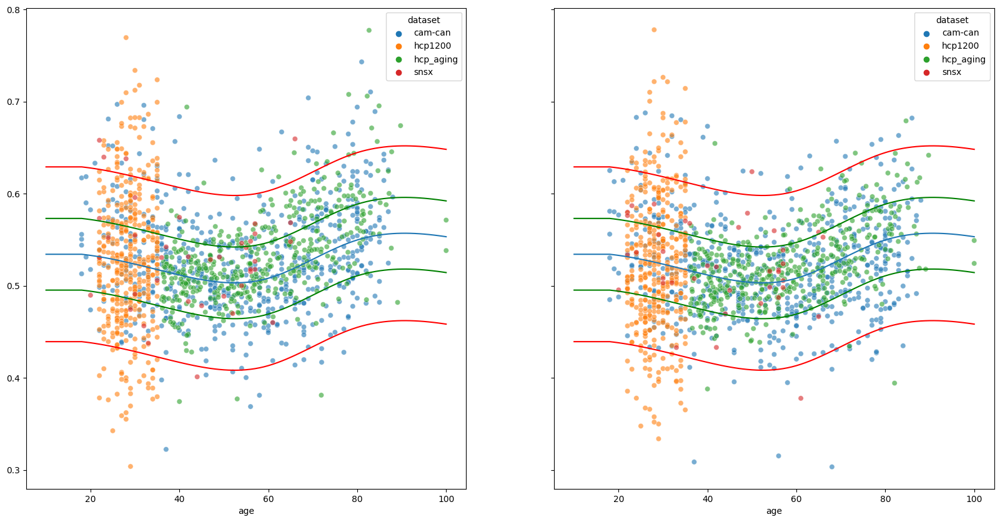

In [574]:
nm_plot_hemi(myelin_combat_snsx_df, split_data_wholehipp(myelin_combat_snsx['data']), myelin_models,'dataset')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

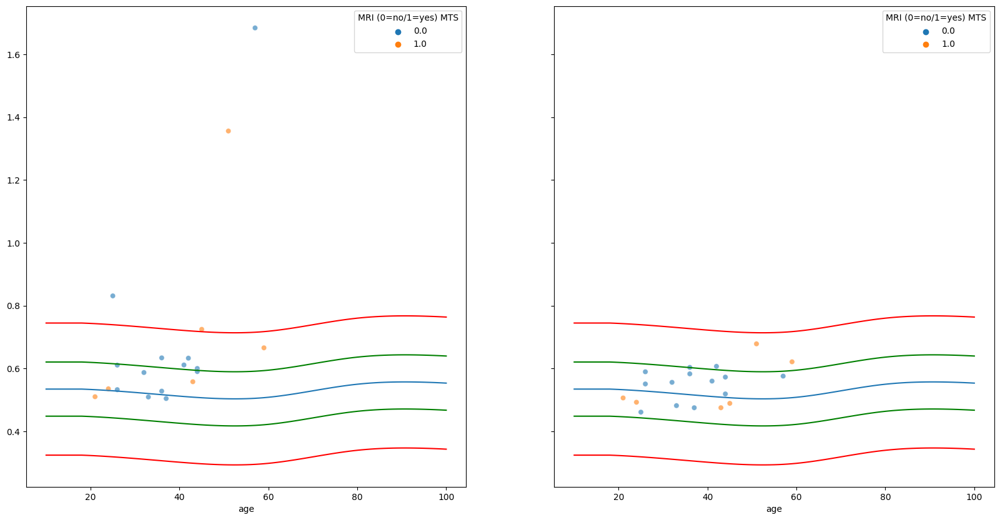

In [575]:
nm_plot_hemi(snsx_epi_dfs_clinical[2], split_data_wholehipp(myelin_epi_combat['data']), myelin_models, 'MRI (0=no/1=yes) MTS',filter_dict={'Temporal':1})

In [369]:
cross_validate(model,X=myelin_combat_snsx_df[['age','sex_code']],y=myelin_combat_snsx['data'].mean(axis=0),cv=5,scoring='neg_root_mean_squared_error',)

{'fit_time': array([0.01752901, 0.00940371, 0.01675391, 0.00581908, 0.00574183]),
 'score_time': array([0.00246549, 0.00208616, 0.00204039, 0.00185728, 0.00181818]),
 'test_score': array([-0.05273555, -0.05253182, -0.06742946, -0.05379315, -0.04067158])}

In [370]:
myelin_preds, myelin_betas = bootstrap_model(myelin_combat_snsx_df[['age','sex_code']], myelin_combat_snsx['data'].mean(axis=0),X_test2,bspline_bayesianridge_model)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/ba

(<Figure size 640x480 with 1 Axes>, <AxesSubplot: xlabel='age'>)

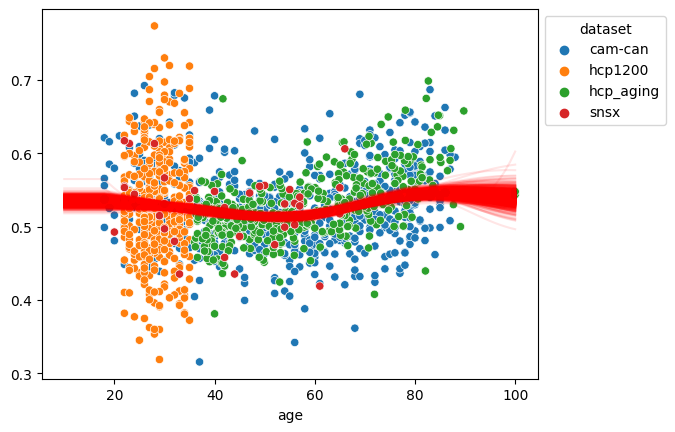

In [371]:
plot_bs_models(myelin_combat_snsx_df.age,myelin_combat_snsx['data'].mean(axis=0), X_test2[:,0],np.array(myelin_preds), labels=myelin_combat_snsx_df.dataset)

(<Figure size 640x480 with 1 Axes>, <AxesSubplot: xlabel='age'>)

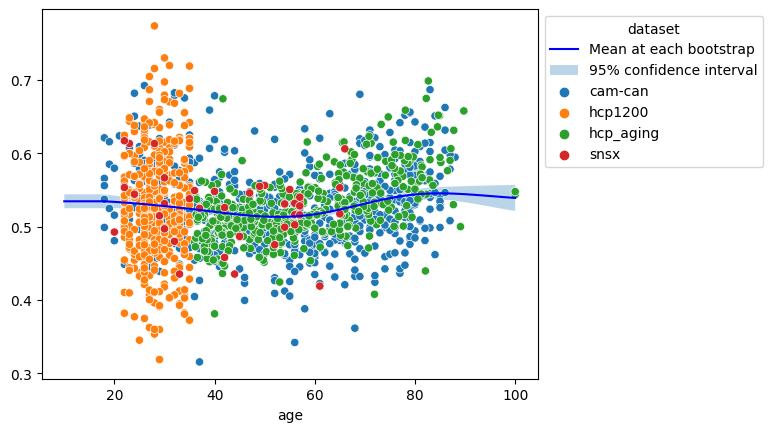

In [372]:
plot_bs_ci(myelin_combat_snsx_df.age,myelin_combat_snsx['data'].mean(axis=0), X_test2[:,0],np.array(myelin_preds), labels=myelin_combat_snsx_df.dataset)

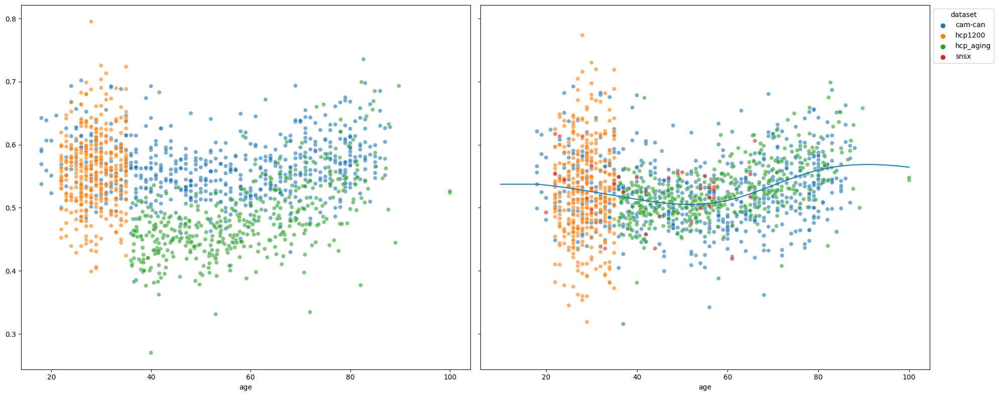

In [376]:
fig, ax = plt.subplots(1,2,figsize=(20,8),sharey=True)
sns.scatterplot(x=cov_data[2].age,y=resp_data[2],hue=cov_data[2].dataset,alpha=0.6,ax=ax[0])
ax[0].legend([],[], frameon=False)
sns.scatterplot(x=myelin_combat_snsx_df.age,y=myelin_combat_snsx['data'].mean(axis=0),hue=myelin_combat_snsx_df.dataset,alpha=0.6,ax=ax[1])
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].plot(X_test2[:,0], myelin_yhat)
plt.tight_layout()

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


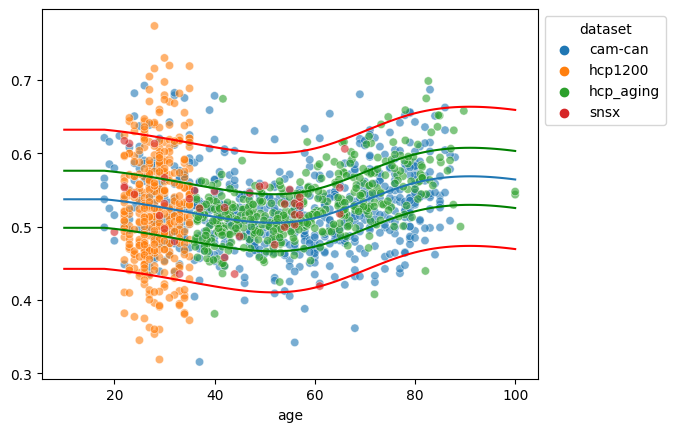

In [378]:
fig, ax = plt.subplots()
sns.scatterplot(x=myelin_combat_snsx_df.age,y=myelin_combat_snsx['data'].mean(axis=0),hue=myelin_combat_snsx_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],myelin_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0], label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


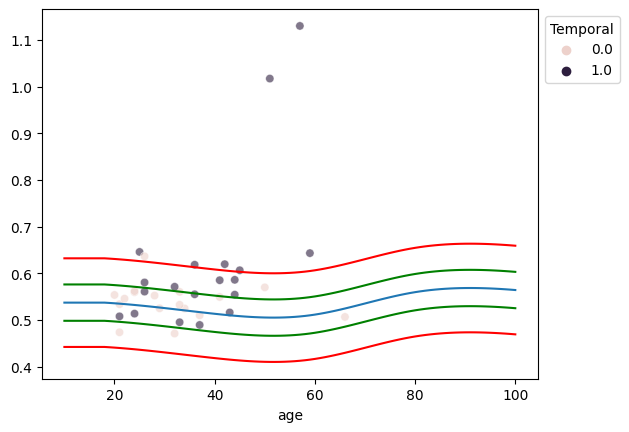

In [382]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[2].age,y=myelin_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[2].Temporal,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],myelin_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], myelin_yhat, label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


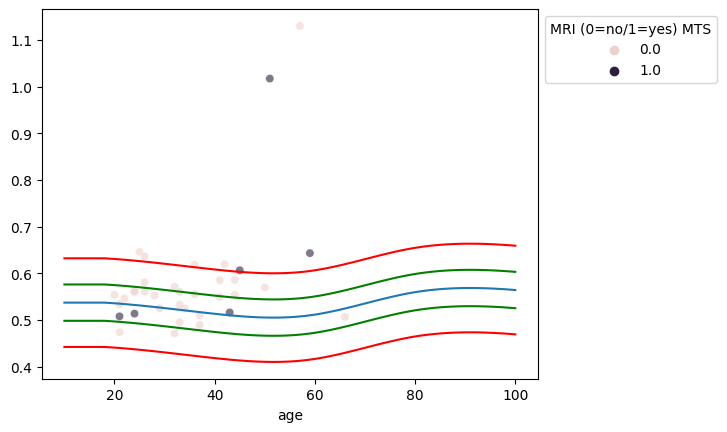

In [383]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[2].age,y=myelin_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[2]['MRI (0=no/1=yes) MTS'],alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],myelin_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], myelin_yhat, label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


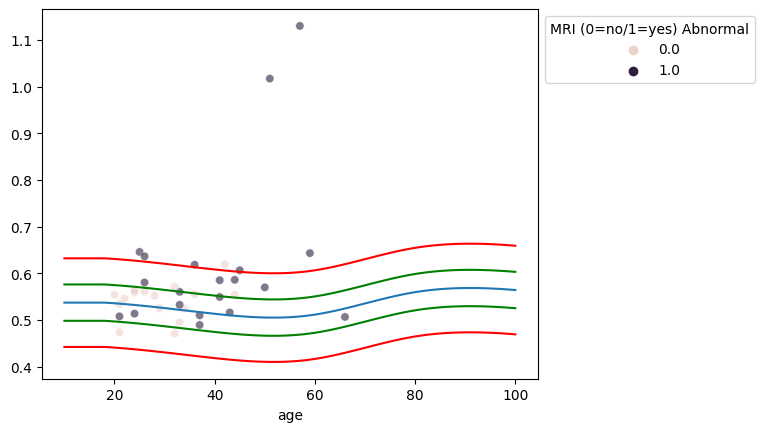

In [384]:
fig, ax = plt.subplots()
sns.scatterplot(x=snsx_epi_dfs_clinical[2].age,y=myelin_epi_combat['data'].mean(axis=0),hue=snsx_epi_dfs_clinical[2]['MRI (0=no/1=yes) Abnormal'],alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(model,[.75,.95],myelin_combat_snsx['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], myelin_yhat, label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

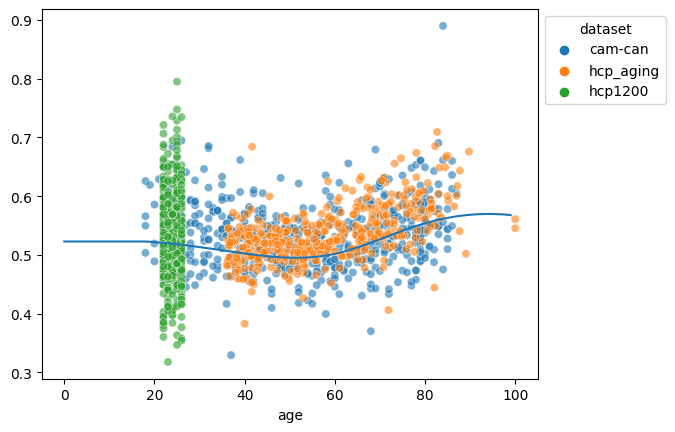

In [342]:
fig, ax = plt.subplots()
sns.scatterplot(x=cov_data[3].age,y=myelin_combat['data'].mean(axis=0),hue=cov_data[3].dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.plot(X_test2[:,0], yhat)


In [80]:
myelin_data, myelin_models, myelin_yhat = modelLR(myelin_combat_df,myelin_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [82]:
snsx_myelin_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[2], snsx_myelin_epi_combat['data'], myelin_data, myelin_models, myelin_std)
snsx_myelin_epi_deviations = compute_deviations(snsx_epi_dfs_clinical[2], snsx_myelin_epi_combat['data'], myelin_data, myelin_models)

<AxesSubplot: xlabel='age'>

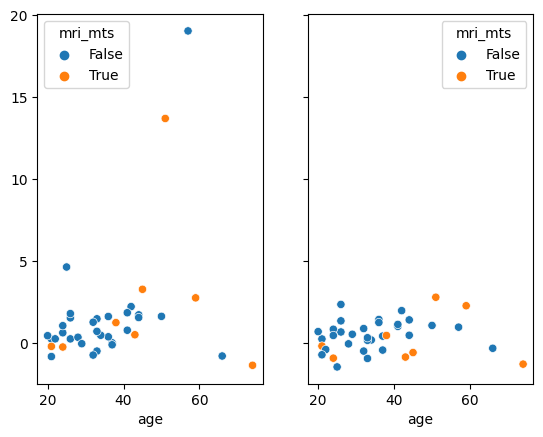

In [86]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_epi_dfs_clinical[2].age, y = snsx_myelin_epi_zscore[0], hue =  snsx_epi_dfs_clinical[2]['mri_mts'].astype(bool),ax=ax[0])
sns.scatterplot(x = snsx_epi_dfs_clinical[2].age, y = snsx_myelin_epi_zscore[1], hue =  snsx_epi_dfs_clinical[2]['mri_mts'].astype(bool),ax=ax[1])


<AxesSubplot: xlabel='age'>

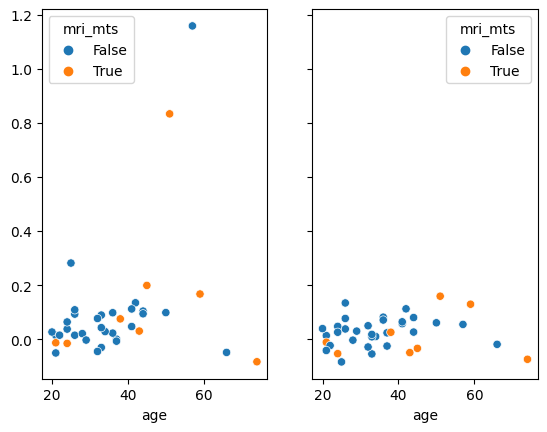

In [84]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_epi_dfs_clinical[2].age, y = snsx_myelin_epi_deviations[0], hue =  snsx_epi_dfs_clinical[2]['mri_mts'].astype(bool),ax=ax[0])
sns.scatterplot(x = snsx_epi_dfs_clinical[2].age, y = snsx_myelin_epi_deviations[1], hue =  snsx_epi_dfs_clinical[2]['mri_mts'].astype(bool),ax=ax[1])


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

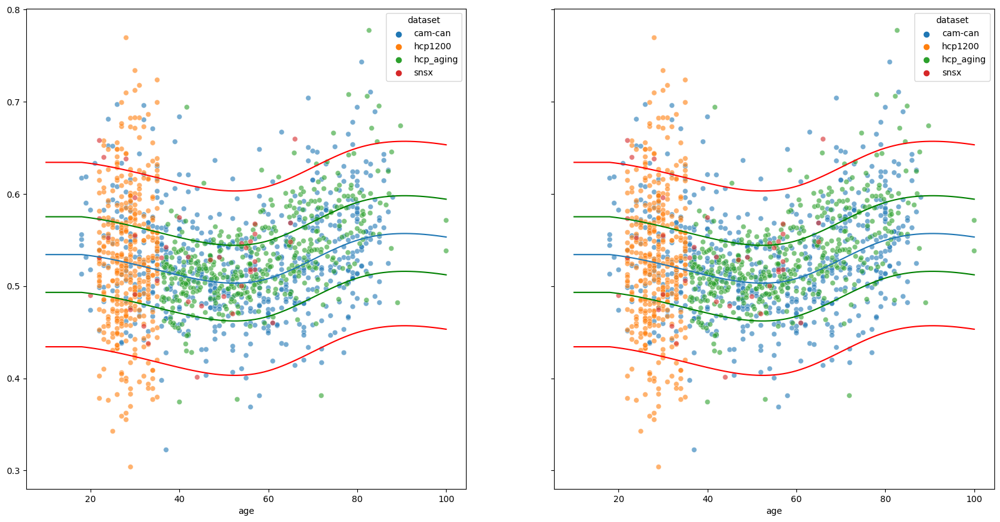

In [577]:
nm_plot_hemi(myelin_combat_snsx_df, myelin_data, myelin_models, 'dataset')

In [102]:
fa_data, fa_models, fa_yhat = modelLR(fa_combat_df,fa_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [108]:
fa_yhat

AttributeError: 'tuple' object has no attribute 'shape'

In [109]:
fa_model = clone(bspline_bayesianridge_model)
fa_model.fit(fa_combat_df[['age','sex_code']],fa_combat['data'].mean(axis=0))
fa_avg_yhat = fa_model.predict(X_test2)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


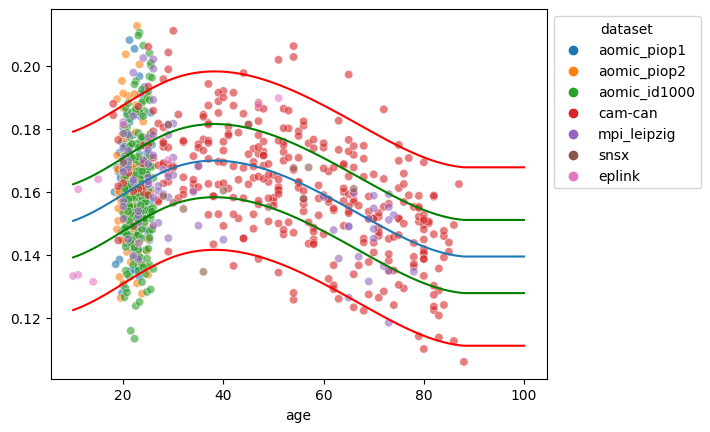

In [110]:
fig, ax = plt.subplots()
sns.scatterplot(x=fa_combat_df.age,y=fa_combat['data'].mean(axis=0),hue=fa_combat_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(fa_model,[.75,.95],fa_combat['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/seaborn/_core.py:927: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  plot_data = pd.DataFrame(plot_data)


ValueError: cannot reindex on an axis with duplicate labels

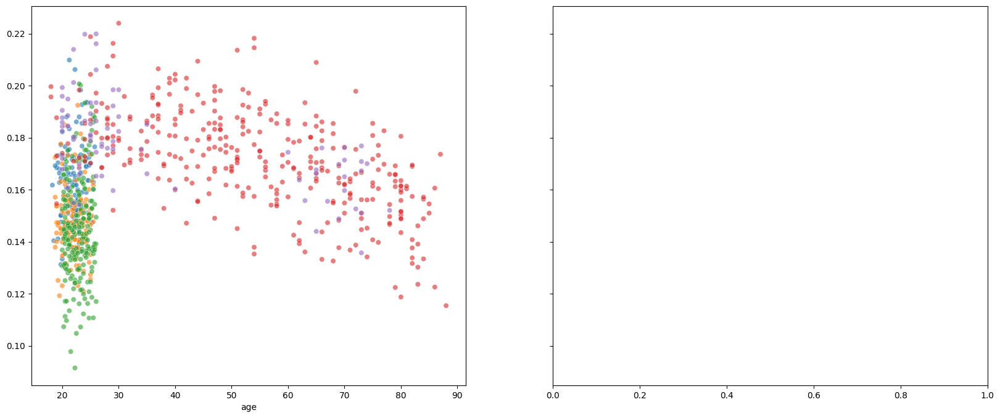

In [100]:
fig, ax = plt.subplots(1,2,figsize=(20,8),sharey=True)
sns.scatterplot(x=cov_data[3].age,y=resp_data[3],hue=cov_data[3].dataset,alpha=0.6,ax=ax[0])
ax[0].legend([],[], frameon=False)
sns.scatterplot(x=fa_combat_df.age,y=fa_combat['data'].mean(axis=0),hue=fa_combat_snsx_df.dataset,alpha=0.6,ax=ax[1])
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))
ax[1].plot(X_test2[:,0], fa_yhat)
plt.tight_layout()

In [91]:
snsx_fa_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[3], snsx_fa_disease_ctrl_combat['data'], fa_data, fa_models, fa_std)
snsx_fa_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[3], snsx_fa_epi_combat['data'], fa_data, fa_models, fa_std)
eplink_fa_possibleTLE_zscore = compute_zscores(eplink_possibleTLE_dfs[2], eplink_fa_possibleTLE_combat['data'], fa_data, fa_models, fa_std)

In [92]:
snsx_fa_disease_ctrl_deviations = compute_deviations(snsx_disease_ctrl_dfs[3], snsx_fa_disease_ctrl_combat['data'], fa_data, fa_models)
snsx_fa_epi_deviations = compute_deviations(snsx_epi_dfs_clinical[3], snsx_fa_epi_combat['data'], fa_data, fa_models)
eplink_fa_possibleTLE_deviations = compute_deviations(eplink_possibleTLE_dfs[2], eplink_fa_possibleTLE_combat['data'], fa_data, fa_models)

In [93]:
snsx_fa_epi_zscore

[array([-3.60300399, 11.37551298, -0.07786711,  1.29590528,  1.3834784 ,
        -0.37304078,  2.27915289,  1.52518717, -0.69752552, -4.08922591,
         0.32642139, -3.6884512 , -2.17757512,  0.98065274, -5.90075436,
        -7.84641706, -0.72571494,  0.25253702, -1.91902576]),
 array([-4.85348236, 14.58022797, -0.59965262,  0.543245  ,  0.26619673,
        -0.32434449, -0.63446872,  0.827877  , -0.38135562, -0.34222568,
         0.62895673,  1.43591925, -0.4121654 , -0.06039733,  0.56907797,
        -2.06384324,  0.14617853, -0.46720493, -1.19936287])]

<AxesSubplot: xlabel='age'>

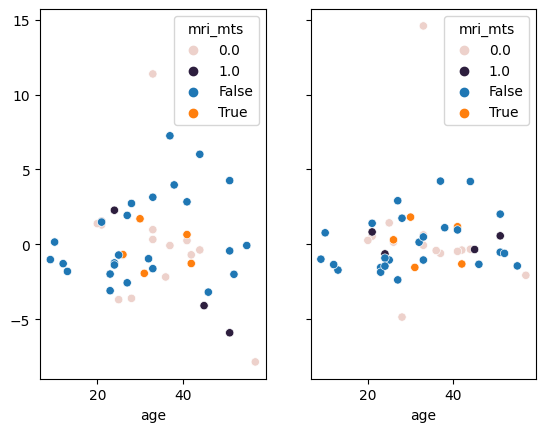

In [94]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_epi_dfs_clinical[3].age, y = snsx_fa_epi_zscore[0], hue =  snsx_epi_dfs_clinical[3]['mri_mts'],ax=ax[0])
sns.scatterplot(x = snsx_epi_dfs_clinical[3].age, y = snsx_fa_epi_zscore[1], hue =  snsx_epi_dfs_clinical[3]['mri_mts'],ax=ax[1])

sns.scatterplot(x = eplink_possibleTLE_dfs[2].age, y = eplink_fa_possibleTLE_zscore[0], hue =  eplink_possibleTLE_dfs[2]['mri_mts'],ax=ax[0])
sns.scatterplot(x = eplink_possibleTLE_dfs[2].age, y = eplink_fa_possibleTLE_zscore[1], hue =  eplink_possibleTLE_dfs[2]['mri_mts'],ax=ax[1])

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

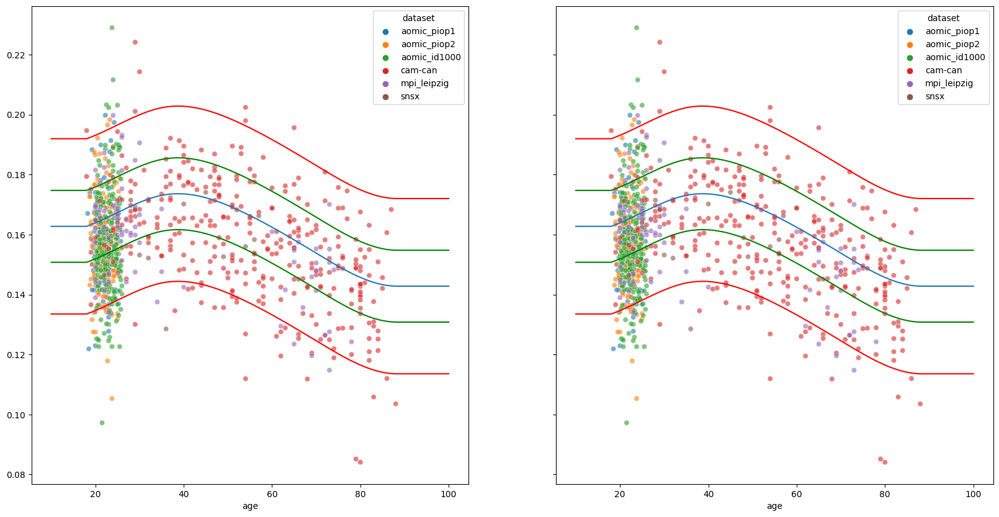

In [579]:
nm_plot_hemi(fa_combat_snsx_df, fa_data, fa_models, 'dataset')

In [421]:
fa_epi_combat['data'].mean(axis=1).shape

(838,)

In [424]:
snsx_epi_dfs_clinical[3].shape

(19, 89)

In [452]:
split_data_wholehipp = lambda data: [hemi for hemi in np.split(data,2)]

In [431]:
fa_epi_combat['data']

array([[-0.01324159,  0.14078776,  0.15849713, ...,  0.12445626,
         0.13471651,  0.18219557],
       [ 0.0536881 ,  0.34826182,  0.12643463, ...,  0.08393859,
         0.0817311 ,  0.06510712],
       [ 0.25161136,  0.60630451,  0.15788738, ...,  0.29469088,
         0.29799985,  0.17905417],
       ...,
       [ 0.06459129,  0.34403547,  0.16810919, ...,  0.11503378,
         0.14062448,  0.11756653],
       [-0.00265449,  0.30845413,  0.0899916 , ...,  0.11586671,
         0.12649877,  0.08149794],
       [-0.00652208,  0.28206966,  0.0828979 , ...,  0.10924919,
         0.09134712,  0.06247956]])

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

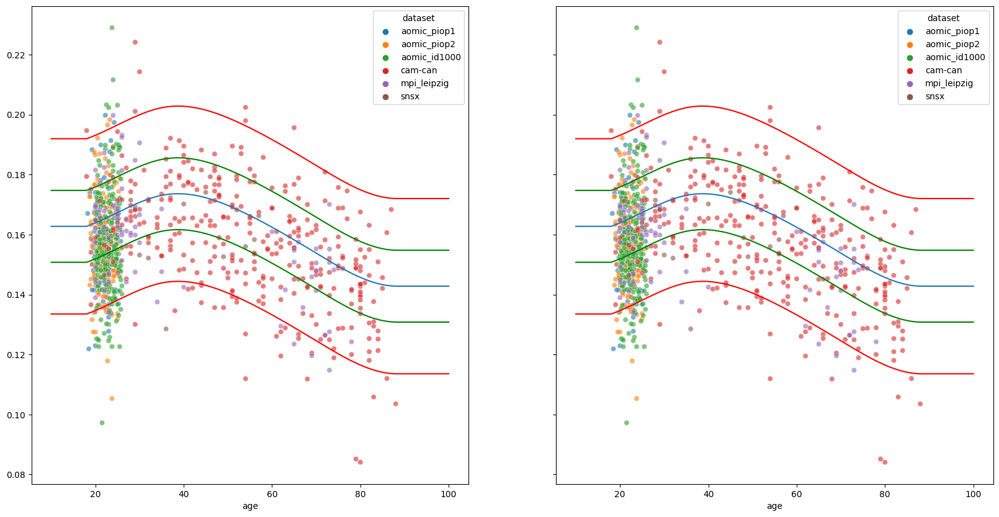

In [580]:
nm_plot_hemi(fa_combat_snsx_df, fa_data, fa_models, 'dataset')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

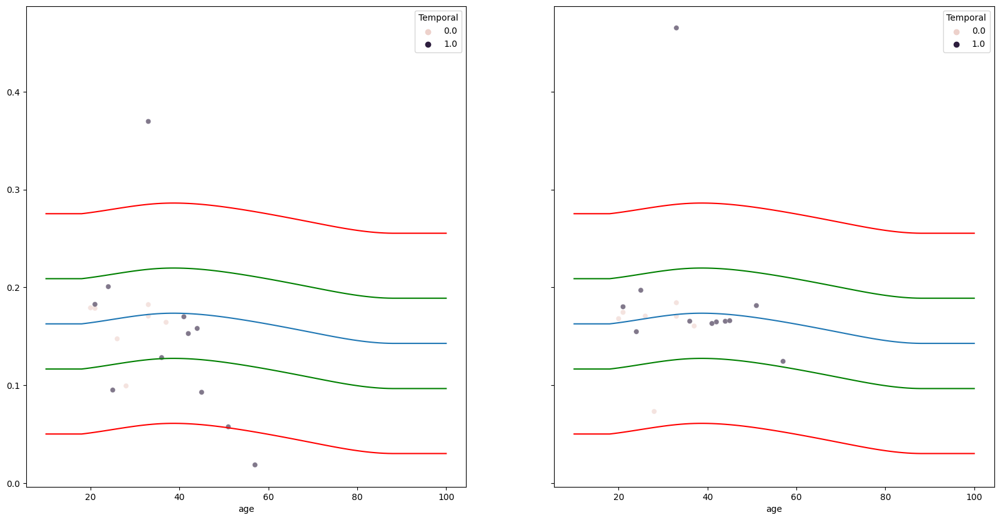

In [588]:
nm_plot_hemi(snsx_epi_dfs_clinical[3], split_data_wholehipp(fa_epi_combat['data']), fa_models, 'Temporal')

In [ ]:
snsx_epi_dfs_clinical[3]['MRI (0=no/1=yes) MTS

In [456]:
snsx_epi_dfs_clinical[3].Temporal ==1

0     0.0
1     1.0
2     0.0
3     0.0
4     0.0
5     1.0
6     1.0
7     1.0
8     1.0
9     1.0
10    0.0
11    1.0
12    1.0
13    0.0
14    1.0
15    1.0
16    0.0
17    1.0
18    NaN
Name: Temporal, dtype: float64

In [465]:
list((snsx_epi_dfs_clinical[3].Temporal ==1).index)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

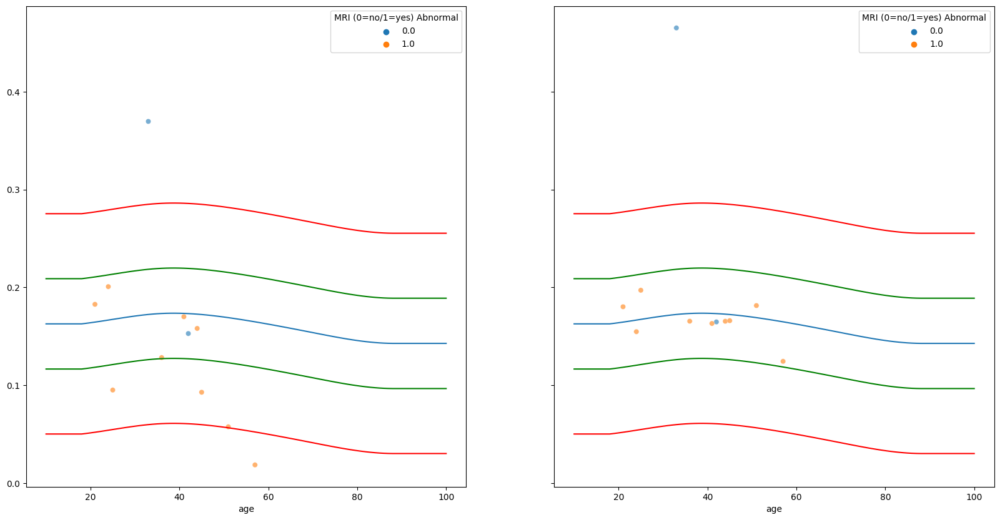

In [589]:
nm_plot_hemi(snsx_epi_dfs_clinical[3], split_data_wholehipp(fa_epi_combat['data']), fa_models, 'MRI (0=no/1=yes) Abnormal',filter_dict={'Temporal':1})

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

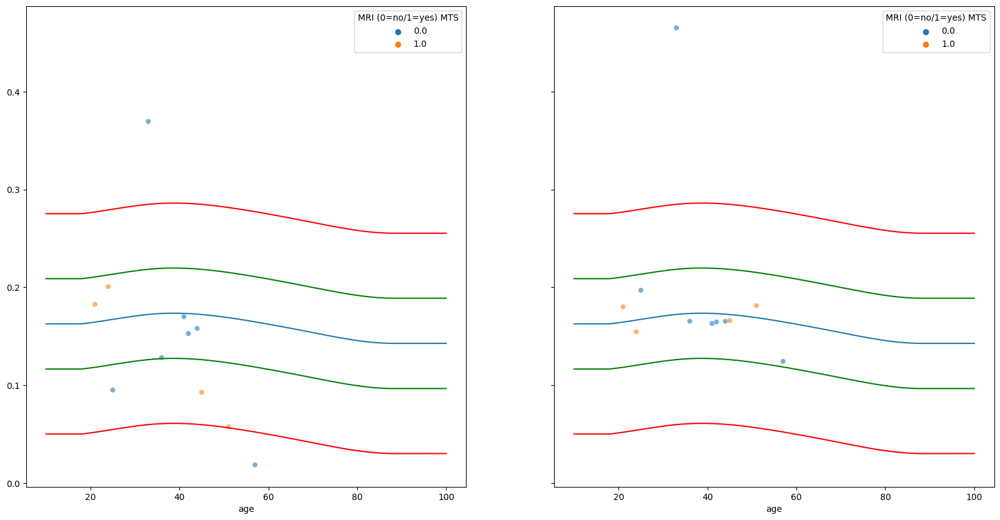

In [590]:
nm_plot_hemi(snsx_epi_dfs_clinical[3], split_data_wholehipp(fa_epi_combat['data']), fa_models, 'MRI (0=no/1=yes) MTS',filter_dict={'Temporal':1})

In [ ]:
fa_model = clone(bspline_bayesianridge_model)
fa_model.fit(fa_combat_df[['age','sex_code']],fa_combat['data'].mean(axis=0))
fa_avg_yhat = fa_model.predict(X_test2)

In [130]:
md_data, md_models, md_yhat = modelLR(md_combat_df,md_combat)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


In [129]:
md_model = clone(bspline_bayesianridge_model)
md_model.fit(md_combat_df[['age','sex_code']],md_combat['data'].mean(axis=0))
md_avg_yhat = md_model.predict(X_test2)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


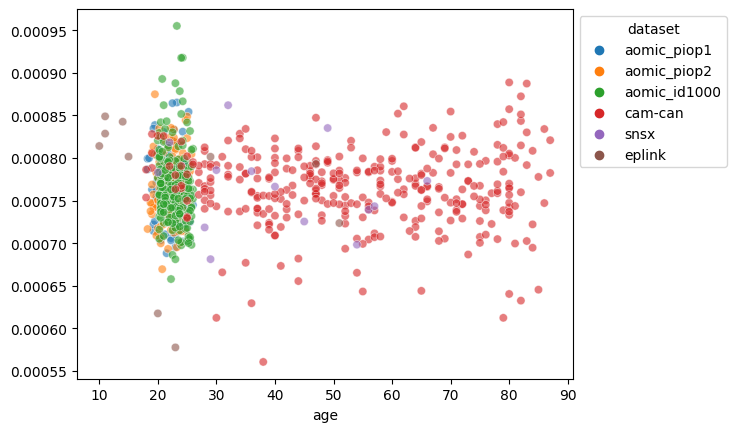

In [194]:
fig, ax = plt.subplots()
sns.scatterplot(x=md_combat_df.age,y=md_combat['data'].mean(axis=0),hue=md_combat_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


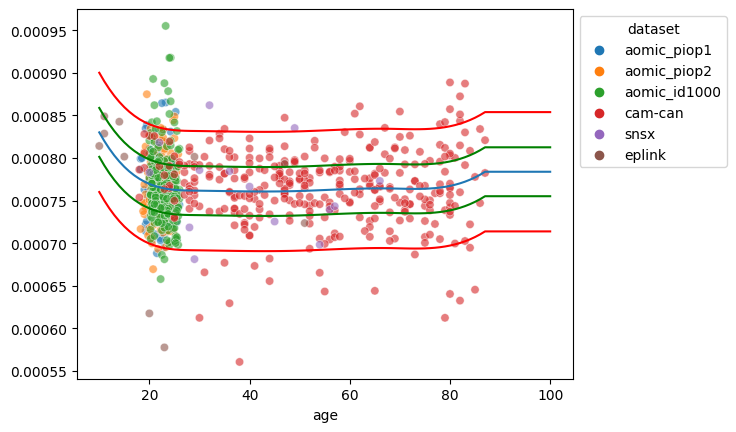

In [112]:
fig, ax = plt.subplots()
sns.scatterplot(x=md_combat_df.age,y=md_combat['data'].mean(axis=0),hue=md_combat_df.dataset,alpha=0.6,ax=ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
pred_test, cent_test = compute_centiles(md_model,[.75,.95],md_combat['data'].mean(axis=0).std(ddof=1),X=X_test2)
ax.plot(X_test2[:,0], pred_test[0],label='mean predicted')
centiles = [.75,.95]
color_list= ['green','red']
for idx, c in enumerate(cent_test):
    ax.plot(X_test2[:,0], c[0],color=color_list[idx],label=f'{1-centiles[idx]}')
    ax.plot(X_test2[:,0], c[1],color=color_list[idx],label=f'{centiles[idx]}')

In [138]:
snsx_md_disease_ctrl_zscore = compute_zscores(snsx_disease_ctrl_dfs[4], snsx_md_disease_ctrl_combat['data'], md_data, md_models, md_std)
snsx_md_epi_zscore = compute_zscores(snsx_epi_dfs_clinical[4], snsx_md_epi_combat['data'], md_data, md_models, md_std)
eplink_md_epi_zscore = compute_zscores(eplink_possibleTLE_dfs[3], eplink_md_possibleTLE_combat['data'], md_data, md_models, md_std)

<AxesSubplot: xlabel='age'>

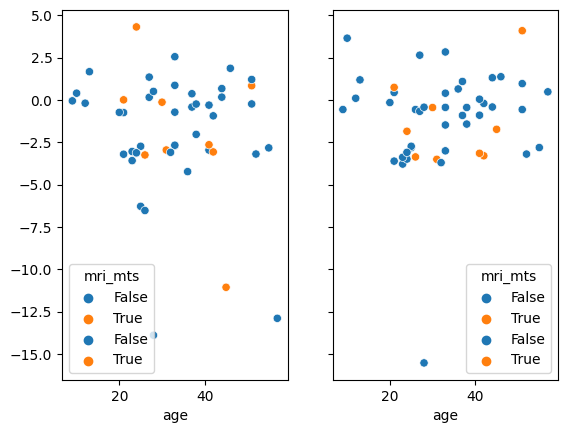

In [133]:
fig, ax = plt.subplots(1,2, sharey=True)
sns.scatterplot(x = snsx_epi_dfs_clinical[4].age, y = snsx_md_epi_zscore[0], hue =  snsx_epi_dfs_clinical[4]['mri_mts'],ax=ax[0])
sns.scatterplot(x = snsx_epi_dfs_clinical[4].age, y = snsx_md_epi_zscore[1], hue =  snsx_epi_dfs_clinical[4]['mri_mts'],ax=ax[1])

sns.scatterplot(x = eplink_possibleTLE_dfs[3].age, y = eplink_md_epi_zscore[0], hue =  eplink_possibleTLE_dfs[3]['mri_mts'],ax=ax[0])
sns.scatterplot(x = eplink_possibleTLE_dfs[3].age, y = eplink_md_epi_zscore[1], hue =  eplink_possibleTLE_dfs[3]['mri_mts'],ax=ax[1])

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

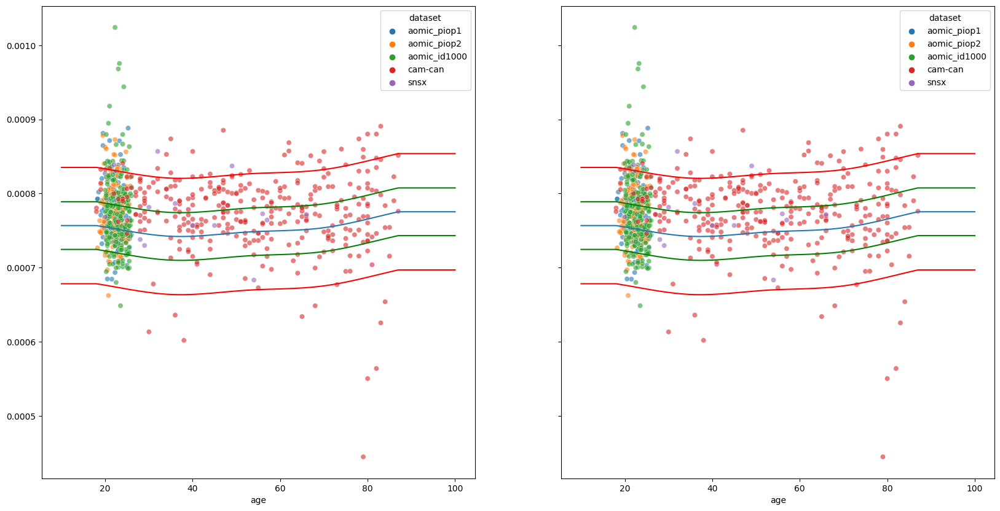

In [584]:
nm_plot_hemi(md_combat_snsx_df, md_data, md_models, 'dataset')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

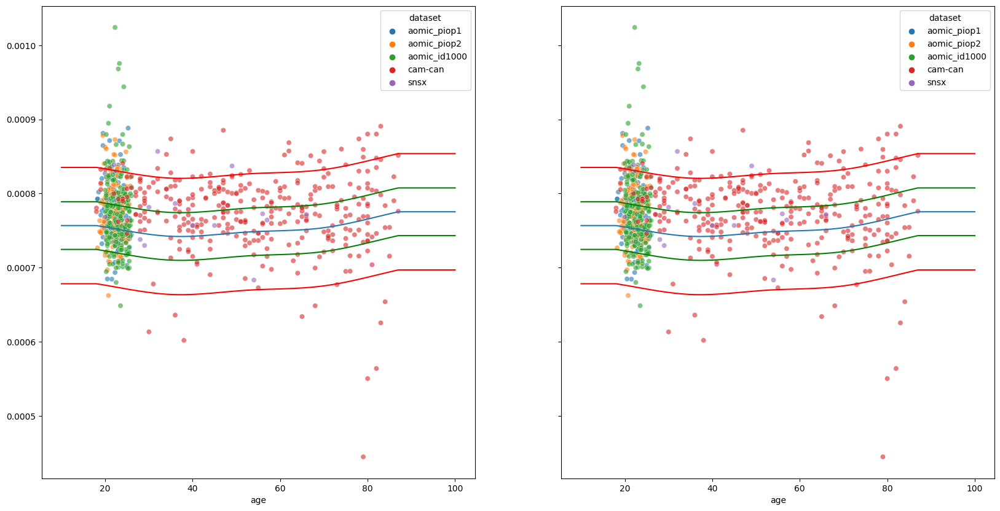

In [405]:
nm_plot_hemi(md_combat_snsx_df, md_data, md_models, 'dataset')

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

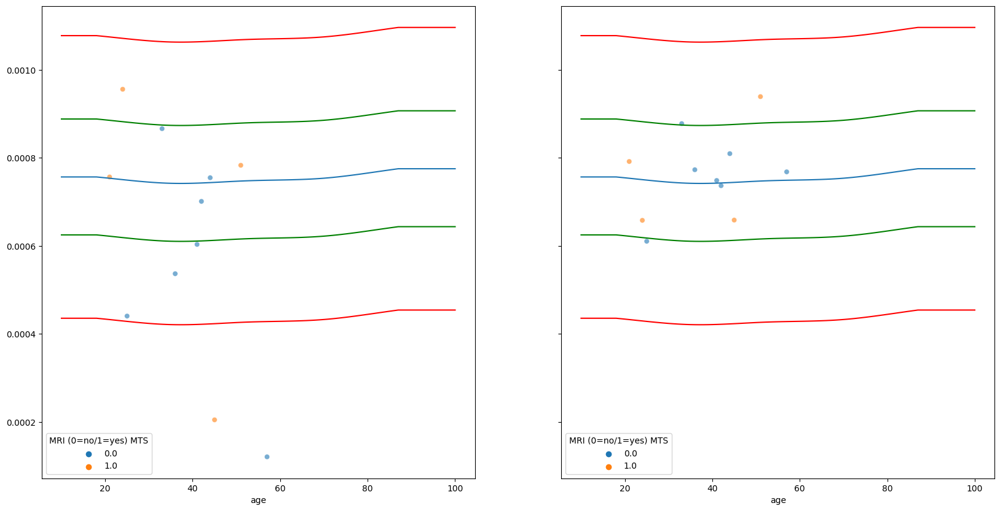

In [600]:
nm_plot_hemi(snsx_epi_dfs_clinical[4], split_data_wholehipp(md_epi_combat['data']), md_models,'MRI (0=no/1=yes) MTS', filter_dict={'Temporal':1})

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but SplineTransformer was fitted with feature names
  warnings.warn(


(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='age'>, <AxesSubplot: xlabel='age'>],
       dtype=object))

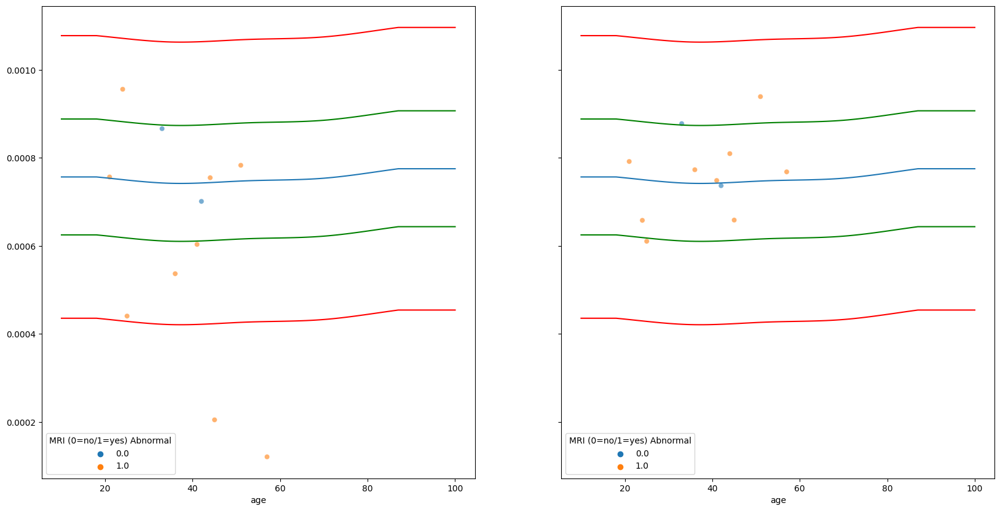

In [601]:
nm_plot_hemi(snsx_epi_dfs_clinical[4], split_data_wholehipp(md_epi_combat['data']), md_models,'MRI (0=no/1=yes) Abnormal', filter_dict={'Temporal':1})

In [124]:
eplink_nonTLE_dfs[0][['mesial_temporal_lobe_epilepsy',
       'temporal_lobe_epilepsy','frontal_lobe_epilepsy',
       'occipital_lobe_epilepsy', 'parietal_lobe_epilepsy',
       'unknown_localization_focal_epilepsy']].shape

(14, 6)

In [532]:
for df in snsx_epi_dfs_clinical:   
    df['mri_mts'] = df['MRI (0=no/1=yes) MTS']
    df['mri_mts_localization'] = (df[['Left','Right ', 'Bilobal']]*[1,2,3]).sum(axis=1,min_count=1)*df['mri_mts']
    df['TLE'] = df['Temporal']
    

In [531]:
for idx, df in enumerate(eplink_possibleTLE_dfs):
    eplink_mri_mts = df[['mri_1.5T_mts','mri_3T_mts']].replace('Yes',1).replace('No',0).sum(axis=1,min_count=1)
    eplink_mri_mts_localization = df[['mri_1.5T_mts_location','mri_3T_mts_location']].replace('Left',1).replace('Right',2).replace('Bilateral',3).sum(axis=1,min_count=1)
    df['mri_mts_localization'] = eplink_mri_mts_localization.multiply(eplink_mri_mts,fill_value=0)
    df['mri_mts'] = eplink_mri_mts
    df['TLE'] = df['temporal_lobe_epilepsy'].replace('Probable',1).replace('Definite',1).replace('Possible',0)

In [135]:
eplink_possibleTLE_dfs[0].mri_mts_localization.value_counts()

0.0    18
1.0     4
3.0     2
2.0     1
Name: mri_mts_localization, dtype: int64

In [530]:
eplink_possibleTLE_dfs[0].head()

,participant_id,age,sex,handedness,focal_seizures,generalized_seizures,mesial_temporal_lobe_epilepsy,temporal_lobe_epilepsy,frontal_lobe_epilepsy,occipital_lobe_epilepsy,...,hippocampal_pathology_details,neocortical_pathology_details,paths,site_code,sex_code,mri_mts,sex_codes,site,dataset,pass
0,sub-HSC0002,13.0,Female,Right,Checked,Unchecked,No,Possible,Possible,NaN,...,NaN,NaN,/home/ROBARTS/myousif/graham/scratch/norm_mode...,27.0,0,False,0,eplink,eplink,True
1,sub-HSC0006,10.0,Male,Right,Checked,Checked,No,Possible,No,Possible,...,NaN,Pathology demonstrated diffuse low grade astro...,/home/ROBARTS/myousif/graham/scratch/norm_mode...,27.0,1,False,1,eplink,eplink,True
2,sub-HSC0009,9.0,Female,Right,Checked,Unchecked,No,Probable,No,No,...,NaN,NaN,/home/ROBARTS/myousif/graham/scratch/norm_mode...,27.0,0,False,0,eplink,eplink,True
3,sub-HSC0016,17.0,Female,Right,Checked,Unchecked,No,Probable,Probable,No,...,NaN,NaN,/home/ROBARTS/myousif/graham/scratch/norm_mode...,27.0,0,False,0,eplink,eplink,True
4,sub-HSC0026,14.0,Female,Right,Checked,Unchecked,Possible,Possible,No,No,...,NaN,NaN,/home/ROBARTS/myousif/graham/scratch/norm_mode...,27.0,0,False,0,eplink,eplink,True


In [548]:
split_mean_metric = lambda combat_data: [split_data_wholehipp(combat_data['data'])[i].mean(axis=0) for i in range(2)]

In [550]:
columns2keep = ['participant_id','age','sex','site','dataset','TLE','mri_mts','mri_mts_localization']

z_score_metrics_list = [[snsx_thick_epi_zscore, eplink_thick_TLE_zscore],
                        [snsx_gyr_epi_zscore, eplink_gyr_possibleTLE_zscore],
                        [snsx_myelin_epi_zscore],
                        [snsx_fa_epi_zscore, eplink_fa_possibleTLE_zscore],
                        [snsx_md_epi_zscore, eplink_md_possibleTLE_zscore]]
raw_metric_list = [[split_mean_metric(snsx_thick_epi_combat),split_mean_metric(eplink_thick_possibleTLE_combat)],
                 [split_mean_metric(snsx_gyr_epi_combat), split_mean_metric(eplink_gyr_possibleTLE_combat)],
                 [split_mean_metric(snsx_myelin_epi_combat)],
                 [split_mean_metric(snsx_fa_epi_combat),split_mean_metric(eplink_fa_possibleTLE_combat)],
                 [split_mean_metric(snsx_md_epi_combat),split_mean_metric(eplink_md_possibleTLE_combat)]
                ]

metric_dfs_list = [[snsx_epi_dfs_clinical[0],eplink_possibleTLE_dfs[0]],
                   [snsx_epi_dfs_clinical[1],eplink_possibleTLE_dfs[1]],
                   [snsx_epi_dfs_clinical[2]],
                   [snsx_epi_dfs_clinical[3],eplink_possibleTLE_dfs[2]],
                   [snsx_epi_dfs_clinical[4],eplink_possibleTLE_dfs[3]]]

metric_dfs_list_concat = [ pd.concat([ df[columns2keep] for df in df_list ]) for df_list in metric_dfs_list]
                   

In [534]:
metric_dfs_list_concat[2].head()


,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization
0,sub-P008,26.0,f,snsx,snsx,1.0,0.0,0.0
1,sub-P012,28.0,m,snsx,snsx,0.0,0.0,0.0
2,sub-P013,37.0,f,snsx,snsx,1.0,0.0,0.0
3,sub-P014,33.0,m,snsx,snsx,1.0,0.0,0.0
4,sub-P018,29.0,f,snsx,snsx,0.0,0.0,0.0


In [551]:
z_score_concatL = {}
z_score_concatR = {}
metric_names = ['thick','gyr','myelin','fa','md']

for met_idx, met in enumerate(z_score_metrics_list):
    metL = []
    metR = []
    for dset in met:
        metL.append(dset[0])
        metR.append(dset[1])
    z_score_concatL[metric_names[met_idx]] = np.concatenate(metL)
    z_score_concatR[metric_names[met_idx]] = np.concatenate(metR)
    

In [553]:
metric_concatL = {}
metric_concatR = {}
metric_names = ['thick','gyr','myelin','fa','md']

for met_idx, met in enumerate(raw_metric_list):
    metL = []
    metR = []
    for dset in met:
        metL.append(dset[0])
        metR.append(dset[1])
    metric_concatL[metric_names[met_idx]] = np.concatenate(metL)
    metric_concatR[metric_names[met_idx]] = np.concatenate(metR)

In [349]:
snsx_epi_dfs_clinical

[   participant_id   age sex diagnosis handedness  site dataset  \
 0        sub-P008  26.0   f  Epilepsy      right  snsx    snsx   
 1        sub-P012  28.0   m  Epilepsy      right  snsx    snsx   
 2        sub-P013  37.0   f  Epilepsy      right  snsx    snsx   
 3        sub-P014  33.0   m  Epilepsy      right  snsx    snsx   
 4        sub-P015  19.0   f  Epilepsy       left  snsx    snsx   
 5        sub-P018  29.0   f  Epilepsy       left  snsx    snsx   
 6        sub-P020  37.0   f  Epilepsy      right  snsx    snsx   
 7        sub-P021  32.0   f  Epilepsy      right  snsx    snsx   
 8        sub-P022  21.0   f  Epilepsy      right  snsx    snsx   
 9        sub-P026  36.0   f  Epilepsy      right  snsx    snsx   
 10       sub-P028  20.0   f  Epilepsy       left  snsx    snsx   
 11       sub-P029  40.0   m  Epilepsy      right  snsx    snsx   
 12       sub-P031  44.0   f  Epilepsy      right  snsx    snsx   
 13       sub-P032  24.0   m  Epilepsy      right  snsx    sns

In [558]:
z_score_dfs = [pd.DataFrame(columns=['metric','z-score']), pd.DataFrame(columns=['metric','z-score'])]

for idx, metric_key in enumerate(z_score_concatL.keys()):
    metL, metR = z_score_concatL[metric_key],z_score_concatR[metric_key]

    
    met_arr = [metric_key]*len(metL)
    
    hemiL = pd.DataFrame({'metric':met_arr,
                          'z-score':metL})
    hemiR = pd.DataFrame({'metric':met_arr,
                          'z-score':metR})
    
    z_score_dfs[0] = pd.concat([z_score_dfs[0], hemiL])
    z_score_dfs[1] = pd.concat([z_score_dfs[1], hemiR])

In [580]:
raw_metric_dfs = [pd.DataFrame(columns=['metric','raw_value']), pd.DataFrame(columns=['metric','raw_value'])]

for idx, metric_key in enumerate(metric_concatL.keys()):
    metL, metR = metric_concatL[metric_key],metric_concatR[metric_key]

    
    met_arr = [metric_key]*len(metL)
    
    hemiL = pd.DataFrame({'metric':met_arr,
                          'raw_value':metL})
    hemiR = pd.DataFrame({'metric':met_arr,
                          'raw_value':metR})
    
    raw_metric_dfs[0] = pd.concat([raw_metric_dfs[0], hemiL])
    raw_metric_dfs[1] = pd.concat([raw_metric_dfs[1], hemiR])

[Text(0, 0, '11'), Text(0, 0, '25')]

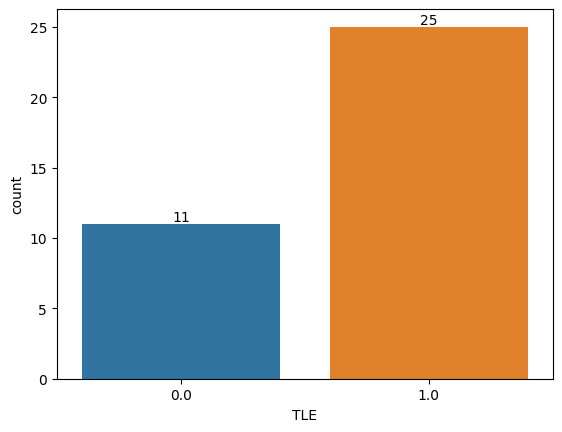

In [193]:

ax = sns.countplot(data = metric_dfs_list_concat[3],x='TLE')
ax.bar_label(ax.containers[0])

In [560]:
pd.concat(metric_dfs_list_concat).reset_index(drop=True)

,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization
0,sub-P008,26.0,f,snsx,snsx,1.0,0.0,0.0
1,sub-P012,28.0,m,snsx,snsx,0.0,0.0,0.0
2,sub-P013,37.0,f,snsx,snsx,1.0,0.0,0.0
3,sub-P014,33.0,m,snsx,snsx,1.0,0.0,0.0
4,sub-P015,19.0,f,snsx,snsx,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
338,sub-TWH0042,44.0,Male,eplink,eplink,NaN,NaN,NaN
339,sub-TWH0050,27.0,Male,eplink,eplink,NaN,NaN,NaN
340,sub-TWH0052,28.0,Female,eplink,eplink,NaN,NaN,NaN
341,sub-TWH0054,37.0,Female,eplink,eplink,1.0,NaN,NaN


In [574]:
raw_metric_dfs[0]

,metric,z-score
0,thick,1.312794
1,thick,1.490842
2,thick,1.373383
3,thick,1.478517
4,thick,1.377424
...,...,...
44,md,0.000777
45,md,0.000754
46,md,0.000776
47,md,0.000728


In [606]:
epi_zscore_hemiL_df = pd.concat([pd.concat(metric_dfs_list_concat).reset_index(drop=True),z_score_dfs[0].reset_index(drop=True),raw_metric_dfs[0]['raw_value'].reset_index(drop=True)],axis=1)
epi_zscore_hemiR_df = pd.concat([pd.concat(metric_dfs_list_concat).reset_index(drop=True),z_score_dfs[1].reset_index(drop=True),raw_metric_dfs[1]['raw_value'].reset_index(drop=True)],axis=1)

In [607]:
epi_zscore_hemiR_df['hemi']='R'
epi_zscore_hemiL_df['hemi']='L'

In [608]:
epi_zscore_hemiR_df.sex = epi_zscore_hemiR_df.sex.replace('Female','F').replace('Male','M').str.upper()
epi_zscore_hemiL_df.sex = epi_zscore_hemiL_df.sex.replace('Female','F').replace('Male','M').str.upper()

In [609]:
epi_zscore_df = pd.concat([epi_zscore_hemiL_df,epi_zscore_hemiR_df])

In [610]:
def ipsilateral(df, hemi_col, lat_col):
    hemi = df[hemi_col]
    lat = df[lat_col]
    
    new_col = []
    for idx, hemi_indiv in enumerate(hemi):
        lat_indiv = lat.iloc[idx]
        
        if (lat_indiv == 0):
            new_col.append(0)
        elif (lat_indiv == 3):
            new_col.append(1)
        elif (lat_indiv == 1):
            if hemi_indiv == 'L':
                new_col.append(1)
            else:
                new_col.append(0)
        elif (lat_indiv == 2):
            if hemi_indiv == 'R':
                new_col.append(1)
            else:
                new_col.append(0)
        else:
            new_col.append(np.nan)
    
    return new_col

    

In [611]:
epi_zscore_df['ipsi_mts'] = ipsilateral(epi_zscore_df,'hemi','mri_mts_localization')

In [623]:
(epi_zscore_df['TLE'] != 0).replace(False,0).replace(True,np.nan)

0.0    182
Name: TLE, dtype: int64

In [628]:
epi_zscore_df['ipsi_mts_nontle'] = (epi_zscore_df['TLE'] != 0).replace(False,0).replace(True,np.nan)
epi_zscore_df['ipsi_mts_nontle'] = epi_zscore_df[['ipsi_mts','ipsi_mts_nontle']].sum(axis=1,min_count=1)

In [600]:
epi_zscore_hemiR_df

,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization,metric,z-score,raw_value,hemi,ipsi_mts,ipsi_mts_nontle
0,sub-P008,26.0,F,snsx,snsx,1.0,0.0,0.0,thick,-1.137848,1.312794,L,0.0,0.0
1,sub-P012,28.0,M,snsx,snsx,0.0,0.0,0.0,thick,1.375994,1.490842,L,0.0,0.0
2,sub-P013,37.0,F,snsx,snsx,1.0,0.0,0.0,thick,-0.091605,1.373383,L,0.0,0.0
3,sub-P014,33.0,M,snsx,snsx,1.0,0.0,0.0,thick,1.081537,1.478517,L,0.0,0.0
4,sub-P015,19.0,F,snsx,snsx,0.0,0.0,0.0,thick,0.176774,1.377424,L,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338,sub-TWH0042,44.0,M,eplink,eplink,NaN,NaN,NaN,md,-0.417864,0.000723,R,NaN,NaN
339,sub-TWH0050,27.0,M,eplink,eplink,NaN,NaN,NaN,md,-0.672964,0.000713,R,NaN,NaN
340,sub-TWH0052,28.0,F,eplink,eplink,NaN,NaN,NaN,md,-0.429802,0.000730,R,NaN,NaN
341,sub-TWH0054,37.0,F,eplink,eplink,1.0,NaN,NaN,md,-0.914777,0.000704,R,NaN,NaN


In [562]:

snsx_epi_dfs_clinical_mts_lateralization = [((df['Left'] + df['Right ']*2 + df['Bilobal']*3)*df['mri_mts']).fillna('None').replace(0,'None').replace(1,'Left').replace(2,'Right').replace(3,'Bilateral') for df in snsx_epi_dfs_clinical]

eplink_possibleTLE_dfs_mts_lateralization = [((df['mri_1.5T_mts_location'].replace('Left',1).replace('Right',2).replace('Bilateral',3) + df['mri_3T_mts_location'].replace('Left',1).replace('Right',2).replace('Bilateral',3)).replace(1,'Left').replace(2,'Right').replace(3,'Bilateral')) for df in eplink_possibleTLE_dfs] 



In [563]:
for idx, _ in enumerate(snsx_epi_dfs_clinical):
    snsx_epi_dfs_clinical[idx]['mri_mts_lateralization'] = snsx_epi_dfs_clinical_mts_lateralization[idx]
    snsx_epi_dfs_clinical[idx]['mri_mts_lateralization']

In [564]:

test = (eplink_possibleTLE_dfs[0]['mri_1.5T_mts_location'].replace('Left',1).replace('Right',2).replace('Bilateral',3).fillna(0) + eplink_possibleTLE_dfs[0]['mri_3T_mts_location'].replace('Left',1).replace('Right',2).replace('Bilateral',3).fillna(0))


In [565]:
test.replace(0,'Other').replace(1,'Left').replace(2,'Right').replace(3,'Bilateral')

0     Other
1     Other
2     Other
3     Other
4     Other
      ...  
58    Other
59    Other
60    Other
61    Other
62    Other
Length: 63, dtype: object

In [566]:

test = (eplink_possibleTLE_dfs[0]['mri_1.5T_mts_location'].replace('Left',0).replace('Right',1).replace('Bilateral',2) + eplink_possibleTLE_dfs[0]['mri_3T_mts_location'].replace('Left',0).replace('Right',1).replace('Bilateral',2))


In [567]:
test = eplink_possibleTLE_dfs[0]['mri_1.5T_mts_location'].replace('Left',1).replace('Right',2).replace('Bilateral',3)
test2 = eplink_possibleTLE_dfs[0]['mri_3T_mts_location'].replace('Left',1).replace('Right',2).replace('Bilateral',3)

In [568]:
(test.fillna(0) + test2.fillna(0)).replace(

SyntaxError: unexpected EOF while parsing (2879665764.py, line 1)

In [146]:
eplink_possibleTLE_dfs[0]['mri_1.5T_mts_location'].value_counts()

Left         3
Bilateral    2
Name: mri_1.5T_mts_location, dtype: int64

In [147]:
eplink_possibleTLE_dfs[0]['mri_3T_mts_location'].value_counts()

Left     1
Right    1
Name: mri_3T_mts_location, dtype: int64

In [147]:
eplink_possibleTLE_dfs[0].columns

Index(['participant_id', 'age', 'sex', 'handedness', 'focal_seizures',
       'generalized_seizures', 'mesial_temporal_lobe_epilepsy',
       'temporal_lobe_epilepsy', 'frontal_lobe_epilepsy',
       'occipital_lobe_epilepsy', 'parietal_lobe_epilepsy',
       'unknown_localization_focal_epilepsy', 'pet_abnormality',
       'pet_lateralization_temporal_lobe', 'pet_lateralization_frontal_lobe',
       'pet_lateralization_parietal_lobe', 'pet_lateralization_occipital_lobe',
       'spect_abnormality', 'spect_lateralization_temporal_lobe',
       'spect_lateralization_frontal_lobe',
       'spect_lateralization_parietal_lobe',
       'spect_lateralization_occipital_lobe', 'meg_spike_cluster',
       'mri_1.5T_abnormality', 'mri_1.5T_mts', 'mri_1.5T_mts_location',
       'mri_1.5T_fcd', 'mri_1.5T_fcd_location',
       'mri_1.5T_other_epileptogenic_lesion',
       'mri_1.5T_other_epileptogenic_lesion_location',
       'mri_1.5T_other_nonspecific_findings',
       'mri_1.5T_other_nonspecific_

In [145]:
snsx_epi_dfs_clinical[0][['Left','Right ','Bilobal']]

,Left,Right,Bilobal
0,0.0,1.0,0.0
1,0.0,0.0,0.0
2,0.0,1.0,0.0
3,0.0,0.0,1.0
4,0.0,0.0,0.0
5,1.0,0.0,0.0
6,0.0,0.0,0.0
7,0.0,0.0,1.0
8,1.0,0.0,0.0
9,0.0,1.0,0.0


In [137]:
z_score_concat

{'thick_L': array([-1.13365812e+00,  1.39935170e+00, -6.72226867e-02,  1.11240543e+00,
         1.78080986e-01, -2.33590321e-01,  6.31593457e-01, -5.60875251e-01,
         5.68753938e-01, -9.62789855e-01,  3.68590987e-01, -1.07879782e-01,
        -1.66081329e+00, -2.30469331e+00, -4.46233584e-01, -1.29186118e+00,
        -5.94581713e-01, -5.57300369e-01, -6.88587094e+00, -9.86413891e-01,
        -8.27538649e-01,  5.38232793e-01,  3.38099428e-01,  1.06205383e+00,
        -1.34308541e-01, -1.65835013e+00,  4.04592213e-01,  9.19479915e-01,
        -2.46105208e-01, -2.35117886e+00,  4.59775603e+00,  8.90041843e-01,
         8.96431584e-01,  6.64970329e-01,  7.98015027e-02,  6.88730923e-01,
        -1.36304191e+00, -2.69585155e+00, -1.25287233e+00,  1.74611423e+00,
        -2.18913317e-01, -2.23635807e+00, -2.62182764e+00,  3.22006474e+00,
        -2.22153038e+00,  7.66552534e-01, -1.17292289e+00, -6.16610024e-01,
        -1.34559506e+00, -1.71561973e+00,  5.56127310e-01, -7.52542442e-01,
 

In [569]:
z_score_list = []
label_list = []
hemi_list = []

for key_idx, key in enumerate(z_score_concat.keys()):
    hemi =  key[-1]
    metric = key.replace('_L','').replace('_R','')
    
    for df in metric_dfs_list[key_idx]
    
    

SyntaxError: invalid syntax (2660713510.py, line 9)

In [1092]:
dset

[array([ 2.28381247,  1.46398264,  1.01622829,  0.56044228,  1.8918943 ,
         1.20436446,  1.37388723, -3.01639898, -3.56869108, -2.89171411,
        -3.23653739, -2.72913362, -3.12862034, -3.02921114, -2.5956912 ,
        -3.02167924, -2.57821537, -3.16693454, -3.11081885, -2.83073701,
        -3.19885207, -0.07765257, -0.23432213,  0.93369603, -0.23822085,
         0.71029897,  0.17680797,  0.53972296, -0.33554989, -0.16018041]),
 array([ 1.81068668,  4.72750337,  0.52090656,  0.86288359,  1.39444057,
         0.96034001,  2.66956999, -3.24199501, -3.77161882, -3.44130356,
        -3.35219579, -2.72908234, -3.47941318, -3.37246471, -2.92561425,
        -3.62922735, -3.08253495, -3.57271299, -3.08484984, -2.81305844,
        -3.20158764, -0.39197956, -0.56488896,  0.47028614, -0.83315984,
        -0.37760755, -0.65191462, -0.392885  , -0.82787319, -0.36119596])]

In [1088]:
z_score_concat

{'thick_L': array([-1.13847465e+00,  1.39081085e+00, -6.32114786e-02,  1.10819477e+00,
         1.86668728e-01, -2.38658240e-01,  6.35604665e-01, -5.63243889e-01,
         5.71570340e-01, -9.59865321e-01,  3.74090621e-01, -1.04528468e-01,
        -1.65254027e+00, -2.31079554e+00, -4.43417182e-01, -1.29145312e+00,
        -5.89763816e-01, -5.49632451e-01, -6.88070058e+00, -9.88002084e-01,
        -8.30224239e-01,  5.32117116e-01,  3.37104123e-01,  1.05480504e+00,
        -1.34599360e-01, -1.66316667e+00,  4.03596908e-01,  9.19322265e-01,
        -2.48992079e-01, -2.34808666e+00,  4.59452247e+00,  8.97220391e-01,
         9.03421007e-01,  6.77059338e-01,  7.74328652e-02,  6.83914390e-01,
        -1.36022551e+00, -2.68757853e+00, -1.25575920e+00,  1.75329278e+00,
        -2.13931845e-01, -2.20027541e+00, -2.60469806e+00,  3.22881216e+00,
        -2.20551866e+00,  7.96943878e-01, -1.13068605e+00, -6.11455602e-01,
        -1.34250287e+00, -1.72086419e+00,  5.52027753e-01, -7.48089877e-01,
 

In [1076]:
z_score_metrics_list[0]

[[array([-1.13847465,  1.39081085, -0.06321148,  1.10819477,  0.18666873,
         -0.23865824,  0.63560467, -0.56324389,  0.57157034, -0.95986532,
          0.37409062, -0.10452847, -1.65254027, -2.31079554, -0.44341718,
         -1.29145312, -0.58976382, -0.54963245, -6.88070058, -0.98800208,
         -0.83022424,  0.53211712,  0.33710412,  1.05480504, -0.13459936,
         -1.66316667,  0.40359691,  0.91932226, -0.24899208, -2.34808666,
          4.59452247,  0.89722039,  0.90342101,  0.67705934,  0.07743287,
          0.68391439, -1.36022551, -2.68757853, -1.2557592 ,  1.75329278,
         -0.21393185]),
  array([-1.46465365,  1.93787184, -1.71409172,  0.50230387, -0.72988711,
         -1.23533494,  0.24372851, -0.50503962,  0.73539674, -0.69989463,
         -0.06584077, -0.33715771, -0.90431124,  0.28564507,  0.17007294,
         -0.67619585, -1.5792294 , -1.05653433, -2.3839403 , -1.26580508,
         -0.62116946, -0.04411385,  0.89797772,  2.08097047, -0.34750424,
         -0.95

In [1074]:
z_score_concat

{'thick_L': array([-1.13847465e+00,  1.39081085e+00, -6.32114786e-02,  1.10819477e+00,
         1.86668728e-01, -2.38658240e-01,  6.35604665e-01, -5.63243889e-01,
         5.71570340e-01, -9.59865321e-01,  3.74090621e-01, -1.04528468e-01,
        -1.65254027e+00, -2.31079554e+00, -4.43417182e-01, -1.29145312e+00,
        -5.89763816e-01, -5.49632451e-01, -6.88070058e+00, -9.88002084e-01,
        -8.30224239e-01,  5.32117116e-01,  3.37104123e-01,  1.05480504e+00,
        -1.34599360e-01, -1.66316667e+00,  4.03596908e-01,  9.19322265e-01,
        -2.48992079e-01, -2.34808666e+00,  4.59452247e+00,  8.97220391e-01,
         9.03421007e-01,  6.77059338e-01,  7.74328652e-02,  6.83914390e-01,
        -1.36022551e+00, -2.68757853e+00, -1.25575920e+00,  1.75329278e+00,
        -2.13931845e-01, -2.20027541e+00, -2.60469806e+00,  3.22881216e+00,
        -2.20551866e+00,  7.96943878e-01, -1.13068605e+00, -6.11455602e-01,
        -1.34250287e+00, -1.72086419e+00,  5.52027753e-01, -7.48089877e-01,
 

In [941]:
pd.concat([snsx_epi_dfs_clinical[0].mri_mts, eplink_possibleTLE_dfs[0].mri_mts])

0     False
1     False
2     False
3     False
4     False
      ...  
88    False
90    False
91    False
93    False
94    False
Name: mri_mts, Length: 104, dtype: bool

In [148]:
z_score_concat

NameError: name 'z_score_concat' is not defined

In [123]:
TLE_zscore_df = pd.DataFrame(z_score_concat)

NameError: name 'z_score_concat' is not defined

In [1082]:
TLE_zscore_df['mri_mts'] = pd.concat([snsx_epi_dfs_clinical[0].mri_mts, eplink_possibleTLE_dfs[0].mri_mts]).to_numpy()

In [1083]:
TLE_zscore_df.mri_mts.value_counts()

False    89
True     15
Name: mri_mts, dtype: int64

In [1085]:
z_score_concat

{'thick_L': array([-1.13847465e+00,  1.39081085e+00, -6.32114786e-02,  1.10819477e+00,
         1.86668728e-01, -2.38658240e-01,  6.35604665e-01, -5.63243889e-01,
         5.71570340e-01, -9.59865321e-01,  3.74090621e-01, -1.04528468e-01,
        -1.65254027e+00, -2.31079554e+00, -4.43417182e-01, -1.29145312e+00,
        -5.89763816e-01, -5.49632451e-01, -6.88070058e+00, -9.88002084e-01,
        -8.30224239e-01,  5.32117116e-01,  3.37104123e-01,  1.05480504e+00,
        -1.34599360e-01, -1.66316667e+00,  4.03596908e-01,  9.19322265e-01,
        -2.48992079e-01, -2.34808666e+00,  4.59452247e+00,  8.97220391e-01,
         9.03421007e-01,  6.77059338e-01,  7.74328652e-02,  6.83914390e-01,
        -1.36022551e+00, -2.68757853e+00, -1.25575920e+00,  1.75329278e+00,
        -2.13931845e-01, -2.20027541e+00, -2.60469806e+00,  3.22881216e+00,
        -2.20551866e+00,  7.96943878e-01, -1.13068605e+00, -6.11455602e-01,
        -1.34250287e+00, -1.72086419e+00,  5.52027753e-01, -7.48089877e-01,
 

In [570]:
TLE_zscore_df.head()

NameError: name 'TLE_zscore_df' is not defined

In [1069]:
TLE_zscore_df

,thick_L,thick_R,gyr_L,gyr_R,myelin_L,myelin_R,fa_L,fa_R,md_L,md_R,mri_mts
0,-1.138475,-1.464654,-1.138475,-1.464654,-1.138475,-1.464654,-1.138475,-1.464654,-1.138475,-1.464654,False
1,1.390811,1.937872,1.390811,1.937872,1.390811,1.937872,1.390811,1.937872,1.390811,1.937872,False
2,-0.063211,-1.714092,-0.063211,-1.714092,-0.063211,-1.714092,-0.063211,-1.714092,-0.063211,-1.714092,False
3,1.108195,0.502304,1.108195,0.502304,1.108195,0.502304,1.108195,0.502304,1.108195,0.502304,False
4,0.186669,-0.729887,0.186669,-0.729887,0.186669,-0.729887,0.186669,-0.729887,0.186669,-0.729887,False
...,...,...,...,...,...,...,...,...,...,...,...
99,-1.110676,-1.220956,-1.110676,-1.220956,-1.110676,-1.220956,-1.110676,-1.220956,-1.110676,-1.220956,False
100,3.217983,1.818658,3.217983,1.818658,3.217983,1.818658,3.217983,1.818658,3.217983,1.818658,False
101,-0.600399,-1.099023,-0.600399,-1.099023,-0.600399,-1.099023,-0.600399,-1.099023,-0.600399,-1.099023,False
102,-2.635902,-2.556595,-2.635902,-2.556595,-2.635902,-2.556595,-2.635902,-2.556595,-2.635902,-2.556595,False


<AxesSubplot: xlabel='z-score', ylabel='Density'>

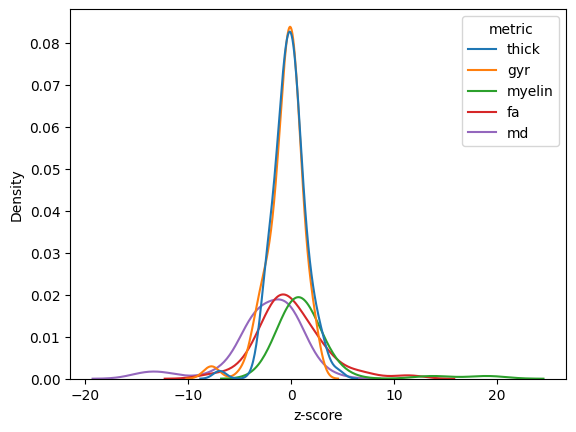

In [571]:
sns.kdeplot(data=epi_zscore_hemiL_df,x='z-score',hue='metric')

<AxesSubplot: xlabel='z-score', ylabel='Density'>

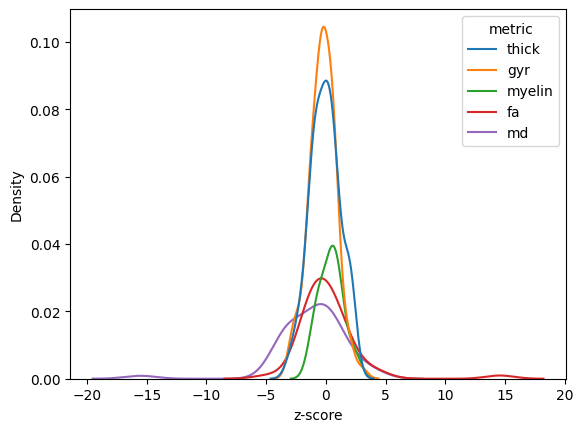

In [466]:
sns.kdeplot(data=epi_zscore_hemiR_df,x='z-score',hue='metric')

In [1071]:
tle_zscore_melt_df[tle_zscore_melt_df.metric == 'thick']

,mri_mts_bool,metric_hemi,z-score,mri_mts,metric,hemi
0,N,thick_L,-1.138475,N,thick,L
1,N,thick_L,1.390811,N,thick,L
2,N,thick_L,-0.063211,N,thick,L
3,N,thick_L,1.108195,N,thick,L
4,N,thick_L,0.186669,N,thick,L
...,...,...,...,...,...,...
203,N,thick_R,-1.220956,N,thick,R
204,N,thick_R,1.818658,N,thick,R
205,N,thick_R,-1.099023,N,thick,R
206,N,thick_R,-2.556595,N,thick,R


In [ ]:
tle_zscore_melt_df[tle_zscore_melt_df.metric == 'thick']

In [1021]:
list(TLE_zscore_df.columns)[:-1]

['thick_L',
 'thick_R',
 'gyr_L',
 'gyr_R',
 'myelin_L',
 'myelin_R',
 'fa_L',
 'fa_R',
 'md_L',
 'md_R']

In [1079]:
tle_zscore_melt_df = TLE_zscore_df.melt(id_vars='mri_mts',value_vars=list(TLE_zscore_df.columns)[:-1])

In [1023]:
tle_zscore_melt_df.columns = ['mri_mts_bool', 'metric_hemi', 'z-score']

In [1024]:
tle_zscore_melt_df['mri_mts'] = np.where(tle_zscore_melt_df['mri_mts_bool'], 'Y','N')

In [1025]:
tle_zscore_melt_df['mri_mts_bool'] = tle_zscore_melt_df['mri_mts']


In [1026]:
tle_zscore_melt_df['metric'] = tle_zscore_melt_df.metric_hemi.str.replace('_L','').str.replace('_R','')

In [1027]:
tle_zscore_melt_df['hemi'] =(tle_zscore_melt_df.metric_hemi.str.replace('thick_','')
 .str.replace('gyr_','')
 .str.replace('myelin_','')
 .str.replace('fa_','')
 .str.replace('md_',''))

In [1028]:
tle_zscore_melt_df.head()

,mri_mts_bool,metric_hemi,z-score,mri_mts,metric,hemi
0,N,thick_L,-1.138475,N,thick,L
1,N,thick_L,1.390811,N,thick,L
2,N,thick_L,-0.063211,N,thick,L
3,N,thick_L,1.108195,N,thick,L
4,N,thick_L,0.186669,N,thick,L


In [ ]:
hue_plot_params = {
    'data': tle_zscore_melt_df,
    'x': 'metric',
    'y': 'z-score',
    "order": subcat_order,
    "hue": "State",
    "hue_order": states_order,
    "palette": states_palette
}

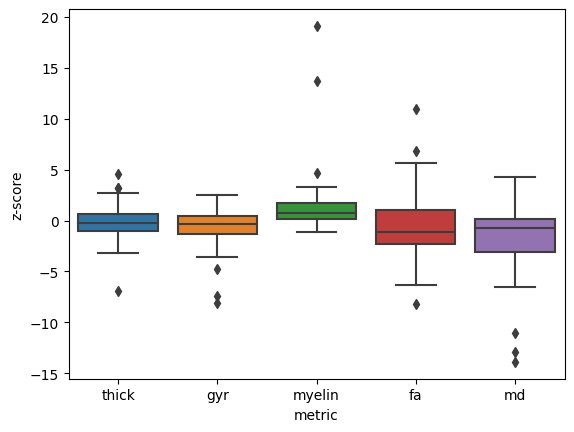

In [467]:
ax = sns.boxplot(data=epi_zscore_hemiL_df,x='metric',y='z-score')

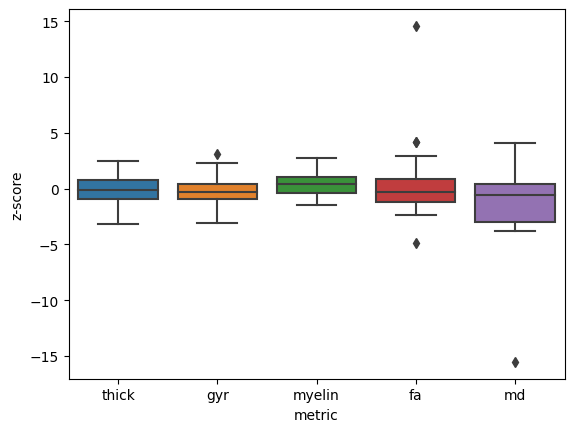

In [468]:
ax = sns.boxplot(data=epi_zscore_hemiR_df,x='metric',y='z-score')

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

thick vs. gyr: Mann-Whitney-Wilcoxon test two-sided, P_val:2.352e-01 U_stat=5.868e+03
gyr vs. myelin: Mann-Whitney-Wilcoxon test two-sided, P_val:5.275e-07 U_stat=8.770e+02
myelin vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:2.005e-04 U_stat=1.366e+03
fa vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:1.512e-01 U_stat=1.403e+03
thick vs. myelin: Mann-Whitney-Wilcoxon test two-sided, P_val:2.265e-05 U_stat=1.056e+03
gyr vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:4.351e-01 U_stat=2.722e+03
myelin vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:4.965e-07 U_stat=1.519e+03
thick vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:1.076e-01 U_stat=2.960e+03
gyr vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:2.727e-02 U_stat=3.084e+03
thick vs. md: Mann-Whitney-Wilcoxon test 

(<AxesSubplot: xlabel='metric', ylabel='z-score'>,
  <statannotations.Annotation.Annotation at 0x7f6355faef40>])

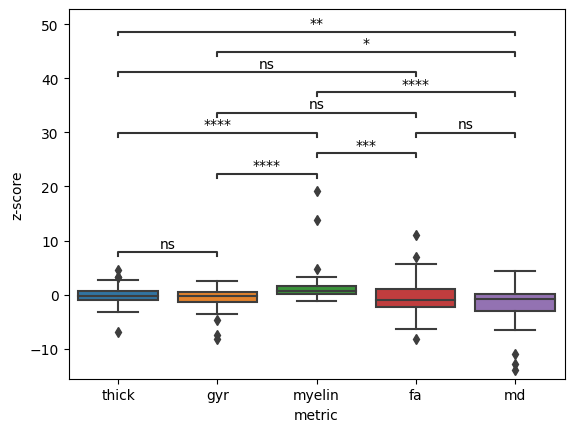

In [469]:
plotting_parameters = {
    'data': epi_zscore_hemiL_df,
    'x' : 'metric',
    'y' : 'z-score'
}

ax = sns.boxplot(**plotting_parameters)

pairs_initial = [('thick','gyr'), ('thick','myelin'), ('thick','fa'), ('thick','md'),
                 ('gyr','myelin'), ('gyr','fa'),('gyr','md'),
                 ('myelin','fa'),('myelin','md'),
                 ('fa','md')]

annot = Annotator(ax, pairs_initial, **plotting_parameters)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

thick vs. gyr: Mann-Whitney-Wilcoxon test two-sided, P_val:2.174e-01 U_stat=5.888e+03
gyr vs. myelin: Mann-Whitney-Wilcoxon test two-sided, P_val:1.271e-03 U_stat=1.263e+03
myelin vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:4.953e-02 U_stat=1.161e+03
fa vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:3.608e-02 U_stat=1.496e+03
thick vs. myelin: Mann-Whitney-Wilcoxon test two-sided, P_val:2.844e-02 U_stat=1.500e+03
gyr vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:6.418e-01 U_stat=2.405e+03
myelin vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:5.721e-04 U_stat=1.334e+03
thick vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:7.738e-01 U_stat=2.622e+03
gyr vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:3.427e-02 U_stat=3.061e+03
thick vs. md: Mann-Whitney-Wilcoxon test 

(<AxesSubplot: xlabel='metric', ylabel='z-score'>,
  <statannotations.Annotation.Annotation at 0x7f6356afd550>])

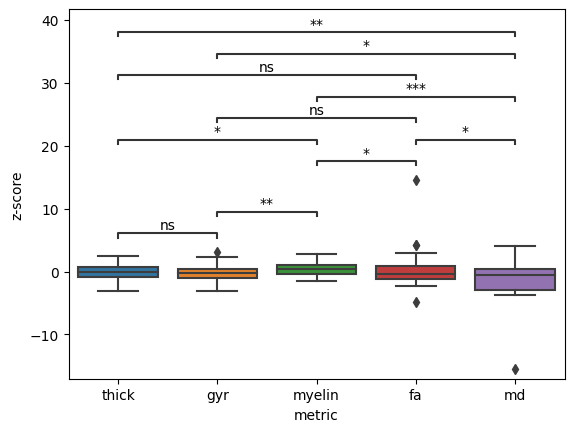

In [470]:
plotting_parameters = {
    'data': epi_zscore_hemiR_df,
    'x' : 'metric',
    'y' : 'z-score'
}

ax = sns.boxplot(**plotting_parameters)

pairs_initial = [('thick','gyr'), ('thick','myelin'), ('thick','fa'), ('thick','md'),
                 ('gyr','myelin'), ('gyr','fa'),('gyr','md'),
                 ('myelin','fa'),('myelin','md'),
                 ('fa','md')]

annot = Annotator(ax, pairs_initial, **plotting_parameters)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

In [1043]:
plotting_parameters('L')

{'data':     mri_mts_bool metric_hemi   z-score mri_mts metric hemi
 0              N     thick_L -1.138475       N  thick    L
 1              N     thick_L  1.390811       N  thick    L
 2              N     thick_L -0.063211       N  thick    L
 3              N     thick_L  1.108195       N  thick    L
 4              N     thick_L  0.186669       N  thick    L
 ..           ...         ...       ...     ...    ...  ...
 931            N        md_L -1.110676       N     md    L
 932            N        md_L  3.217983       N     md    L
 933            N        md_L -0.600399       N     md    L
 934            N        md_L -2.635902       N     md    L
 935            N        md_L -1.851609       N     md    L
 
 [520 rows x 6 columns],
 'x': 'metric',
 'y': 'z-score'}

In [159]:

epi_zscore_hemiL_df[epi_zscore_hemiL_df.dataset == 'snsx']


,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization,metric,z-score
0,sub-P008,26.0,f,snsx,snsx,1.0,0.0,0.0,thick,-1.133658
1,sub-P012,28.0,m,snsx,snsx,0.0,0.0,0.0,thick,1.399352
2,sub-P013,37.0,f,snsx,snsx,1.0,0.0,0.0,thick,-0.067223
3,sub-P014,33.0,m,snsx,snsx,1.0,0.0,0.0,thick,1.112405
4,sub-P015,19.0,f,snsx,snsx,0.0,0.0,0.0,thick,0.178081
...,...,...,...,...,...,...,...,...,...,...
308,sub-P080,51.0,m,snsx,snsx,1.0,1.0,3.0,md,0.235577
309,sub-P081,57.0,m,snsx,snsx,1.0,0.0,0.0,md,-13.458363
310,sub-P092,26.0,f,snsx,snsx,0.0,0.0,0.0,md,-7.023072
311,sub-P100,41.0,f,snsx,snsx,1.0,0.0,0.0,md,-3.532753


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

thick vs. gyr: Mann-Whitney-Wilcoxon test two-sided, P_val:2.352e-01 U_stat=5.868e+03
gyr vs. myelin: Mann-Whitney-Wilcoxon test two-sided, P_val:5.275e-07 U_stat=8.770e+02
myelin vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:2.005e-04 U_stat=1.366e+03
fa vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:1.512e-01 U_stat=1.403e+03
thick vs. myelin: Mann-Whitney-Wilcoxon test two-sided, P_val:2.265e-05 U_stat=1.056e+03
gyr vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:4.351e-01 U_stat=2.722e+03
myelin vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:4.965e-07 U_stat=1.519e+03
thick vs. fa: Mann-Whitney-Wilcoxon test two-sided, P_val:1.076e-01 U_stat=2.960e+03
gyr vs. md: Mann-Whitney-Wilcoxon test two-sided, P_val:2.727e-02 U_stat=3.084e+03
thick vs. md: Mann-Whitney-Wilcoxon test 

(<AxesSubplot: xlabel='metric', ylabel='z-score'>,
  <statannotations.Annotation.Annotation at 0x7f6354ed1100>])

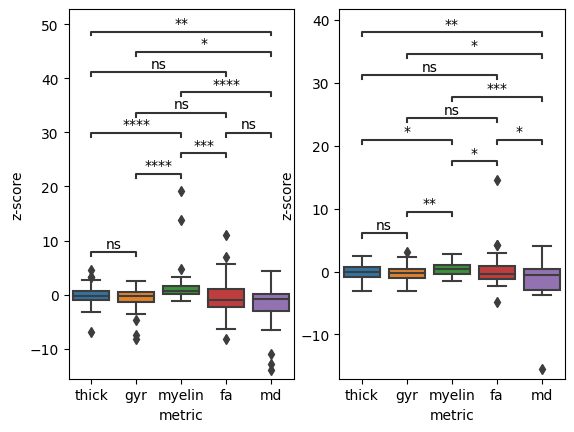

In [471]:
fig, ax = plt.subplots(1,2)

plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score' }

hemiL = { 'data': epi_zscore_hemiL_df, 'x' : 'metric', 'y' : 'z-score' }
hemiR = { 'data': epi_zscore_hemiR_df, 'x' : 'metric', 'y' : 'z-score' }

sns.boxplot(ax=ax[0],**hemiL)

pairs_initial = [('thick','gyr'), ('thick','myelin'), ('thick','fa'), ('thick','md'),
                 ('gyr','myelin'), ('gyr','fa'),('gyr','md'),
                 ('myelin','fa'),('myelin','md'),
                 ('fa','md')]

annot = Annotator(ax[0], pairs_initial, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_initial, **hemiR)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()


In [635]:
pairs_hue = [[('thick',1), ('thick',0)],
             [('gyr',1), ('gyr',0)],
             [('myelin',1),('myelin',0)],
             [('fa',1),('fa',0)],
             [('md',1),('md',0)]
            ]

mri_mts_order = [1,0]

In [479]:
epi_zscore_hemiL_df.mri_mts.value_counts()

0.0    180
1.0     53
Name: mri_mts, dtype: int64

In [121]:
epi_zscore_hemiL_df.mri_mts.value_counts()

NameError: name 'epi_zscore_hemiL_df' is not defined

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:6.108e-01 U_stat=4.370e+02
thick_0.0 vs. thick_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=3.860e+02
myelin_0.0 vs. myelin_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=6.500e+01
fa_0.0 vs. fa_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=1.070e+02
md_0.0 vs. md_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=1.150e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr

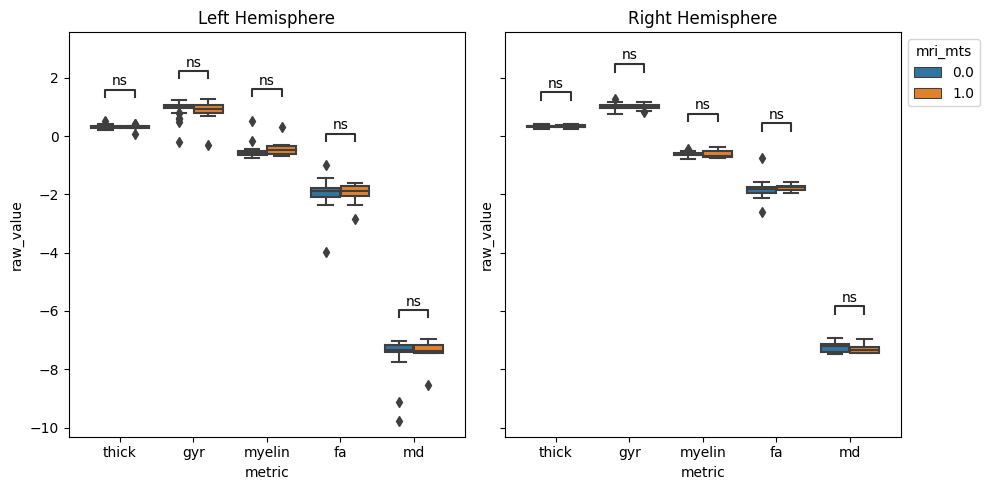

In [637]:

fig, ax = plt.subplots( 1, 2, figsize=(10,5), sharey=True)

# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

hemiL_df = epi_zscore_df[epi_zscore_df['hemi'] == 'L']
hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

hemiL = { 'data': hemiL_df, 'x' : 'metric', 'y' : hemiL_df['raw_value'], 'hue':'mri_mts' }
hemiR = { 'data': hemiR_df, 'x' : 'metric', 'y' : hemiR_df['raw_value'], 'hue':'mri_mts' }

sns.boxplot(ax=ax[0],**hemiL)

annot = Annotator(ax[0], pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_hue, **hemiR)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0].title.set_text('Left Hemisphere')
ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

In [700]:
snsx_merge_cols = ['participant_id', 'hemi','ipsilateral_lateralization', 'ipsilateral_TLE',
       'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)',
       'ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)', 'dataset']

In [701]:
snsx_epi_zscore_df = pd.merge(epi_zscore_df,snsx_vol_df3[snsx_merge_cols],on=['participant_id','hemi','dataset'],how='left')
snsx_epi_zscore_df = snsx_epi_zscore_df[snsx_epi_zscore_df.dataset == 'snsx']

In [704]:
snsx_epi_zscore_df['ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)'].value_counts()

0.0    140
1.0     23
Name: ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0), dtype: int64

In [685]:
snsx_vol_df3[snsx_merge_cols]

,participant_id,hemi,ipsilateral_lateralization,ipsilateral_TLE,ipsilateral_TLE_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-epi=0),ipsilateral_mts_non_epi (TLE=1/non-epi=0),ipsilateral_mts_control (TLE=1/cntrl=0),ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0),dataset
0,sub-P065,L,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx
4,sub-P100,L,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN,snsx
6,sub-P010,L,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx
8,sub-P064,L,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx
12,sub-P006,L,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,snsx
...,...,...,...,...,...,...,...,...,...,...,...
239,sub-C012,R,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,snsx
241,sub-P008,R,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN,snsx
243,sub-P077,R,1.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx
245,sub-P012,R,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,snsx


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:6.527e-02 U_stat=4.550e+02
thick_0.0 vs. thick_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:3.748e-01 U_stat=4.240e+02
myelin_0.0 vs. myelin_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:4.935e-01 U_stat=7.300e+01
fa_0.0 vs. fa_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:7.484e-01 U_stat=1.080e+02
md_0.0 vs. md_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:8.062e-01 U_stat=1.100e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=3.670e+02
thick_0.0 vs. thick_1.0: Mann-W

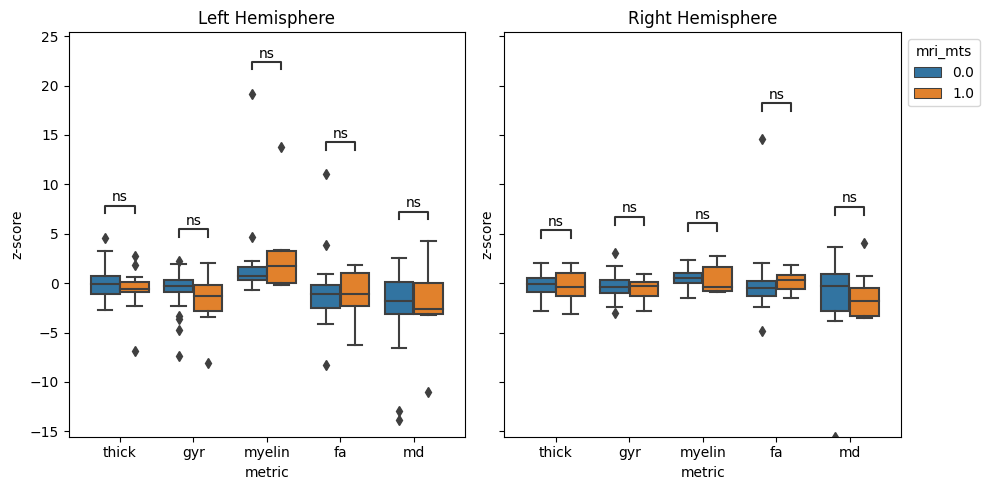

In [480]:
fig, ax = plt.subplots( 1, 2, figsize=(10,5), sharey=True)

plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

hemiL = { 'data': epi_zscore_hemiL_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
hemiR = { 'data': epi_zscore_hemiR_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

sns.boxplot(ax=ax[0],**hemiL)

annot = Annotator(ax[0], pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_hue, **hemiR)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0].title.set_text('Left Hemisphere')
ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

In [486]:
epi_zscore_hemiL_df.TLE == 1

0       True
1      False
2       True
3       True
4      False
       ...  
338    False
339    False
340    False
341     True
342     True
Name: TLE, Length: 343, dtype: bool

In [490]:
epi_zscore_hemiL_df[epi_zscore_hemiL_df.TLE == 1].mri_mts.value_counts()

0.0    81
1.0    43
Name: mri_mts, dtype: int64

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize=(10,5), sharey=True)

plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

hemiL = { 'data': epi_zscore_hemiL_df[epi_zscore_hemiL_df.TLE == 1], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
hemiR = { 'data': epi_zscore_hemiR_df[epi_zscore_hemiR_df.TLE == 1], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

sns.boxplot(ax=ax[0],**hemiL)

annot = Annotator(ax[0], pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_hue, **hemiR)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0].title.set_text('Left Hemisphere')
ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:7.754e-01 U_stat=3.860e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:6.687e-01 U_stat=3.400e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.222e-01 U_stat=4.370e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

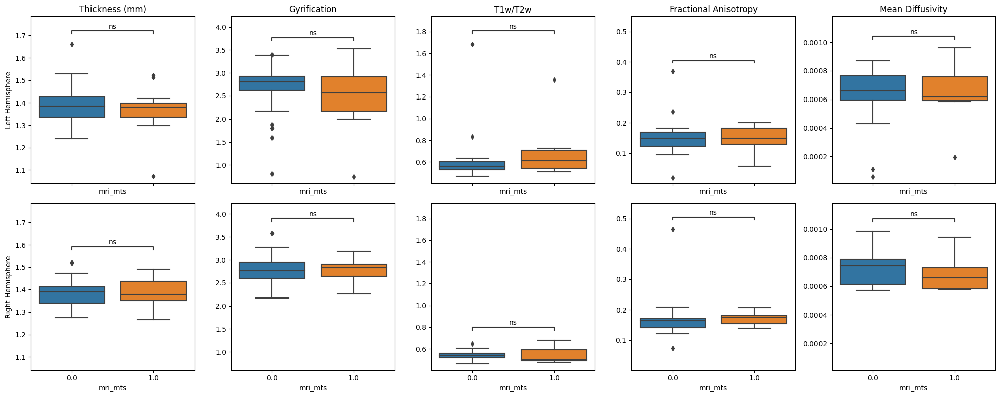

In [706]:
fig, ax = plt.subplots( 2, 5, figsize=(20,8),sharex='col',sharey='col')

hue_arg =  'mri_mts'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    hemiL_df = epi_zscore_df[epi_zscore_df['hemi'] == 'L']
    hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    hemiL_df = hemiL_df[hemiL_df['metric'] == met]
    hemiR_df = hemiR_df[hemiR_df['metric'] == met]


    hemiL = { 'data': hemiL_df, 'x' : hue_arg, 'y' : 'raw_value'}
    hemiR = { 'data': hemiR_df, 'x' : hue_arg, 'y' : 'raw_value'}

    sns.boxplot(ax=ax[0][idx],**hemiL)

    annot = Annotator(ax[0][idx], [(0,1)], **hemiL)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

    sns.boxplot(ax=ax[1][idx],**hemiR)

    annot = Annotator(ax[1][idx],[(0,1)], **hemiR)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    ax[0][idx].set_title(metric_full_names[idx])
    ax[0][idx].set_ylabel('')
    ax[1][idx].set_ylabel('')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')
ax[0][0].set_ylabel('Left Hemisphere')
ax[1][0].set_ylabel('Right Hemisphere')
fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:5.188e-02 U_stat=1.650e+02
thick_0.0 vs. thick_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:2.862e-01 U_stat=1.550e+02
myelin_0.0 vs. myelin_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:9.661e-01 U_stat=3.800e+01
fa_0.0 vs. fa_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:8.773e-01 U_stat=4.800e+01
md_0.0 vs. md_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:7.573e-01 U_stat=4.100e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=1.270e+02
thick_0.0 vs. thick_1.0: Mann-W

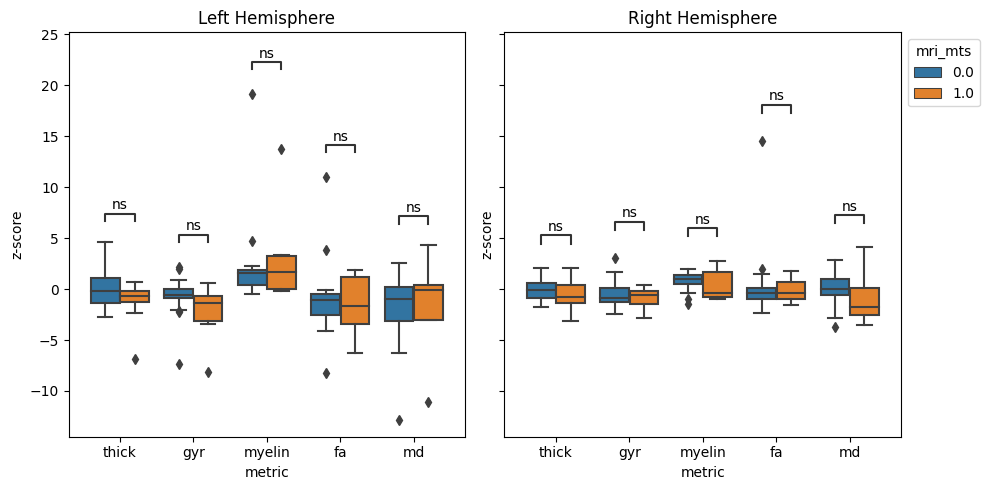

In [487]:
fig, ax = plt.subplots( 1, 2, figsize=(10,5), sharey=True)

plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

hemiL = { 'data': epi_zscore_hemiL_df[epi_zscore_hemiL_df.TLE == 1], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
hemiR = { 'data': epi_zscore_hemiR_df[epi_zscore_hemiR_df.TLE == 1], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }

sns.boxplot(ax=ax[0],**hemiL)

annot = Annotator(ax[0], pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_hue, **hemiR)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0].title.set_text('Left Hemisphere')
ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:5.829e-01 U_stat=6.730e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:5.598e-01 U_stat=5.720e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:6.741e-01 U_stat=6.480e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

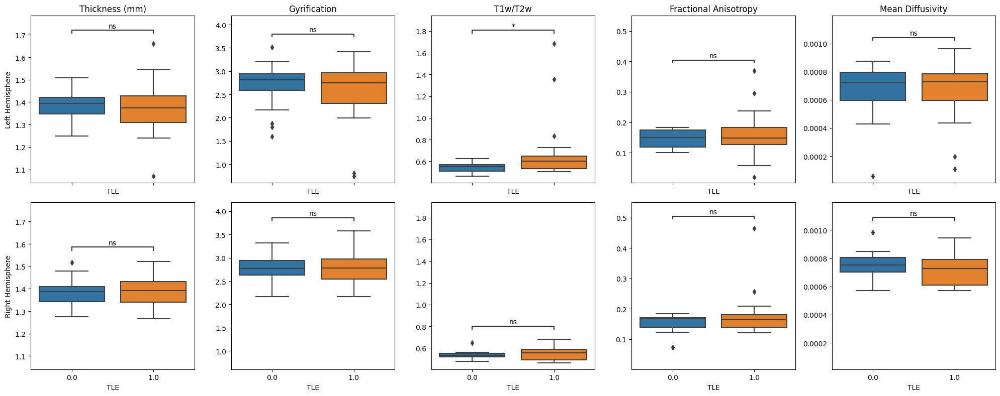

In [705]:
fig, ax = plt.subplots( 2, 5, figsize=(20,8),sharex='col',sharey='col')

hue_arg =  'TLE'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    hemiL_df = epi_zscore_df[epi_zscore_df['hemi'] == 'L']
    hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    hemiL_df = hemiL_df[hemiL_df['metric'] == met]
    hemiR_df = hemiR_df[hemiR_df['metric'] == met]


    hemiL = { 'data': hemiL_df, 'x' : hue_arg, 'y' : 'raw_value'}
    hemiR = { 'data': hemiR_df, 'x' : hue_arg, 'y' : 'raw_value'}

    sns.boxplot(ax=ax[0][idx],**hemiL)

    annot = Annotator(ax[0][idx], [(0,1)], **hemiL)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

    sns.boxplot(ax=ax[1][idx],**hemiR)

    annot = Annotator(ax[1][idx],[(0,1)], **hemiR)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    ax[0][idx].set_title(metric_full_names[idx])
    ax[0][idx].set_ylabel('')
    ax[1][idx].set_ylabel('')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')
ax[0][0].set_ylabel('Left Hemisphere')
ax[1][0].set_ylabel('Right Hemisphere')
fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:3.658e-01 U_stat=6.900e+02
thick_0.0 vs. thick_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:1.987e-01 U_stat=7.380e+02
myelin_0.0 vs. myelin_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:2.655e-02 U_stat=9.100e+01
fa_0.0 vs. fa_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:9.179e-01 U_stat=1.410e+02
md_0.0 vs. md_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:1.000e+00 U_stat=1.380e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=6.580e+02
thick_0.0 vs. thick_1.0: Mann-W

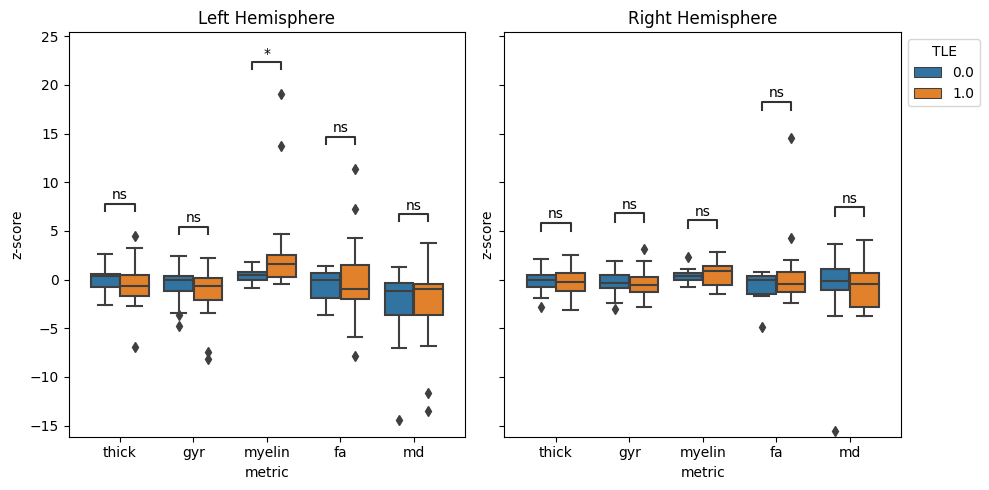

In [707]:
fig, ax = plt.subplots( 1, 2, figsize=(10,5), sharey=True)

plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }

hemiL = { 'data': epi_zscore_hemiL_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }
hemiR = { 'data': epi_zscore_hemiR_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }

sns.boxplot(ax=ax[0],**hemiL)

annot = Annotator(ax[0], pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_hue, **hemiR)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0].title.set_text('Left Hemisphere')
ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

In [670]:
metric_full_names = ['Thickness (mm)',
                     'Gyrification',
                     'T1w/T2w',
                     'Fractional Anisotropy',
                     'Mean Diffusivity']

In [674]:
epi_zscore_df

,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization,metric,z-score,raw_value,hemi,ipsi_mts,ipsi_mts_nontle
0,sub-P008,26.0,F,snsx,snsx,1.0,0.0,0.0,thick,-1.137848,1.312794,L,0.0,0.0
1,sub-P012,28.0,M,snsx,snsx,0.0,0.0,0.0,thick,1.375994,1.490842,L,0.0,0.0
2,sub-P013,37.0,F,snsx,snsx,1.0,0.0,0.0,thick,-0.091605,1.373383,L,0.0,0.0
3,sub-P014,33.0,M,snsx,snsx,1.0,0.0,0.0,thick,1.081537,1.478517,L,0.0,0.0
4,sub-P015,19.0,F,snsx,snsx,0.0,0.0,0.0,thick,0.176774,1.377424,L,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338,sub-TWH0042,44.0,M,eplink,eplink,NaN,NaN,NaN,md,-0.417864,0.000723,R,NaN,NaN
339,sub-TWH0050,27.0,M,eplink,eplink,NaN,NaN,NaN,md,-0.672964,0.000713,R,NaN,NaN
340,sub-TWH0052,28.0,F,eplink,eplink,NaN,NaN,NaN,md,-0.429802,0.000730,R,NaN,NaN
341,sub-TWH0054,37.0,F,eplink,eplink,1.0,NaN,NaN,md,-0.914777,0.000704,R,NaN,NaN


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:4.887e-01 U_stat=1.186e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.515e-02 U_stat=1.326e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:9.519e-02 U_stat=1.850e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

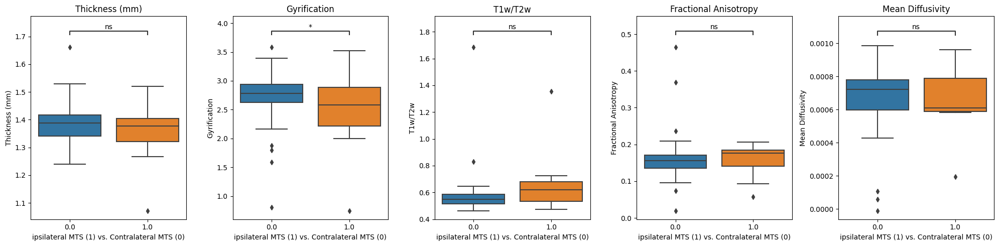

In [672]:

fig, ax = plt.subplots( 1,5, figsize=(20,5))

hue_arg =  'ipsi_mts'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    hemiL_df = epi_zscore_df
    # hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    hemiL_df = hemiL_df[hemiL_df['metric'] == met]



    hemiL = { 'data': hemiL_df, 'x' : hue_arg, 'y' : 'raw_value'}
    # hemiR = { 'data': hemiR_df, 'x' : hue_arg, 'y' : 'raw_value'}

    sns.boxplot(ax=ax[idx],**hemiL)

    annot = Annotator(ax[idx], [(0,1)], **hemiL)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

#     sns.boxplot(ax=ax[idx][1],**hemiR)

#     annot = Annotator(ax[idx][1],[(0,1)], **hemiR)
#     annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    ax[idx].set_title(metric_full_names[idx])
    ax[idx].set_ylabel(metric_full_names[idx])
    ax[idx].set_xlabel('ipsilateral MTS (1) vs. Contralateral MTS (0)')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:2.009e-02 U_stat=1.358e+03
thick_0.0 vs. thick_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:1.497e-01 U_stat=1.300e+03
myelin_0.0 vs. myelin_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:1.576e-01 U_stat=2.000e+02
fa_0.0 vs. fa_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:4.222e-01 U_stat=2.960e+02
md_0.0 vs. md_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:8.456e-01 U_stat=3.610e+02


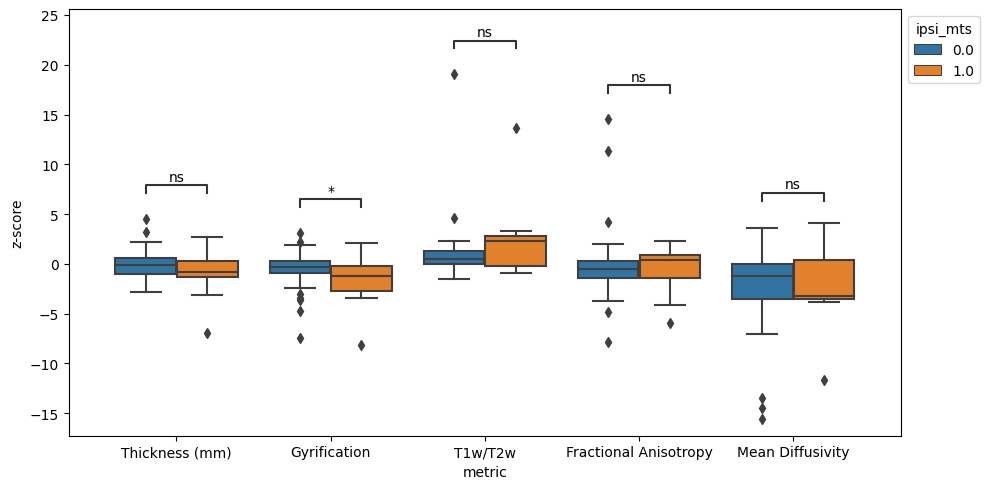

In [712]:
fig, ax = plt.subplots( figsize=(10,5), sharey=True)

hue_args = 'ipsi_mts'
plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }

hemiL = { 'data': epi_zscore_df, 'x' : 'metric', 'y' : 'z-score', 'hue':hue_args }
# hemiR = { 'data': epi_zscore_hemiR_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }

sns.boxplot(ax=ax,**hemiL)

annot = Annotator(ax, pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

# sns.boxplot(ax=ax[1],**hemiR)

# annot = Annotator(ax[1], pairs_hue, **hemiR)
# annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax.get_legend().set_visible(False)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

ax.set_xticklabels(metric_full_names)
# ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:4.887e-01 U_stat=1.186e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.497e-01 U_stat=1.300e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.515e-02 U_stat=1.326e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

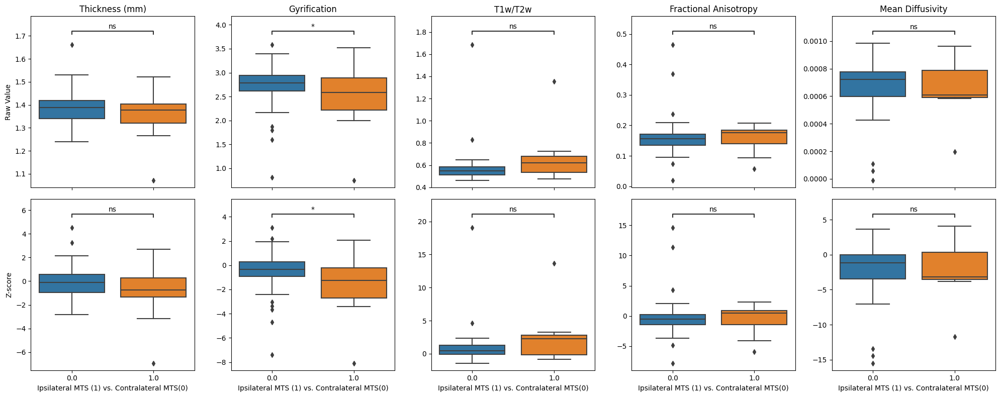

In [731]:

fig, ax = plt.subplots( 2,5, figsize=(20,8),sharex='col')

hue_arg =  'ipsi_mts'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    zscore_df = epi_zscore_df
    # hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    zscore_df = zscore_df[zscore_df['metric'] == met]


    raw_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'raw_value'}
    zscore_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'z-score'}
    

    sns.boxplot(ax=ax[0][idx],**raw_plot_args)

    annot = Annotator(ax[0][idx], [(0,1)], **raw_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

    sns.boxplot(ax=ax[1][idx],**zscore_plot_args)

    annot = Annotator(ax[1][idx],[(0,1)], **zscore_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    ax[0][idx].set_ylabel('')
    ax[1][idx].set_ylabel('')
    
    ax[0][idx].set_title(metric_full_names[idx])
    ax[0][idx].set_xlabel('')
    ax[1][idx].set_xlabel('Ipsilateral MTS (1) vs. Contralateral MTS(0)')
    # ax[idx].set_title(metric_full_names[idx])
    # ax[idx].set_ylabel(metric_full_names[idx])
    # ax[idx].set_xlabel('ipsilateral MTS (1) vs. non-TLE epilepsy (0)')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')
ax[0][0].set_ylabel('Raw Value')
ax[1][0].set_ylabel('Z-score')

fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:4.188e-01 U_stat=1.270e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.253e-01 U_stat=1.386e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.348e-02 U_stat=1.402e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

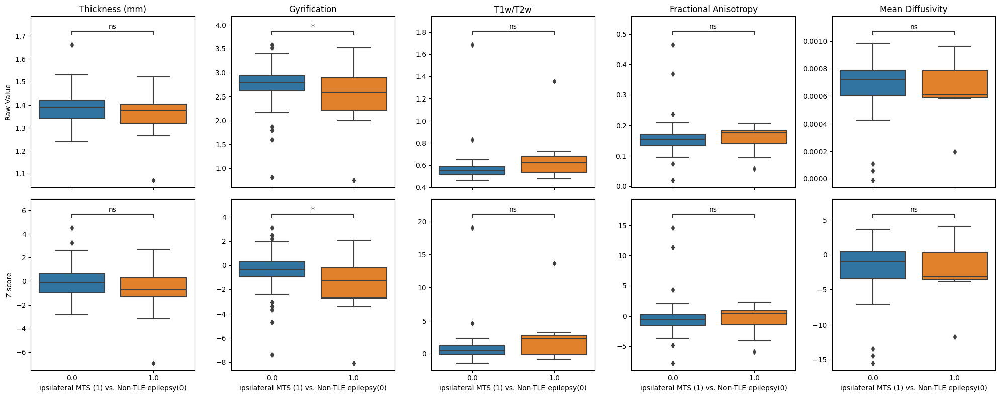

In [728]:

fig, ax = plt.subplots( 2,5, figsize=(20,8),sharex='col')

hue_arg =  'ipsi_mts_nontle'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    zscore_df = epi_zscore_df
    # hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    zscore_df = zscore_df[zscore_df['metric'] == met]


    raw_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'raw_value'}
    zscore_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'z-score'}
    

    sns.boxplot(ax=ax[0][idx],**raw_plot_args)

    annot = Annotator(ax[0][idx], [(0,1)], **raw_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

    sns.boxplot(ax=ax[1][idx],**zscore_plot_args)

    annot = Annotator(ax[1][idx],[(0,1)], **zscore_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    
    ax[0][idx].set_ylabel('')
    ax[1][idx].set_ylabel('')
    
    
    ax[0][idx].set_title(metric_full_names[idx])
    ax[0][idx].set_xlabel('')
    ax[1][idx].set_xlabel('ipsilateral MTS (1) vs. Non-TLE epilepsy(0)')
    # ax[idx].set_title(metric_full_names[idx])
    # ax[idx].set_ylabel(metric_full_names[idx])
    # ax[idx].set_xlabel('ipsilateral MTS (1) vs. non-TLE epilepsy (0)')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')
ax[0][0].set_ylabel('Raw Value')
ax[1][0].set_ylabel('Z-score')

fig.tight_layout()

In [720]:
snsx_epi_zscore_df['ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)'

,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization,metric,z-score,raw_value,hemi,ipsi_mts,ipsi_mts_nontle,ipsilateral_lateralization,ipsilateral_TLE,ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)
0,sub-P008,26.0,F,snsx,snsx,1.0,0.0,0.0,thick,-1.137848,1.312794,L,0.0,0.0,0.0,0.0,NaN,NaN
1,sub-P012,28.0,M,snsx,snsx,0.0,0.0,0.0,thick,1.375994,1.490842,L,0.0,0.0,0.0,0.0,0.0,0.0
2,sub-P013,37.0,F,snsx,snsx,1.0,0.0,0.0,thick,-0.091605,1.373383,L,0.0,0.0,0.0,0.0,NaN,NaN
3,sub-P014,33.0,M,snsx,snsx,1.0,0.0,0.0,thick,1.081537,1.478517,L,0.0,0.0,1.0,1.0,1.0,NaN
4,sub-P015,19.0,F,snsx,snsx,0.0,0.0,0.0,thick,0.176774,1.377424,L,0.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
661,sub-P080,51.0,M,snsx,snsx,1.0,1.0,3.0,md,4.086341,0.000944,R,1.0,1.0,NaN,NaN,NaN,NaN
662,sub-P081,57.0,M,snsx,snsx,1.0,0.0,0.0,md,0.478129,0.000770,R,0.0,0.0,0.0,0.0,NaN,NaN
663,sub-P092,26.0,F,snsx,snsx,0.0,0.0,0.0,md,-0.567639,0.000724,R,0.0,0.0,0.0,0.0,0.0,0.0
664,sub-P100,41.0,F,snsx,snsx,1.0,0.0,0.0,md,0.042655,0.000750,R,0.0,0.0,1.0,1.0,1.0,NaN


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:6.828e-01 U_stat=4.220e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:2.142e-01 U_stat=4.740e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:7.006e-02 U_stat=4.880e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

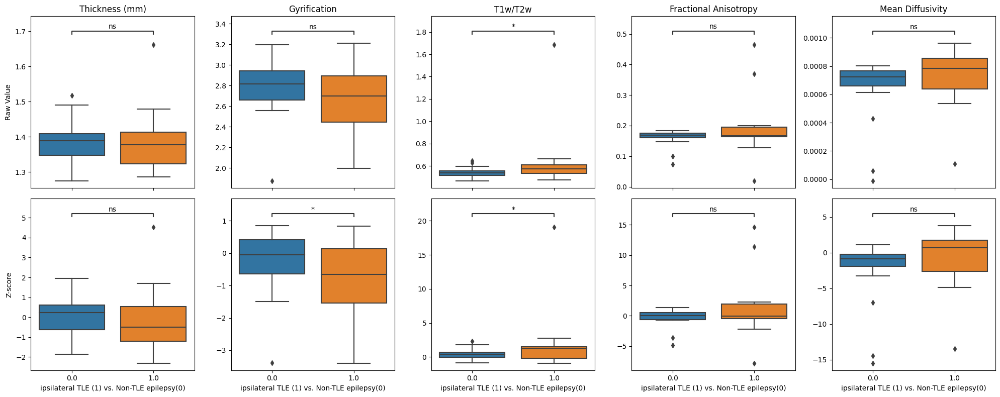

In [729]:

fig, ax = plt.subplots( 2,5, figsize=(20,8),sharex='col')

hue_arg =  'ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0)'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    zscore_df = snsx_epi_zscore_df
    # hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    zscore_df = zscore_df[zscore_df['metric'] == met]


    raw_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'raw_value'}
    zscore_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'z-score'}
    

    sns.boxplot(ax=ax[0][idx],**raw_plot_args)

    annot = Annotator(ax[0][idx], [(0,1)], **raw_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

    sns.boxplot(ax=ax[1][idx],**zscore_plot_args)

    annot = Annotator(ax[1][idx],[(0,1)], **zscore_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    
    ax[0][idx].set_ylabel('')
    ax[1][idx].set_ylabel('')
    
    ax[0][idx].set_title(metric_full_names[idx])
    ax[0][idx].set_xlabel('')
    ax[1][idx].set_xlabel('ipsilateral TLE (1) vs. Non-TLE epilepsy(0)')
    # ax[idx].set_title(metric_full_names[idx])
    # ax[idx].set_ylabel(metric_full_names[idx])
    # ax[idx].set_xlabel('ipsilateral MTS (1) vs. non-TLE epilepsy (0)')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')
ax[0][0].set_ylabel('Raw Value')
ax[1][0].set_ylabel('Z-score')

fig.tight_layout()

In [723]:
snsx_epi_zscore_df['ip

,participant_id,age,sex,site,dataset,TLE,mri_mts,mri_mts_localization,metric,z-score,raw_value,hemi,ipsi_mts,ipsi_mts_nontle,ipsilateral_lateralization,ipsilateral_TLE,ipsilateral_TLE_non_epi (TLE=1/non-tle-epi=0),ipsilateral_mts_non_tle_epi (TLE=1/non-tle-epi=0)
0,sub-P008,26.0,F,snsx,snsx,1.0,0.0,0.0,thick,-1.137848,1.312794,L,0.0,0.0,0.0,0.0,NaN,NaN
1,sub-P012,28.0,M,snsx,snsx,0.0,0.0,0.0,thick,1.375994,1.490842,L,0.0,0.0,0.0,0.0,0.0,0.0
2,sub-P013,37.0,F,snsx,snsx,1.0,0.0,0.0,thick,-0.091605,1.373383,L,0.0,0.0,0.0,0.0,NaN,NaN
3,sub-P014,33.0,M,snsx,snsx,1.0,0.0,0.0,thick,1.081537,1.478517,L,0.0,0.0,1.0,1.0,1.0,NaN
4,sub-P015,19.0,F,snsx,snsx,0.0,0.0,0.0,thick,0.176774,1.377424,L,0.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
661,sub-P080,51.0,M,snsx,snsx,1.0,1.0,3.0,md,4.086341,0.000944,R,1.0,1.0,NaN,NaN,NaN,NaN
662,sub-P081,57.0,M,snsx,snsx,1.0,0.0,0.0,md,0.478129,0.000770,R,0.0,0.0,0.0,0.0,NaN,NaN
663,sub-P092,26.0,F,snsx,snsx,0.0,0.0,0.0,md,-0.567639,0.000724,R,0.0,0.0,0.0,0.0,0.0,0.0
664,sub-P100,41.0,F,snsx,snsx,1.0,0.0,0.0,md,0.042655,0.000750,R,0.0,0.0,1.0,1.0,1.0,NaN


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:7.982e-01 U_stat=5.260e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:3.486e-01 U_stat=5.780e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:7.574e-02 U_stat=6.020e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.0

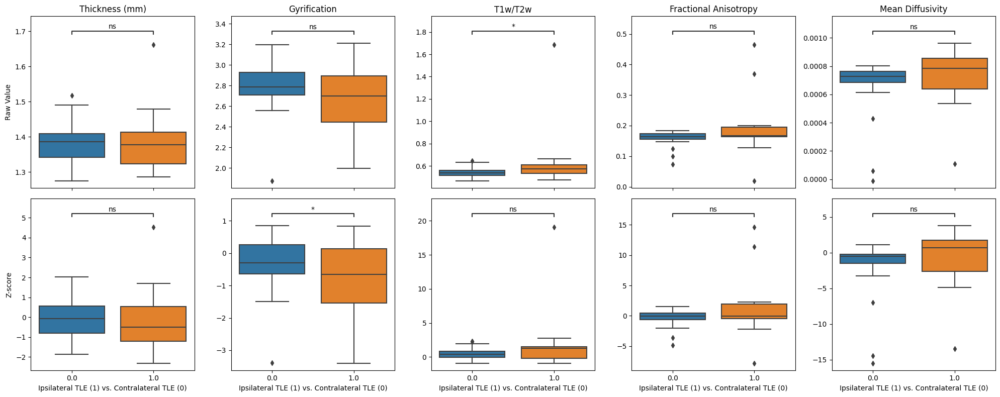

In [730]:

fig, ax = plt.subplots( 2,5, figsize=(20,8),sharex='col')

hue_arg =  'ipsilateral_TLE'
# plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'mri_mts' }
for idx, met in enumerate(metric_names):
    
    zscore_df = snsx_epi_zscore_df
    # hemiR_df = epi_zscore_df[epi_zscore_df['hemi'] == 'R']

    zscore_df = zscore_df[zscore_df['metric'] == met]


    raw_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'raw_value'}
    zscore_plot_args = { 'data': zscore_df, 'x' : hue_arg, 'y' : 'z-score'}
    

    sns.boxplot(ax=ax[0][idx],**raw_plot_args)

    annot = Annotator(ax[0][idx], [(0,1)], **raw_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

    sns.boxplot(ax=ax[1][idx],**zscore_plot_args)

    annot = Annotator(ax[1][idx],[(0,1)], **zscore_plot_args)
    annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()
    
    ax[0][idx].set_ylabel('')
    ax[1][idx].set_ylabel('')
    
    
    ax[0][idx].set_title(metric_full_names[idx])
    ax[0][idx].set_xlabel('')
    ax[1][idx].set_xlabel('Ipsilateral TLE (1) vs. Contralateral TLE (0)')
    # ax[idx].set_title(metric_full_names[idx])
    # ax[idx].set_ylabel(metric_full_names[idx])
    # ax[idx].set_xlabel('ipsilateral MTS (1) vs. non-TLE epilepsy (0)')
    # ax[idx][0].get_legend().set_visible(False)
    # sns.move_legend(ax[idx][1], "upper left", bbox_to_anchor=(1, 1))
#
# ax[0].title.set_text('Left Hemisphere')
# ax[1].title.set_text('Right Hemisphere')
ax[0][0].set_ylabel('Raw Value')
ax[1][0].set_ylabel('Z-score')

fig.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:3.658e-01 U_stat=6.900e+02
thick_0.0 vs. thick_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:1.987e-01 U_stat=7.380e+02
myelin_0.0 vs. myelin_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:2.655e-02 U_stat=9.100e+01
fa_0.0 vs. fa_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:9.179e-01 U_stat=1.410e+02
md_0.0 vs. md_1.0: Mann-Whitney-Wilcoxon test two-sided, P_val:1.000e+00 U_stat=1.380e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

gyr_0.0 vs. gyr_1.0: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val:1.000e+00 U_stat=6.580e+02
thick_0.0 vs. thick_1.0: Mann-W

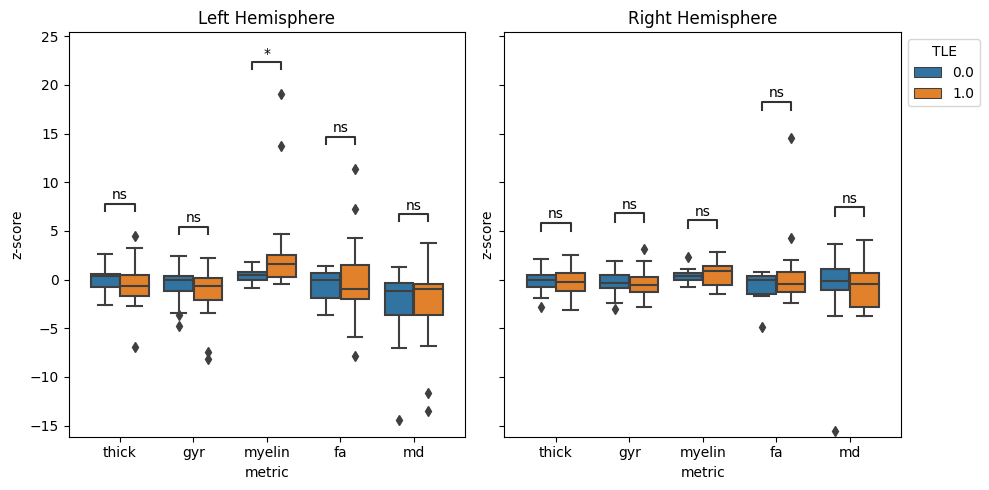

In [650]:
fig, ax = plt.subplots( 1, 2, figsize=(10,5), sharey=True)

plotting_parameters =  lambda hemi: { 'data': tle_zscore_melt_df[tle_zscore_melt_df.hemi == f'{hemi}'], 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }

hemiL = { 'data': epi_zscore_hemiL_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }
hemiR = { 'data': epi_zscore_hemiR_df, 'x' : 'metric', 'y' : 'z-score', 'hue':'TLE' }

sns.boxplot(ax=ax[0],**hemiL)

annot = Annotator(ax[0], pairs_hue, **hemiL)
annot.configure(test='Mann-Whitney', verbose=True).apply_and_annotate()

sns.boxplot(ax=ax[1],**hemiR)

annot = Annotator(ax[1], pairs_hue, **hemiR)
annot.configure(test='Mann-Whitney', comparisons_correction="bonferroni", verbose=True).apply_and_annotate()

ax[0].get_legend().set_visible(False)
sns.move_legend(ax[1], "upper left", bbox_to_anchor=(1, 1))

ax[0].title.set_text('Left Hemisphere')
ax[1].title.set_text('Right Hemisphere')

fig.tight_layout()

In [ ]:
pairs = [("thick", "gyr"), ("thick", "myelin"), ("thick", "fa"), ("thick","md"),
 ("gyr","myelin"),("gyr","fa"),("gyr","md"),
("myelin","fa"),("myelin","md"),
("fa","md")]


In [ ]:
x = 'mri_mts'
y = "

<AxesSubplot: xlabel='age', ylabel='Count'>

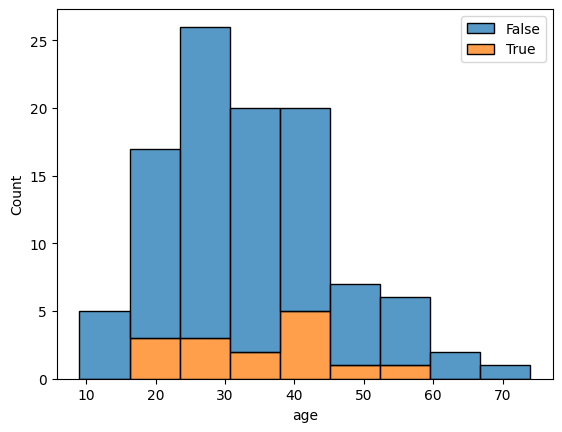

In [884]:
sns.histplot(x=pd.concat([snsx_epi_dfs_clinical[0].age, eplink_possibleTLE_dfs[0].age]),hue=pd.concat([snsx_epi_dfs_clinical[0].mri_mts, eplink_possibleTLE_dfs[0].mri_mts]).to_numpy(), multiple='stack')

In [867]:
snsx_thick_epi_zscore

AttributeError: 'list' object has no attribute 'shape'

In [ ]:
ax = sns.scatterplot(x=cov_data[3].age,y=myelin_combat['data'].mean(axis=0),hue=cov_data[3].dataset,alpha=0.6)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))